# Исследование - HR-аналитика: предсказание уровня удовлетворённости работой и вероятности увольнения сотрудников

В условиях современного рынка труда компания «Работа с заботой» сталкивается с необходимостью оптимизации управления персоналом, что становится особенно актуальным в условиях высокой текучести кадров. В рамках данного исследования мы сосредоточимся на применении методов машинного обучения для оценки уровня удовлетворённости сотрудников и предсказания вероятности их увольнения.

**Цель исследования:**
Целью данного проекта является разработка и внедрение моделей машинного обучения, которые позволят предсказывать уровень удовлетворённости сотрудников работой в компании, а также вероятность их увольнения. Это поможет HR-аналитикам принимать обоснованные решения и заранее предотвращать возможные потери ключевых кадров.

Для достижения цели необходимо решить <u>две задачи</u>:

1. **Задача 1** — построить модель, которая сможет предсказать уровень удовлетворённости сотрудника на основе данных заказчика.
2. **Задача 2** — построить модель, которая сможет на основе данных заказчика предсказать то, что сотрудник уволится из компании.

**Описание исходных данных для анализа**

Компания предоставила данные с характеристиками сотрудников компании. Среди них — уровень удовлетворённости сотрудника работой в компании. Эту информацию получили из форм обратной связи: сотрудники заполняют тест-опросник, и по его результатам рассчитывается доля их удовлетворённости от 0 до 1, где 0 — совершенно неудовлетворён, 1 — полностью удовлетворён.

Для этой задачи заказчик предоставил данные со следующими признаками:

- `id` — уникальный идентификатор сотрудника;
- `dept` — отдел, в котором работает сотрудник;
- `level` — уровень занимаемой должности;
- `workload` — уровень загруженности сотрудника;
- `employment_years` — длительность работы в компании (в годах);
- `last_year_promo` — показывает, было ли повышение за последний год;
- `last_year_violations` — показывает, нарушал ли сотрудник трудовой договор за последний год;
- `supervisor_evaluation` — оценка качества работы сотрудника, которую дал руководитель;
- `salary` — ежемесячная зарплата сотрудника;


- `job_satisfaction_rate` — уровень удовлетворённости сотрудника работой в компании, целевой признак (Задача 1).
- `quit` — увольнение сотрудника из компании, целевой признак (Задача 2).


Данные для решения каждой поставленной задачи предоставлены раздельно, и представляют собой по 3 файла со следующим содержимым:

**Задача 1: предсказание уровня удовлетворённости сотрудника:**
1. Тренировочная выборка: [train_job_satisfaction_rate.csv](https://code.s3.yandex.net/datasets/train_job_satisfaction_rate.csv)
2. Входные признаки тестовой выборки: [test_features.csv](https://code.s3.yandex.net/datasets/test_features.csv)
3. Целевой признак тестовой выборки: [test_target_job_satisfaction_rate.csv](https://code.s3.yandex.net/datasets/test_target_job_satisfaction_rate.csv)

**Задача 2: предсказание увольнения сотрудника из компании:**

1. Тренировочная выборка: [train_quit.csv](https://code.s3.yandex.net/datasets/train_quit.csv)
2. Входные признаки тестовой выборки те же, что и в прошлой задаче: [test_features.csv](https://code.s3.yandex.net/datasets/test_features.csv)
3. Целевой признак тестовой выборки: [test_target_quit.csv](https://code.s3.yandex.net/datasets/test_target_quit.csv)


<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Настройка-рабочей-среды" data-toc-modified-id="Настройка-рабочей-среды-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Настройка рабочей среды</a></span><ul class="toc-item"><li><span><a href="#Установка-и-импорт-библиотек" data-toc-modified-id="Установка-и-импорт-библиотек-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Установка и импорт библиотек</a></span></li><li><span><a href="#Объявление-констант" data-toc-modified-id="Объявление-констант-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Объявление констант</a></span></li><li><span><a href="#Объявление-функций" data-toc-modified-id="Объявление-функций-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Объявление функций</a></span></li></ul></li><li><span><a href="#Задача-1:-Предсказание-уровня-удовлетворённости-сотрудника" data-toc-modified-id="Задача-1:-Предсказание-уровня-удовлетворённости-сотрудника-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Задача 1: Предсказание уровня удовлетворённости сотрудника</a></span><ul class="toc-item"><li><span><a href="#Загрузка-данных" data-toc-modified-id="Загрузка-данных-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Загрузка данных</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-текстовых-данных" data-toc-modified-id="Обработка-текстовых-данных-2.2.1"><span class="toc-item-num">2.2.1&nbsp;&nbsp;</span>Обработка текстовых данных</a></span></li><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-2.2.2"><span class="toc-item-num">2.2.2&nbsp;&nbsp;</span>Обработка пропусков</a></span></li><li><span><a href="#Полные-дубликаты" data-toc-modified-id="Полные-дубликаты-2.2.3"><span class="toc-item-num">2.2.3&nbsp;&nbsp;</span>Полные дубликаты</a></span></li><li><span><a href="#Неявные-дубликаты" data-toc-modified-id="Неявные-дубликаты-2.2.4"><span class="toc-item-num">2.2.4&nbsp;&nbsp;</span>Неявные дубликаты</a></span></li><li><span><a href="#Тренировочные-и-тестовые-данные" data-toc-modified-id="Тренировочные-и-тестовые-данные-2.2.5"><span class="toc-item-num">2.2.5&nbsp;&nbsp;</span>Тренировочные и тестовые данные</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-2.2.6"><span class="toc-item-num">2.2.6&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ" data-toc-modified-id="Исследовательский-анализ-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Исследовательский анализ</a></span><ul class="toc-item"><li><span><a href="#Распределение-данных-и-выбросы" data-toc-modified-id="Распределение-данных-и-выбросы-2.3.1"><span class="toc-item-num">2.3.1&nbsp;&nbsp;</span>Распределение данных и выбросы</a></span><ul class="toc-item"><li><span><a href="#Количественные-признаки" data-toc-modified-id="Количественные-признаки-2.3.1.1"><span class="toc-item-num">2.3.1.1&nbsp;&nbsp;</span>Количественные признаки</a></span></li><li><span><a href="#Качественные-признаки" data-toc-modified-id="Качественные-признаки-2.3.1.2"><span class="toc-item-num">2.3.1.2&nbsp;&nbsp;</span>Качественные признаки</a></span></li></ul></li><li><span><a href="#Взаимосвязь-входящих-признаков-с-целевым" data-toc-modified-id="Взаимосвязь-входящих-признаков-с-целевым-2.3.2"><span class="toc-item-num">2.3.2&nbsp;&nbsp;</span>Взаимосвязь входящих признаков с целевым</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-2.3.3"><span class="toc-item-num">2.3.3&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Корреляционный-анализ" data-toc-modified-id="Корреляционный-анализ-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Корреляционный анализ</a></span></li><li><span><a href="#Обучение-моделей" data-toc-modified-id="Обучение-моделей-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Обучение моделей</a></span><ul class="toc-item"><li><span><a href="#Описание-признаков-и-выбор-метрики" data-toc-modified-id="Описание-признаков-и-выбор-метрики-2.5.1"><span class="toc-item-num">2.5.1&nbsp;&nbsp;</span>Описание признаков и выбор метрики</a></span></li><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-2.5.2"><span class="toc-item-num">2.5.2&nbsp;&nbsp;</span>Подготовка данных</a></span></li><li><span><a href="#Создание-пайплайна" data-toc-modified-id="Создание-пайплайна-2.5.3"><span class="toc-item-num">2.5.3&nbsp;&nbsp;</span>Создание пайплайна</a></span></li><li><span><a href="#Поиск-лучшей-модели" data-toc-modified-id="Поиск-лучшей-модели-2.5.4"><span class="toc-item-num">2.5.4&nbsp;&nbsp;</span>Поиск лучшей модели</a></span><ul class="toc-item"><li><span><a href="#Базовые-модели-без-перебора-гиперпараметров" data-toc-modified-id="Базовые-модели-без-перебора-гиперпараметров-2.5.4.1"><span class="toc-item-num">2.5.4.1&nbsp;&nbsp;</span>Базовые модели без перебора гиперпараметров</a></span></li><li><span><a href="#Подбор-гиперпараметров-моделей" data-toc-modified-id="Подбор-гиперпараметров-моделей-2.5.4.2"><span class="toc-item-num">2.5.4.2&nbsp;&nbsp;</span>Подбор гиперпараметров моделей</a></span></li><li><span><a href="#Селектор-признаков" data-toc-modified-id="Селектор-признаков-2.5.4.3"><span class="toc-item-num">2.5.4.3&nbsp;&nbsp;</span>Селектор признаков</a></span></li><li><span><a href="#Полиномизация-признаков" data-toc-modified-id="Полиномизация-признаков-2.5.4.4"><span class="toc-item-num">2.5.4.4&nbsp;&nbsp;</span>Полиномизация признаков</a></span></li><li><span><a href="#Dummy-модели" data-toc-modified-id="Dummy-модели-2.5.4.5"><span class="toc-item-num">2.5.4.5&nbsp;&nbsp;</span>Dummy-модели</a></span></li><li><span><a href="#Лучшая-модель" data-toc-modified-id="Лучшая-модель-2.5.4.6"><span class="toc-item-num">2.5.4.6&nbsp;&nbsp;</span>Лучшая модель</a></span></li></ul></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-2.5.5"><span class="toc-item-num">2.5.5&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li></ul></li><li><span><a href="#Задача-2:-Предсказание-увольнения-сотрудника-из-компании" data-toc-modified-id="Задача-2:-Предсказание-увольнения-сотрудника-из-компании-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Задача 2: Предсказание увольнения сотрудника из компании</a></span><ul class="toc-item"><li><span><a href="#Загрузка-данных" data-toc-modified-id="Загрузка-данных-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Загрузка данных</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-текстовых-данных" data-toc-modified-id="Обработка-текстовых-данных-3.2.1"><span class="toc-item-num">3.2.1&nbsp;&nbsp;</span>Обработка текстовых данных</a></span></li><li><span><a href="#Неявные-дубликаты" data-toc-modified-id="Неявные-дубликаты-3.2.2"><span class="toc-item-num">3.2.2&nbsp;&nbsp;</span>Неявные дубликаты</a></span></li><li><span><a href="#Тренировочные-и-тестовые-данные" data-toc-modified-id="Тренировочные-и-тестовые-данные-3.2.3"><span class="toc-item-num">3.2.3&nbsp;&nbsp;</span>Тренировочные и тестовые данные</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-3.2.4"><span class="toc-item-num">3.2.4&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ" data-toc-modified-id="Исследовательский-анализ-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Исследовательский анализ</a></span><ul class="toc-item"><li><span><a href="#Распределение-данных-и-выбросы" data-toc-modified-id="Распределение-данных-и-выбросы-3.3.1"><span class="toc-item-num">3.3.1&nbsp;&nbsp;</span>Распределение данных и выбросы</a></span></li><li><span><a href="#Портрет-«уволившегося-сотрудника»" data-toc-modified-id="Портрет-«уволившегося-сотрудника»-3.3.2"><span class="toc-item-num">3.3.2&nbsp;&nbsp;</span>Портрет «уволившегося сотрудника»</a></span></li><li><span><a href="#Удовлетворенность-работой-и-увольнения" data-toc-modified-id="Удовлетворенность-работой-и-увольнения-3.3.3"><span class="toc-item-num">3.3.3&nbsp;&nbsp;</span>Удовлетворенность работой и увольнения</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-3.3.4"><span class="toc-item-num">3.3.4&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Корреляционный-анализ" data-toc-modified-id="Корреляционный-анализ-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Корреляционный анализ</a></span></li><li><span><a href="#Обучение-моделей" data-toc-modified-id="Обучение-моделей-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Обучение моделей</a></span><ul class="toc-item"><li><span><a href="#Добавление-job_satisfaction_rate-в-выборки" data-toc-modified-id="Добавление-job_satisfaction_rate-в-выборки-3.5.1"><span class="toc-item-num">3.5.1&nbsp;&nbsp;</span>Добавление job_satisfaction_rate в выборки</a></span></li><li><span><a href="#Описание-признаков-и-выбор-метрики" data-toc-modified-id="Описание-признаков-и-выбор-метрики-3.5.2"><span class="toc-item-num">3.5.2&nbsp;&nbsp;</span>Описание признаков и выбор метрики</a></span></li><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-3.5.3"><span class="toc-item-num">3.5.3&nbsp;&nbsp;</span>Подготовка данных</a></span></li><li><span><a href="#Обновление-пайплайна" data-toc-modified-id="Обновление-пайплайна-3.5.4"><span class="toc-item-num">3.5.4&nbsp;&nbsp;</span>Обновление пайплайна</a></span></li><li><span><a href="#Поиск-лучшей-модели" data-toc-modified-id="Поиск-лучшей-модели-3.5.5"><span class="toc-item-num">3.5.5&nbsp;&nbsp;</span>Поиск лучшей модели</a></span><ul class="toc-item"><li><span><a href="#Базовые-модели-без-перебора-гиперпараметров" data-toc-modified-id="Базовые-модели-без-перебора-гиперпараметров-3.5.5.1"><span class="toc-item-num">3.5.5.1&nbsp;&nbsp;</span>Базовые модели без перебора гиперпараметров</a></span></li><li><span><a href="#Подбор-моделей-и-гиперпараметров,-семплирование" data-toc-modified-id="Подбор-моделей-и-гиперпараметров,-семплирование-3.5.5.2"><span class="toc-item-num">3.5.5.2&nbsp;&nbsp;</span>Подбор моделей и гиперпараметров, семплирование</a></span></li><li><span><a href="#Селектор-и-полиномизатор-признаков" data-toc-modified-id="Селектор-и-полиномизатор-признаков-3.5.5.3"><span class="toc-item-num">3.5.5.3&nbsp;&nbsp;</span>Селектор и полиномизатор признаков</a></span></li><li><span><a href="#Dummy-модели" data-toc-modified-id="Dummy-модели-3.5.5.4"><span class="toc-item-num">3.5.5.4&nbsp;&nbsp;</span>Dummy-модели</a></span></li><li><span><a href="#Лучшая-модель" data-toc-modified-id="Лучшая-модель-3.5.5.5"><span class="toc-item-num">3.5.5.5&nbsp;&nbsp;</span>Лучшая модель</a></span></li></ul></li><li><span><a href="#Качество-модели-на-тестовой-выборке" data-toc-modified-id="Качество-модели-на-тестовой-выборке-3.5.6"><span class="toc-item-num">3.5.6&nbsp;&nbsp;</span>Качество модели на тестовой выборке</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-3.5.7"><span class="toc-item-num">3.5.7&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li></ul></li><li><span><a href="#Заключение" data-toc-modified-id="Заключение-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Заключение</a></span></li></ul></div>

## Настройка рабочей среды

### Установка и импорт библиотек

In [1]:
# Установка библиотек
!pip install phik -q
!pip install optuna -q
!pip install optuna-integration -q
!pip install imblearn -q
!pip install shap -q

  You can safely remove it manually.


In [2]:
# Импорты стандартных библиотек Python
import time
import warnings
import logging
from itertools import combinations
import os


# Импорт библиотек
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)  # Устанавливает максимальную ширину столбца

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    LabelEncoder,
    StandardScaler,
    MinMaxScaler,
    PolynomialFeatures
)
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    auc,
    ConfusionMatrixDisplay,
    accuracy_score,
    precision_score,
    recall_score,
    confusion_matrix,
    make_scorer,
    r2_score,
    mean_squared_error,
    mean_absolute_error
)


from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif, f_regression, mutual_info_regression

import scipy.stats as st

from imblearn.combine import SMOTETomek
from imblearn.pipeline import Pipeline as ImbPipeline

from optuna.integration import OptunaSearchCV
from optuna import distributions
from optuna.exceptions import ExperimentalWarning
from optuna import visualization

from phik import phik_matrix
from phik.report import plot_correlation_matrix

import shap

from sklearn.dummy import DummyClassifier, DummyRegressor

# Игнорирование предупреждений
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=ExperimentalWarning)

# Скрыть логи библиотеки Optuna
logging.getLogger("optuna").setLevel(logging.WARNING)

### Объявление констант

In [3]:
RANDOM_STATE = 42

### Объявление функций

In [4]:
def load_csv(file_path, file_url=None):
    """
    Загружает данные из локального CSV файла или по URL.

    Функция проверяет, существует ли файл по указанному пути. 
    Если файл существует, данные загружаются из него. 
    В противном случае данные загружаются по указанному URL, если он предоставлен.
    
    Параметры:
    file_path (str): Путь к локальному файлу CSV.
    file_url (str, optional): URL для загрузки данных, если файл не найден.

    Возвращает:
    DataFrame или None: Загруженные данные в формате DataFrame, или None в случае ошибки.
    """
    try:
        # Проверяем, существует ли файл по указанному пути
        if os.path.exists(file_path):
            return pd.read_csv(file_path)
        elif file_url:
            # Загружаем данные из URL, если файл не найден
            return pd.read_csv(file_url)
        else:
            print("File not found and no URL provided.")
            return None
    except Exception as e:
        # В случае ошибки выводим сообщение
        print("Something went wrong")
        return None

In [5]:
# Создаем функцию для вывода общей информации о датасете
def df_info(data):
    """
    Эта функция выводит общую информацию о переданном датасете, включая:
    1. Первые 5 строк для предварительного просмотра.
    2. Общую информацию о типах данных и количестве ненулевых значений.
    3. Статистику по колонкам, включая описательные статистики.
    4. Долю пропусков в каждом столбце.
    5. Количество полных дубликатов в датасете.
    
    Параметры:
    data : pd.DataFrame
        Датасет, для которого нужно вывести информацию.
    """
    
    # 1. Выводим первые 5 строк датасета для предварительного просмотра
    print(f'1. Первые 5 строк датасета:')
    display(data.head())
          
    # 2. Выводим общую информацию о датасете
    print('\n2. Общая информация о датасете:')
    print(data.info())
    
    # 3. Выводим статистику по колонкам
    print('\n3. Статистика по колонкам:')
    display(data.describe(include='all'))
    
    # 4. Вычисляем и отображаем долю пропусков в колонках
    print('\n4. Доля пропусков в колонках:')
    missing_data = pd.DataFrame(round(data.isna().mean() * 100, 4).sort_values())
    display(missing_data.style.background_gradient('coolwarm'))
    
    # 5. Подсчитываем и выводим количество полных дубликатов
    print('\n5. Количество полных дубликатов:', data.duplicated().sum())

In [6]:
def plot_box_hist_chart(data, plot_type='both', x_label='Значение признака', y_label='Частота', title=None, hue=None, palette=None, bins='auto'):
    """
    Функция для отображения диаграмм размаха и гистограмм для числовых столбцов в DataFrame.

    Параметры:
    - data: DataFrame или Series, данные для визуализации
    - plot_type: str, определяет тип графиков: 'boxplot', 'histplot' или 'both' (по умолчанию 'both')
    - x_label: str, подпись оси X (по умолчанию 'Значение признака')
    - y_label: str, подпись оси Y (по умолчанию 'Частота')
    - title: str, заголовок графика (по умолчанию None)
    - hue: str, имя столбца для цветового кодирования гистограммы (по умолчанию None)
    - palette: str, цветовая палитра для графиков (по умолчанию None)
    - bins: int, количество столбцов в гистограмме (по умолчанию 'auto')

    Возвращает:
    - Выводит диаграммы размаха и гистограмм на основе переданных данных.
    """

    # Проверка, являются ли данные объектом Series, и приведение к DataFrame при необходимости
    if isinstance(data, pd.Series):
        data = pd.DataFrame(data)

    # Выбор числовых столбцов из данных
    numerical_cols = data.select_dtypes(include=['number']).columns
    num_plots = len(numerical_cols)

    # Создание подходящего количества подграфиков в зависимости от числа числовых столбцов
    if num_plots == 1:
        fig, axes = plt.subplots(1, 2, figsize=(12, 3))
        axes = [axes]
    else:
        fig, axes = plt.subplots(num_plots, 2, figsize=(12, 3 * num_plots))

    # Построение графиков для каждого числового столбца
    for i, col in enumerate(numerical_cols):
        # Диаграмма размаха
        if plot_type == 'boxplot' or plot_type == 'both':
            sns.boxplot(x=data[col], ax=axes[i][0], palette=palette)
            axes[i][0].set_xlabel(x_label)
            axes[i][0].set_title(f'Диаграмма размаха по колонке: {col}')

        # Гистограмма
        if plot_type == 'histplot' or plot_type == 'both':
            if hue is not None:
                sns.histplot(x=data[col], bins=bins, palette=palette, kde=True, ax=axes[i][1], hue=data[hue])
            else:
                sns.histplot(x=data[col], bins=bins, palette=palette, kde=True, ax=axes[i][1])
            axes[i][1].set_xlabel(x_label)
            axes[i][1].set_ylabel(y_label)
            axes[i][1].set_title(f'Распределение значений в колонке: {col}')

            # Добавление линий для mean, median и mode
            mean_val = data[col].mean()
            median_val = data[col].median()
            mode_val = data[col].mode()[0]  # Берем первую моду

            axes[i][1].axvline(mean_val, color='red', linestyle='--', label='Среднее')
            axes[i][1].axvline(median_val, color='blue', linestyle='--', label='Медиана')
            axes[i][1].axvline(mode_val, color='green', linestyle='--', label='Мода')

            # Добавление легенды при наличии hue
            if hue is not None:
                axes[i][1].legend(title=hue)

    # Улучшение компоновки графиков и вывод
    plt.tight_layout()
    plt.show()

In [7]:
def plot_discrete_features(data, columns):
    """
    Строит графики распределения для заданных дискретных признаков
    с добавлением моды, медианы и среднего значения.

    :param data: DataFrame с данными
    :param columns: Список колонок для визуализации
    """
    
    for column in columns:
        plt.figure(figsize=(12, 6))
        ax = sns.countplot(data=data, x=column, palette='Blues')
        plt.title(f'Распределение по {column}')
        plt.xlabel(column)
        plt.ylabel('Количество сотрудников')
        plt.xticks(rotation=45)

        # Вычисление статистик
        mode = data[column].mode()[0]
        
        # Проверяем, является ли колонка числовой
        if np.issubdtype(data[column].dtype, np.number):
            median = data[column].median()
            mean = data[column].mean()
            
            # Добавление линий для моды, медианы и среднего
            ax.axvline(mode, color='red', linestyle='--', label='Мода')
            ax.axvline(median, color='blue', linestyle='--', label='Медиана')
            ax.axvline(mean, color='green', linestyle='--', label='Среднее')
        else:
            # Для категориальных данных добавляем только моду
            ax.axvline(mode, color='red', linestyle='--', label='Мода')

        # Обновление легенды
        ax.legend()
        
        plt.tight_layout()
        plt.show()

In [8]:
# Функция для вывода графиков распределения (bar и pie) по категориальным признакам
def plot_bar_pie_chart(data, x_label=None, y_label=None, title=None, palette=None, value_counts=True):
    """
    Эта функция строит столбчатые и круговые диаграммы для категориальных признаков 
    в переданном DataFrame. Она поддерживает следующие параметры:
    
    Параметры:
    data : pd.DataFrame
        Данные для визуализации.
    x_label : str, optional
        Подпись для оси X столбчатой диаграммы.
    y_label : str, optional
        Подпись для оси Y столбчатой диаграммы.
    title : str, optional
        Заголовок графика (не используется в данной реализации).
    palette : str, optional
        Цветовая палитра для графиков.
    value_counts : bool
        Если True, строит графики на основе количества значений в столбце.

    Возвращает:
    None. Функция выводит графики на экран.
    """
    
    # 1. Получение списка категориальных столбцов из данных
    categorical_cols = data.select_dtypes(include=['object']).columns
    num_plots = len(categorical_cols)
    
    # 2. Создание субграфиков для столбцов, в зависимости от количества категориальных столбцов
    if num_plots == 1:
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))  # Уменьшенные размеры
    else:
        fig, axes = plt.subplots(nrows=num_plots, ncols=2, figsize=(10, 5 * num_plots))  # Уменьшенные размеры
    
    # 3. Перебор по категориальным столбцам для построения графиков
    for i, col in enumerate(categorical_cols):
        # 4. Получение количества значений в столбце
        counts = data[col].value_counts().sort_values() if value_counts else data[col]
        
        # 5. Определение осей для столбчатой и круговой диаграмм
        if num_plots == 1:
            bar_ax = axes[0]
            pie_ax = axes[1]
        else:
            bar_ax = axes[i, 0]
            pie_ax = axes[i, 1]
        
        # 6. Построение столбчатой диаграммы
        sns.barplot(x=counts.index, y=counts.values, palette=palette, ax=bar_ax)
        bar_ax.set_xlabel(x_label)
        bar_ax.set_ylabel(y_label)
        bar_ax.set_title(f'Распределение признака: {col}')
        bar_ax.set_xticklabels(bar_ax.get_xticklabels(), rotation=45, horizontalalignment='right')
        
        # 7. Если установлено, строим круговую диаграмму
        pie_ax.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90,
                   colors=sns.color_palette(palette), wedgeprops={'edgecolor': 'black'})
        pie_ax.axis('equal')  # Установить равные оси для круговой диаграммы
        pie_ax.set_title(f'Доля каждого признака: {col}')
    
    # 8. Настройка расстояния между графиками и компактное размещение
    plt.subplots_adjust(wspace=0.5)
    plt.tight_layout()
    plt.show()

In [9]:
def plot_bar_pie_chart(data, categorical_cols, x_label=None, y_label=None, title=None, palette=None, value_counts=True):
    # Создание копии DataFrame
    data_copy = data.copy()

    for col in categorical_cols:
        # Преобразование в категориальный тип в копии
        data_copy[col] = data_copy[col].astype('category')

    num_plots = len(categorical_cols)

    # Настройка графиков
    fig, axes = plt.subplots(nrows=num_plots, ncols=2, figsize=(10, 5 * num_plots))

    for i, col in enumerate(categorical_cols):
        counts = data_copy[col].value_counts().sort_values() if value_counts else data_copy[col]
        
        bar_ax = axes[i, 0] if num_plots > 1 else axes[0]
        pie_ax = axes[i, 1] if num_plots > 1 else axes[1]

        # Построение столбчатой диаграммы
        sns.barplot(x=counts.index.astype(str), y=counts.values, palette=palette, ax=bar_ax)
        bar_ax.set_xlabel(x_label if x_label else col)
        bar_ax.set_ylabel(y_label if y_label else 'Количество')
        bar_ax.set_title(f'Распределение признака: {col}')
        bar_ax.set_xticklabels(counts.index.astype(str), rotation=45, horizontalalignment='right')

        # Построение круговой диаграммы
        pie_ax.pie(counts, labels=counts.index.astype(str), autopct='%1.1f%%', startangle=90,
                   colors=sns.color_palette(palette), wedgeprops={'edgecolor': 'black'})
        pie_ax.axis('equal')
        pie_ax.set_title(f'Доля каждого признака: {col}')

    plt.tight_layout()
    plt.show()

In [10]:
def plot_scatter_line_chart(data, y_label='Значение признака Y', title=None, hue=None, palette=None):
    """
    Функция для построения точечных и линейных графиков для числовых столбцов DataFrame.
    
    Параметры:
    - data: DataFrame или Series, содержащий данные для визуализации.
    - y_label: str, имя столбца, который будет отображаться по оси Y (по умолчанию 'Значение признака Y').
    - title: str, заголовок для графиков (не используется, можно дополнить).
    - hue: str, имя столбца для цветового кодирования точек и линий (по умолчанию None).
    - palette: str или список, цветовая палитра для графиков (по умолчанию None).
    
    Исключения:
    - ValueError: если указанный столбец hue не существует в DataFrame.
    """
    
    # Если данные представлены в виде Series, преобразуем в DataFrame
    if isinstance(data, pd.Series):
        data = pd.DataFrame(data)

    # Проверка, существует ли hue в столбцах
    if hue and hue not in data.columns:
        raise ValueError(f"Столбец для hue '{hue}' не существует в DataFrame.")

    # Выбор числовых столбцов для построения графиков
    numerical_cols = data.select_dtypes(include=['number']).columns

    # Удаление y_label из списка числовых столбцов, если он там есть
    if y_label in numerical_cols:
        numerical_cols = numerical_cols[numerical_cols != y_label]

    num_plots = len(numerical_cols)

    # Проверка наличия числовых столбцов для построения графиков
    if num_plots == 0:
        print("Нет числовых столбцов для построения графиков.")
        return

    # Создание подграфиков для каждого числового столбца
    fig, axes = plt.subplots(num_plots, 2, figsize=(12, 3 * num_plots))

    for i, col in enumerate(numerical_cols):
        # Построение точечного графика
        sns.scatterplot(data=data, x=col, y=y_label, ax=axes[i][0], palette=palette, hue=hue)
        axes[i][0].set_xlabel(col)
        axes[i][0].set_ylabel(y_label)
        axes[i][0].set_title(f'Точечный график: {col} vs {y_label}')

        # Построение линейного графика
        sns.lineplot(data=data, x=col, y=y_label, ax=axes[i][1], palette=palette, hue=hue)
        axes[i][1].set_xlabel(col)
        axes[i][1].set_ylabel(y_label)
        axes[i][1].set_title(f'Линейный график: {col} vs {y_label}')

    # Настройка отображения графиков
    plt.tight_layout()
    plt.show()

In [11]:
def find_best_model_grid(pipe, param_grid, X_train, y_train, scoring, cv=5, n_jobs=-1):
    """
    Поиск лучшей модели с использованием GridSearch для оптимизации гиперпараметров.
    
    Параметры:
    pipe : sklearn.pipeline.Pipeline
        Пайплайн модели для обучения.
    param_grid : dict
        Словарь с гиперпараметрами для поиска.
    n_jobs : int, optional
        Количество потоков для параллельного выполнения (-1 для использования всех доступных).
    
    Возвращает:
        Объект GridSearch с обученной моделью и DataFrame с результатами.
    """
    
    # 1. Инициализация GridSearchCV
    grid_search = GridSearchCV(
        pipe,
        param_grid,
        cv=cv,  # 5-кратная перекрестная проверка по умолчанию
        scoring=scoring, 
        n_jobs=n_jobs  # Параллельное выполнение
    )

    # 2. Обучение модели на тренировочных данных
    grid_search.fit(X_train, y_train)

    # 3. Вывод информации о лучшей модели и её параметрах
    print('Лучшая модель и её параметры')
    
    if cv is not None:
        print('Лучшая метрика на кросс-валидации для лучшей модели:', abs(grid_search.best_score_))  # Лучшая метрика на обучении  
    else: 
        print('Лучшая метрика для лучшей модели:', abs(grid_search.best_score_))  # Лучшая метрика на обучении     
    
    display(grid_search.best_estimator_)  # Отображение лучшего оценивателя
              
    # 4. Сохранение результатов в DataFrame
    results = pd.DataFrame(grid_search.cv_results_)  # Сохранение результатов в таблицу
  
    
    # 5. Возврат объекта GridSearch и DataFrame с результатами
    return grid_search, results

In [12]:
def find_best_model_optuna(pipe, param_grid, X_train, y_train, scoring, n_trials=40):
    """
    Поиск лучшей модели с использованием Optuna для оптимизации гиперпараметров.
    
    Параметры:
    pipe : sklearn.pipeline.Pipeline
        Пайплайн модели для обучения.
    param_grid : list
        Список словарей с гиперпараметрами для каждой модели.
    scoring : str или callable
        Оценка по метрике, может быть 'roc_auc' или 'smape_scorer'.
    n_trials : int, optional
        Количество испытаний для поиска оптимальных гиперпараметров (по умолчанию 40).
    
    Возвращает:
        Лучшая модель, лучшая метрика и словарь моделей.
    """
    
    # 1. Инициализация списков и переменных для хранения результатов
    optuna_models_dict = {}  # Словарь для хранения лучших моделей
    best_scores_dict = {}  # Словарь для хранения значений best_score_ по названиям моделей
    best_score_cv = float('-inf')  # Переменная для отслеживания наилучшей метрики
    best_optuna_model = None  # Переменная для наилучшей модели
    all_results = pd.DataFrame()

    # 2. Итерация по каждому набору гиперпараметров
    for param in param_grid:
        # Инициализация OptunaSearchCV
        optuna_search = OptunaSearchCV(
            pipe,
            param,
            cv=5,  # 5-кратная перекрестная проверка
            scoring=scoring,  # Оценка
            random_state=RANDOM_STATE,  # Фиксация состояния для воспроизводимости
            n_trials=n_trials  # Количество испытаний
        )
        
        # 3. Обучение модели на тренировочных данных
        optuna_search.fit(X_train, y_train)

        # 4. Извлечение лучшей модели из пайплайна
        model = optuna_search.best_estimator_.named_steps['models']  # Замените 'models' на актуальное имя шага
        model_name = type(model).__name__  # Получение имени модели
        
        # Вывод информации о лучшей модели
        print(f'Лучшая модель: {model_name} с параметрами.')
        print('Лучшая метрика на кросс-валидации для лучшей модели:', abs(optuna_search.best_score_))
        display(optuna_search.best_estimator_)

        # Сохранение модели в словарь
        optuna_models_dict[model_name] = optuna_search.best_estimator_

        # Сохранение значения best_score_ в словарь по имени модели
        best_scores_dict[model_name] = optuna_search.best_score_

        # Проверка на лучшее значение метрики
        if optuna_search.best_score_ > best_score_cv:
            best_score_cv = optuna_search.best_score_  # Обновление лучшей оценки
            best_optuna_model = optuna_search.best_estimator_  # Обновление наилучшей модели

        # Сбор результатов
        cv_results = optuna_search.cv_results_
        trials = optuna_search.trials_

        # Создаем DataFrame для результатов
        results_df = pd.DataFrame(cv_results)
        trials_df = pd.DataFrame([trial.params for trial in trials]).add_prefix('param_')

        # Объединяем DataFrame и сохраняем в общую таблицу
        results = pd.concat([trials_df, results_df], axis=1)
        all_results = pd.concat([all_results, results])
    
    all_results = all_results.reset_index(drop=True)
    
    # Возврат наилучшей модели, словаря моделей, словаря оценок и DataFrame с результатами
    return best_optuna_model, best_score_cv, optuna_models_dict, best_scores_dict, all_results

In [13]:
def plot_roc_curve(y_test, y_test_proba):
    """
    Отрисовка ROC-кривой и вычисление AUC.
    
    Параметры:
    y_test : array-like
        Массив истинных меток классов (0 или 1).
    y_test_proba : array-like
        Массив вероятностей положительного класса (значения от 0 до 1).
    
    Возвращает:
    None. Функция выводит ROC-кривую на экран.
    """
    
    # Проверка входных данных
    if len(y_test) != len(y_test_proba):
        raise ValueError("Длина y_test и y_test_proba должна совпадать.")
    
    # 1. Вычисление значений FPR (False Positive Rate) и TPR (True Positive Rate)
    fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
    
    # 2. Вычисление площади под ROC-кривой (AUC)
    roc_auc = auc(fpr, tpr)

    # 3. Настройка графика
    plt.figure(figsize=(8, 6))  # Установка размера графика
    plt.plot(fpr, tpr, color='blue', label=f'ROC-кривая (AUC = {roc_auc:.4f}')  # Построение ROC-кривой
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Линия случайного выбора (базовая линия)
    
    # 4. Настройка осей и заголовка
    plt.xlim([0.0, 1.0])  # Ограничение оси X
    plt.ylim([0.0, 1.05])  # Ограничение оси Y
    plt.xlabel('FPR')  # Подпись оси X
    plt.ylabel('TPR')  # Подпись оси Y
    plt.title('ROC-кривая')  # Заголовок графика
    plt.legend(loc='lower right')  # Легенда графика
    plt.grid()  # Включение сетки на графике
    
    # 5. Отображение графика
    plt.show()

In [14]:
def plot_confusion_matrix(pipe_final, X_test, y_test):
    """
    Отрисовка матрицы ошибок (confusion matrix) для оценки качества классификации.
    
    Параметры:
    pipe_final : sklearn.pipeline.Pipeline
        Обученная модель (пайплайн), которая будет использоваться для предсказания.
    X_test : array-like, shape (n_samples, n_features)
        Данные для тестирования модели (функции).
    y_test : array-like, shape (n_samples,)
        Истинные метки классов для тестовых данных.
    
    Возвращает:
    None. Функция выводит матрицу ошибок на экран.
    """
    
    # 1. Отрисовка матрицы ошибок с использованием предсказаний модели
    ConfusionMatrixDisplay.from_estimator(pipe_final, X_test, y_test)
    
    # 2. Убираем сетку
    plt.grid(False)
    
    # 3. Отображение графика
    plt.show()

## Задача 1: Предсказание уровня удовлетворённости сотрудника

### Загрузка данных

In [15]:
# Определяем пути к файлам
train_job_satisfaction_rate_path = '/datasets/train_job_satisfaction_rate.csv'
train_job_satisfaction_rate_url = 'https://code.s3.yandex.net/datasets/train_job_satisfaction_rate.csv'

test_features_path = '/datasets/test_features.csv'
test_features_url = 'https://code.s3.yandex.net/datasets/test_features.csv'

test_target_job_satisfaction_rate_path = '/datasets/test_target_job_satisfaction_rate.csv'
test_target_job_satisfaction_rate_url = 'https://code.s3.yandex.net/datasets/test_target_job_satisfaction_rate.csv'

In [16]:
# Загрузка файлов
train_job_satisfaction_rate = load_csv(train_job_satisfaction_rate_path, train_job_satisfaction_rate_url)
test_features = load_csv(test_features_path, test_features_url)
test_target_job_satisfaction_rate = load_csv(test_target_job_satisfaction_rate_path, test_target_job_satisfaction_rate_url)

In [17]:
# Общая информация о train_job_satisfaction_rate
df_info(train_job_satisfaction_rate)

1. Первые 5 строк датасета:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,155278,sales,junior,medium,2,no,no,1,24000,0.58
1,653870,hr,junior,high,2,no,no,5,38400,0.76
2,184592,sales,junior,low,1,no,no,2,12000,0.11
3,171431,technology,junior,low,4,no,no,2,18000,0.37
4,693419,hr,junior,medium,1,no,no,3,22800,0.20



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     4000 non-null   int64  
 1   dept                   3994 non-null   object 
 2   level                  3996 non-null   object 
 3   workload               4000 non-null   object 
 4   employment_years       4000 non-null   int64  
 5   last_year_promo        4000 non-null   object 
 6   last_year_violations   4000 non-null   object 
 7   supervisor_evaluation  4000 non-null   int64  
 8   salary                 4000 non-null   int64  
 9   job_satisfaction_rate  4000 non-null   float64
dtypes: float64(1), int64(4), object(5)
memory usage: 312.6+ KB
None

3. Статистика по колонкам:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
count,4000.000000,3994,3996,4000,4000.000000,4000,4000,4000.000000,4000.000000,4000.000000
unique,NaN,5,3,3,NaN,2,2,NaN,NaN,NaN
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN,NaN
freq,NaN,1512,1894,2066,NaN,3880,3441,NaN,NaN,NaN
mean,544957.621000,NaN,NaN,NaN,3.718500,NaN,NaN,3.476500,33926.700000,0.533995
std,257883.104622,NaN,NaN,NaN,2.542513,NaN,NaN,1.008812,14900.703838,0.225327
min,100954.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000,0.030000
25%,322836.750000,NaN,NaN,NaN,2.000000,NaN,NaN,3.000000,22800.000000,0.360000
50%,534082.500000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000,0.560000
75%,771446.000000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000,0.710000



4. Доля пропусков в колонках:


,0
id,0.000000
workload,0.000000
employment_years,0.000000
last_year_promo,0.000000
last_year_violations,0.000000
supervisor_evaluation,0.000000
salary,0.000000
job_satisfaction_rate,0.000000
level,0.100000
dept,0.150000



5. Количество полных дубликатов: 0


- Файл `train_job_satisfaction_rate` содержит 4000 строк и 10 колонок. Представленные в файле данные в целом соответствуют описанию, представленному в задании.
- Типы данных в колонках соответствуют их фактическому содержанию. Предварительно изменять типы колонок не требуется.
- Файл содержит небольшое количество пропусков в колонка `level` и `dept`. С ними предстоит разобравться позже на этапе предобработки.
- Типовой сотруник компании в тренировочной выборке выглядит так:
 - Должность: junior
 - Департамент: sales
 - Загрузка: средняя
 - Работает около 3 лет
 - в прошлом году не получал промоушен и не допускал нарушений контракта
 - средняя оценка супервизора: 3 по пятибалльной шкале
 - получает зарплату 30 тыс. рублей
 - удовлетворенность работой в районе 50%.

In [18]:
# Общая информация о market_file
df_info(test_features)

1. Первые 5 строк датасета:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
0,485046,marketing,junior,medium,2,no,no,5,28800
1,686555,hr,junior,medium,1,no,no,4,30000
2,467458,sales,middle,low,5,no,no,4,19200
3,418655,sales,middle,low,6,no,no,4,19200
4,789145,hr,middle,medium,5,no,no,5,40800



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     2000 non-null   int64 
 1   dept                   1998 non-null   object
 2   level                  1999 non-null   object
 3   workload               2000 non-null   object
 4   employment_years       2000 non-null   int64 
 5   last_year_promo        2000 non-null   object
 6   last_year_violations   2000 non-null   object
 7   supervisor_evaluation  2000 non-null   int64 
 8   salary                 2000 non-null   int64 
dtypes: int64(4), object(5)
memory usage: 140.8+ KB
None

3. Статистика по колонкам:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
count,2000.000000,1998,1999,2000,2000.000000,2000,2000,2000.000000,2000.000000
unique,NaN,6,3,4,NaN,2,2,NaN,NaN
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN
freq,NaN,763,974,1043,NaN,1937,1738,NaN,NaN
mean,552765.213500,NaN,NaN,NaN,3.666500,NaN,NaN,3.526500,34066.800000
std,253851.326129,NaN,NaN,NaN,2.537222,NaN,NaN,0.996892,15398.436729
min,100298.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000
25%,339052.000000,NaN,NaN,NaN,1.000000,NaN,NaN,3.000000,22800.000000
50%,550793.000000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000
75%,765763.750000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000



4. Доля пропусков в колонках:


,0
id,0.000000
workload,0.000000
employment_years,0.000000
last_year_promo,0.000000
last_year_violations,0.000000
supervisor_evaluation,0.000000
salary,0.000000
level,0.050000
dept,0.100000



5. Количество полных дубликатов: 0


- Файл `test_features` содержит 2000 строк и 9 колонок (те же колонки, кроме целевого признака).
- Представленные в файле данные в целом соответствуют описанию, указанному в задании.
- Типы данных в колонках соответствуют их фактическому содержанию. Предварительно изменять типы колонок не требуется.
- Файл также содержит небольшое количество пропусков в колонка `level` и `dept`. 
- Типовой сотрудник выглядит примерно также как в тренировочной выборке, т.е. в целом, данные тестовой выборки предварительно похожи на данные, на которых будет обучаться модель. Но это еще предстоит проверить и проанализировать в ходе дальнейшего анализа.

In [19]:
df_info(test_target_job_satisfaction_rate)

1. Первые 5 строк датасета:


,id,job_satisfaction_rate
0,130604,0.74
1,825977,0.75
2,418490,0.60
3,555320,0.72
4,826430,0.08



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     2000 non-null   int64  
 1   job_satisfaction_rate  2000 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 31.4 KB
None

3. Статистика по колонкам:


,id,job_satisfaction_rate
count,2000.000000,2000.00000
mean,552765.213500,0.54878
std,253851.326129,0.22011
min,100298.000000,0.03000
25%,339052.000000,0.38000
50%,550793.000000,0.58000
75%,765763.750000,0.72000
max,999029.000000,1.00000



4. Доля пропусков в колонках:


,0
id,0.000000
job_satisfaction_rate,0.000000



5. Количество полных дубликатов: 0


Файл `test_target_job_satisfaction_rate` содержит 2000 строк и 1 колонку (целевой признак).

Представленные в файле данные в целом соответствуют описанию, указанному в задании.

Типы данных в колонках соответствуют их фактическому содержанию. Предварительно изменять типы колонок не требуется.

Несмотря на то, что размерности тестовых выборок с входящими и целевыми признаками совпадают, нужно будет убедиться в соответствии `id` пользователей в обеих таблицах. Также нужно будет убедиться, что в тренировочный датасет не попали пользователи из тестового, чтобы не допустить обучение модели на тестовых данных.

**По итогам загрузки и ознакомления с исходными данными можно сделать следующие выводы:**

- Содержание колонок и типы данных соответствуют заявленным.
- В данных есть небольшое количество пропусков по колонкам `level` и `dept`.
- Названия колонок представлены в формате "snake_case" и дальнейших изменений не требуют.
- Полные дубликаты в каждой отдельной таблице отсутствуют.

На этапе предобработки данных, необходимо будет:
- разобраться с пропусками
- проверить наличие косвенных дубликатов и опечаток;
- убедиться что в тренировочные данные не попали тестовые.
- убедиться, что id пользователей в двух таблицах тестовой выборки совпадают и указаны в едином порядке (отсортированы).

### Предобработка данных

#### Обработка текстовых данных

In [20]:
def print_unique_values(df):
    """
    Выводит уникальные значения для всех колонок с типом данных object в DataFrame и сортирует их по возрастанию.
    Значения NaN не учитываются.

    :param df: pandas DataFrame
    """
    for col in df.select_dtypes(include=['object']).columns.tolist():
        unique_values = df[col].dropna().unique()  # Убираем NaN значения
        string_values = [v for v in unique_values if isinstance(v, str)]  # Оставляем только строки
        print(f'Уникальные значения в колонке {col}: {sorted(string_values)}')

In [21]:
# посмотрим уникальные нечисловые значения по каждой колонке
print_unique_values(train_job_satisfaction_rate)

Уникальные значения в колонке dept: ['hr', 'marketing', 'purchasing', 'sales', 'technology']
Уникальные значения в колонке level: ['junior', 'middle', 'sinior']
Уникальные значения в колонке workload: ['high', 'low', 'medium']
Уникальные значения в колонке last_year_promo: ['no', 'yes']
Уникальные значения в колонке last_year_violations: ['no', 'yes']


In [22]:
# посмотрим уникальные нечисловые значения по каждой колонке
print_unique_values(test_features)

Уникальные значения в колонке dept: [' ', 'hr', 'marketing', 'purchasing', 'sales', 'technology']
Уникальные значения в колонке level: ['junior', 'middle', 'sinior']
Уникальные значения в колонке workload: [' ', 'high', 'low', 'medium']
Уникальные значения в колонке last_year_promo: ['no', 'yes']
Уникальные значения в колонке last_year_violations: ['no', 'yes']


- В колонке `dept` и `workload` файла `test_features` есть неявные пропуски ' '. Заменим их на np.nan.

In [23]:
# Замена неявного пропуска " " на np.nan
test_features[['dept', 'workload']] = test_features[['dept', 'workload']].replace(' ', np.nan)

In [24]:
# посмотрим уникальные нечисловые значения по каждой колонке
print_unique_values(test_features)

Уникальные значения в колонке dept: ['hr', 'marketing', 'purchasing', 'sales', 'technology']
Уникальные значения в колонке level: ['junior', 'middle', 'sinior']
Уникальные значения в колонке workload: ['high', 'low', 'medium']
Уникальные значения в колонке last_year_promo: ['no', 'yes']
Уникальные значения в колонке last_year_violations: ['no', 'yes']


In [25]:
# посмотрим уникальные нечисловые значения по каждой колонке
print_unique_values(test_target_job_satisfaction_rate)

Замена прошла успешно.

#### Обработка пропусков

In [26]:
# Пропуски в данных в каждом файле
for df in [train_job_satisfaction_rate, test_features, test_target_job_satisfaction_rate]:
    display(pd.DataFrame(df.isna().sum().sort_values()).style.background_gradient('coolwarm'))

,0
id,0
workload,0
employment_years,0
last_year_promo,0
last_year_violations,0
supervisor_evaluation,0
salary,0
job_satisfaction_rate,0
level,4
dept,6


,0
id,0
employment_years,0
last_year_promo,0
last_year_violations,0
supervisor_evaluation,0
salary,0
level,1
workload,1
dept,3


,0
id,0
job_satisfaction_rate,0


В таблице `train_job_satisfaction_rate` есть пропуски в следующих столбцах:

- `debt` (6 штук)
- `level` (4 штуки)

В таблице `test_features` есть пропуски в следующих столбцах:

- `dept` (3 штуки)
- `level` (1 штука)
- `wordload` (1 штука)

Посмотрим на них поближе.

In [27]:
train_job_satisfaction_rate.query('level.isna() | dept.isna()')

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
1209,631073,sales,NaN,medium,1,no,no,4,27600,0.66
1469,416327,sales,NaN,low,1,no,no,5,18000,0.73
1526,694746,NaN,junior,medium,5,no,no,4,21600,0.62
1630,814624,NaN,junior,medium,3,no,no,4,24000,0.88
1633,475114,NaN,junior,high,4,no,no,4,31200,0.63
1745,135043,sales,NaN,medium,1,no,no,3,26400,0.30
2522,998838,sales,NaN,medium,1,no,no,5,27600,0.71
2781,497243,NaN,junior,medium,1,no,no,3,26400,0.28
2975,168668,NaN,junior,low,3,no,no,4,18000,0.88
3866,641150,NaN,junior,low,3,no,yes,4,12000,0.54


In [28]:
test_features.query('level.isna() | workload.isna() | dept.isna()')

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
15,590867,marketing,junior,NaN,4,no,no,4,28800
191,609865,NaN,junior,medium,1,no,no,1,20400
312,471990,sales,NaN,low,1,no,no,3,12000
1196,832342,NaN,junior,medium,1,no,no,4,28800
1699,822186,NaN,middle,medium,3,no,no,4,38400


Пропуски есть только по одной колонке. Одновременно пропуски по двум и более колонкам отсутствуют.

Все пропуски представлены в категориальных данных (пропуски в количественных данных отсутствуют).

Это хорошаие новости, т.к. вероятнотно можно будет заполнить пропущенные значения модой или медианой по аналогичной группе пользователей. В целом, пропусков мало и они не мешают провести исследовательский и статистический анализ данных, а заполним их позже в рамках подготовки данных для модели машинного обучения внутри пайплайна.

#### Полные дубликаты

In [29]:
# Количество полных дубликатов в каждом файле
for df in [train_job_satisfaction_rate, test_features, test_target_job_satisfaction_rate]:
    print(f'Количество полных дубликатов: {df.duplicated().sum()}')

Количество полных дубликатов: 0
Количество полных дубликатов: 0
Количество полных дубликатов: 0


Полные дубликаты в данных отсутствуют.

#### Неявные дубликаты

In [30]:
train_job_satisfaction_rate.head()

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,155278,sales,junior,medium,2,no,no,1,24000,0.58
1,653870,hr,junior,high,2,no,no,5,38400,0.76
2,184592,sales,junior,low,1,no,no,2,12000,0.11
3,171431,technology,junior,low,4,no,no,2,18000,0.37
4,693419,hr,junior,medium,1,no,no,3,22800,0.20


Посмотрим есть ли дубликаты по колонке 'id':

In [31]:
for df in [train_job_satisfaction_rate, test_features, test_target_job_satisfaction_rate]:
    print(f'Количество дубликатов по колонке "id": {df["id"].duplicated().sum()}')

Количество дубликатов по колонке "id": 0
Количество дубликатов по колонке "id": 0
Количество дубликатов по колонке "id": 0


Посмотрим, если ли дубликаты по всем остальным колонкам, кроме `id`.

In [32]:
train_job_satisfaction_rate.duplicated(subset=[
    'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary', 'job_satisfaction_rate']).sum()

245

In [33]:
train_job_satisfaction_rate[
    train_job_satisfaction_rate.duplicated(subset=[
        'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary', 'job_satisfaction_rate'],
                                           keep=False)
].sort_values(by=[ 
    'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary', 'job_satisfaction_rate'])

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
2856,641547,hr,junior,low,1,no,no,3,13200,0.13
3594,769289,hr,junior,low,1,no,no,3,13200,0.13
424,602303,hr,junior,low,1,no,no,4,13200,0.58
940,920628,hr,junior,low,1,no,no,4,13200,0.58
1757,221861,hr,junior,low,3,no,no,4,13200,0.64
...,...,...,...,...,...,...,...,...,...,...
2018,940675,technology,middle,medium,3,no,no,3,38400,0.22
734,850573,technology,middle,medium,5,no,no,4,40800,0.65
1029,717020,technology,middle,medium,5,no,no,4,40800,0.65
591,928326,technology,middle,medium,7,no,no,3,38400,0.40


Интересно, что если убрать колонку `id`, то в тренировочных данных есть полностью дублирующиеся строчки. Можно преположить 2 варианта почему так происходит:

1. Повторное заполнение анкет одними и теми же людьми, но система присваивает им новый `id`.
2. Входящих признаков в анкете мало, а компания большая и сотрудников много. Можно предположить, что сетка зарплат и промоушенов тоже примерно одинаковая для одни и тех же должностей, поэтому такие совпадения вполне могут быть реальными данными. Немного больше удивляют совпадения в колонке с уровнем удовлетворенности от работы, но учитывая количество сотрудников возможны простые совпадения или какие-то особенности работы анкеты/ее пользовательского интерфейса и т.д. 

Все же у нас нет достаточно данных, чтобы утверждать, что такие совпадения не случайны. Поэтому не будем их удалять.

Посмотрим есть ли такие же повторы в тестовых данных.

In [34]:
test_features.duplicated(subset=[
    'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary']).sum()

557

Повторы есть, но также как и в тренировочном датасете оставим их как есть.

#### Тренировочные и тестовые данные

Проверим, не попали ли тестовые данные в тренировочный набор.

In [35]:
train_job_satisfaction_rate[train_job_satisfaction_rate['id'].isin(test_features['id'])]

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate


Кажется, все в порядке. 

Также проверим, совпадают ли `id` пользователей в тестовых файлах с входящими признаками и целевой переменной.

In [36]:
# Отсортируем оба набора по id и сбросим индекс
test_features = test_features.sort_values(by='id').reset_index(drop=True)
test_target_job_satisfaction_rate = test_target_job_satisfaction_rate.sort_values(by='id').reset_index(drop=True)

In [37]:
(test_features['id'] != test_target_job_satisfaction_rate['id']).sum()

0

Все номера `id` в обоих наборах совпадают.

#### Выводы

**1. Обработка текстовых данных**

В колонках `dept` и `workload` файла `test_features` были неявные пропуски (представленные как `' '`), которые были успешно заменены на `np.nan`.

**2. Обработка пропусков**

Пропуски в данных:
- **train_job_satisfaction_rate**:
  - `debt`: 6
  - `level`: 4
- **test_features**:
  - `dept`: 3
  - `level`: 1
  - `workload`: 1

Пропуски присутствуют только в категориальных данных, что позволяет использовать моду или медиану для их заполнения. Общее количество пропусков невелико и не мешает анализу. Пропуски будут заполены позже в пайплайне.

**3. Полные дубликаты**

Полные дубликаты отсутствуют.

**4. Неявные дубликаты**

В колонке `id` дубликатов нет. Однако, в тренировочных данных были обнаружены 245 неявных дубликатов по другим колонкам. Возможные причины:
- Повторное заполнение анкет с новыми `id`.
- Сходство данных из-за большого числа сотрудников и схожести условий работы.

Необходимо учитывать, что совпадения могут быть случайными, но их удаление нецелесообразно без дополнительного анализа.

### Исследовательский анализ

#### Распределение данных и выбросы

In [38]:
# посмотрим общую статистику по всем таблицам:
for df in [train_job_satisfaction_rate, test_features, test_target_job_satisfaction_rate]:
    display(df.describe(include='all').T)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,4000.0,NaN,NaN,NaN,544957.621,257883.104622,100954.0,322836.75,534082.5,771446.0,999521.0
dept,3994,5,sales,1512,NaN,NaN,NaN,NaN,NaN,NaN,NaN
level,3996,3,junior,1894,NaN,NaN,NaN,NaN,NaN,NaN,NaN
workload,4000,3,medium,2066,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employment_years,4000.0,NaN,NaN,NaN,3.7185,2.542513,1.0,2.0,3.0,6.0,10.0
last_year_promo,4000,2,no,3880,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_year_violations,4000,2,no,3441,NaN,NaN,NaN,NaN,NaN,NaN,NaN
supervisor_evaluation,4000.0,NaN,NaN,NaN,3.4765,1.008812,1.0,3.0,4.0,4.0,5.0
salary,4000.0,NaN,NaN,NaN,33926.7,14900.703838,12000.0,22800.0,30000.0,43200.0,98400.0
job_satisfaction_rate,4000.0,NaN,NaN,NaN,0.533995,0.225327,0.03,0.36,0.56,0.71,1.0


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,2000.0,NaN,NaN,NaN,552765.2135,253851.326129,100298.0,339052.0,550793.0,765763.75,999029.0
dept,1997,5,sales,763,NaN,NaN,NaN,NaN,NaN,NaN,NaN
level,1999,3,junior,974,NaN,NaN,NaN,NaN,NaN,NaN,NaN
workload,1999,3,medium,1043,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employment_years,2000.0,NaN,NaN,NaN,3.6665,2.537222,1.0,1.0,3.0,6.0,10.0
last_year_promo,2000,2,no,1937,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_year_violations,2000,2,no,1738,NaN,NaN,NaN,NaN,NaN,NaN,NaN
supervisor_evaluation,2000.0,NaN,NaN,NaN,3.5265,0.996892,1.0,3.0,4.0,4.0,5.0
salary,2000.0,NaN,NaN,NaN,34066.8,15398.436729,12000.0,22800.0,30000.0,43200.0,96000.0


,count,mean,std,min,25%,50%,75%,max
id,2000.0,552765.21350,253851.326129,100298.00,339052.00,550793.00,765763.75,999029.0
job_satisfaction_rate,2000.0,0.54878,0.220110,0.03,0.38,0.58,0.72,1.0


Каких-то существенных аномалий в таблицах с описанием признаков не видно. Как отмечали ранее, данные в тренировочной и тестовой выборках похожи между собой.

##### Количественные признаки

Посмотрим на распределение данных и наличие выбросов в числовых колонках более подробно.

**train_job_satisfaction_rate**

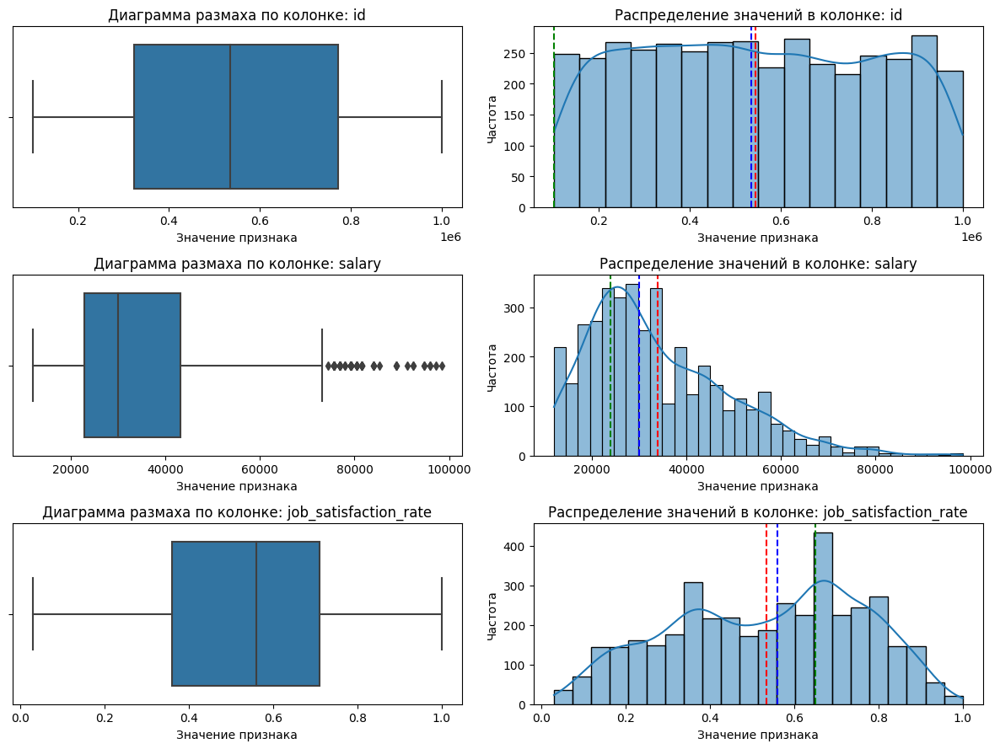

In [39]:
plot_box_hist_chart(train_job_satisfaction_rate[['id', 'salary', 'job_satisfaction_rate']])

Каких-то существенных выбросов и аномалий в данных не видно.

Небольшие выбросы в правой части есть в колонке с зарплатой, но понятно, что это более высокооплачиваемые сотрудники, их всегда мало. Также небольшой выброс есть слева в колонке с оценкой руководителя (оценка = 1). Такие плохие оценки достаточно редкие, но они есть и их наличие в данных понятно. 

В целом все данные распределены нормально, с небольшой ассиметрией. Каких-то явных аномалий нету.

Заметим, что лучше всего типичного сотрудника компании описывает показатель "моды", т.к. на всех графиках мода находится под колоколом распределения, а значит она соответствует мат. ожиданию анализируемого признака. 

**test_features**

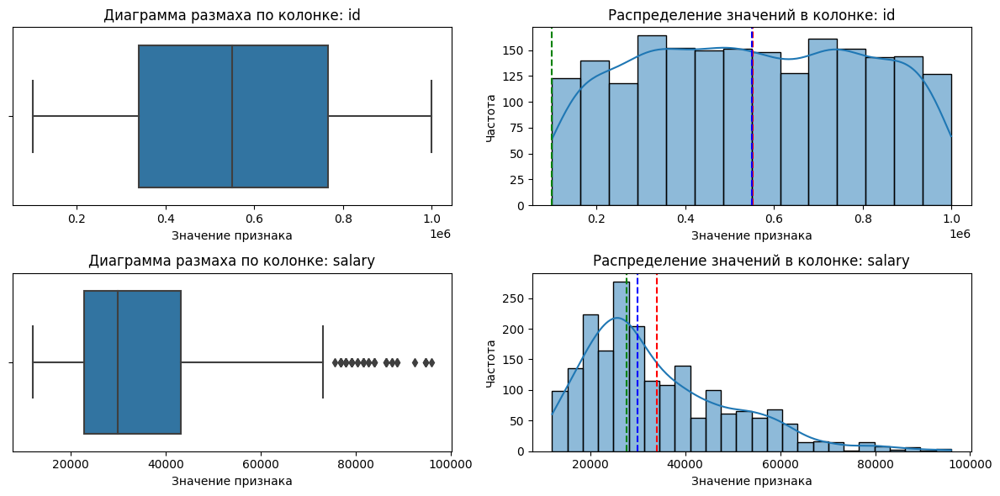

In [40]:
plot_box_hist_chart(test_features.drop(['employment_years', 'supervisor_evaluation'], axis=1))

**test_target_job_satisfaction_rate**

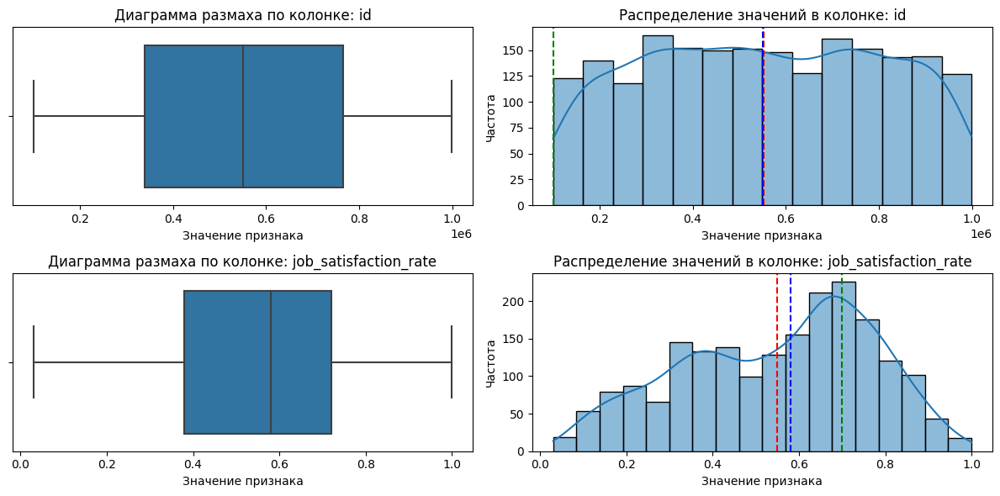

In [41]:
plot_box_hist_chart(test_target_job_satisfaction_rate)

Распределения и выбросы данных в тестовых файлах практически полностью повторяют картину на тренировочных данных. Значит модель машинного обучения должна адекватно работать с тестовой выборкой.

##### Качественные признаки

**train_job_satisfaction_rate**

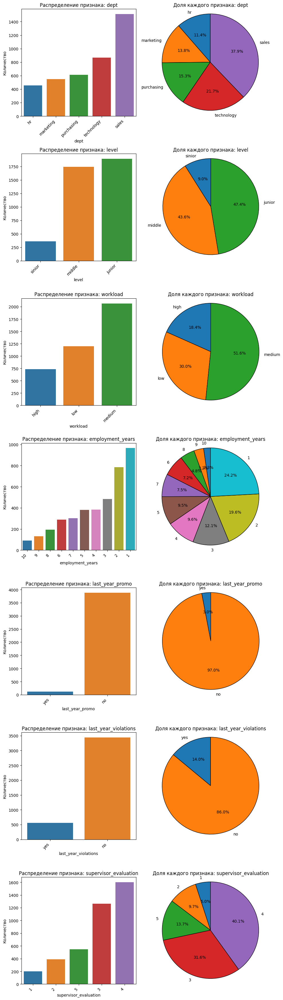

In [42]:
plot_bar_pie_chart(
    train_job_satisfaction_rate,
    train_job_satisfaction_rate.drop(['id', 'salary', 'job_satisfaction_rate'], axis=1).columns)

- Больше всего (38%) сотрудников компании работают в отделе `sales`, меньше всего в `hr` (11%)
- Больше половины (51%)сотрудников имеет среднюю загрузку, 30% недозагружены, а оставшиеся работники перегружены.
- Сотрудники компании практически поровну делятся между `junior` (48%) и `middle` (44%). Сотрудников грейда `sinior` значительно меньше.
- Всего 3% сотрудников в прошлом году получили промоушен, а 14% допускали нарушения контракта.
- почти половина сотрудников (44%) работает в компании первый или второй год.
- Около 30% сотрудников получают оценку 3. Около 15% сотрудников получают неудовлетворительные оценки, а остальные 45% сотрудников оценку выше среднего. 

**test_features**

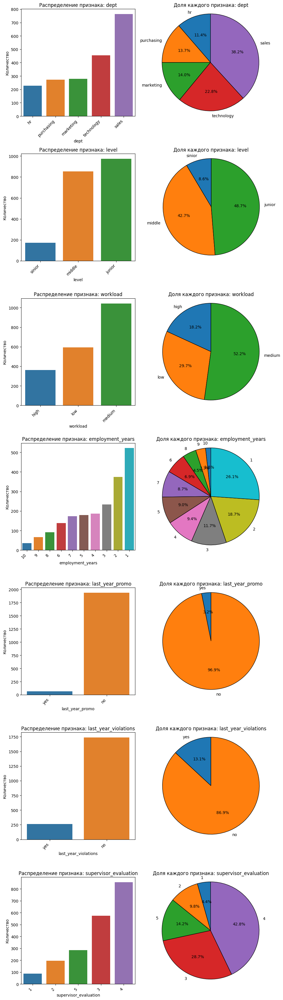

In [43]:
plot_bar_pie_chart(test_features, test_features.drop(['id', 'salary'], axis=1).columns)

Данные тестовой выборки практически полностью повторяют картину из тренировочного набора.

#### Взаимосвязь входящих признаков с целевым

Посмотрим как связаны входящие признаки с целевым, обратим внимание на имеющиеся в данных взаимосвязи.

In [44]:
train_job_satisfaction_rate.dtypes

id                         int64
dept                      object
level                     object
workload                  object
employment_years           int64
last_year_promo           object
last_year_violations      object
supervisor_evaluation      int64
salary                     int64
job_satisfaction_rate    float64
dtype: object

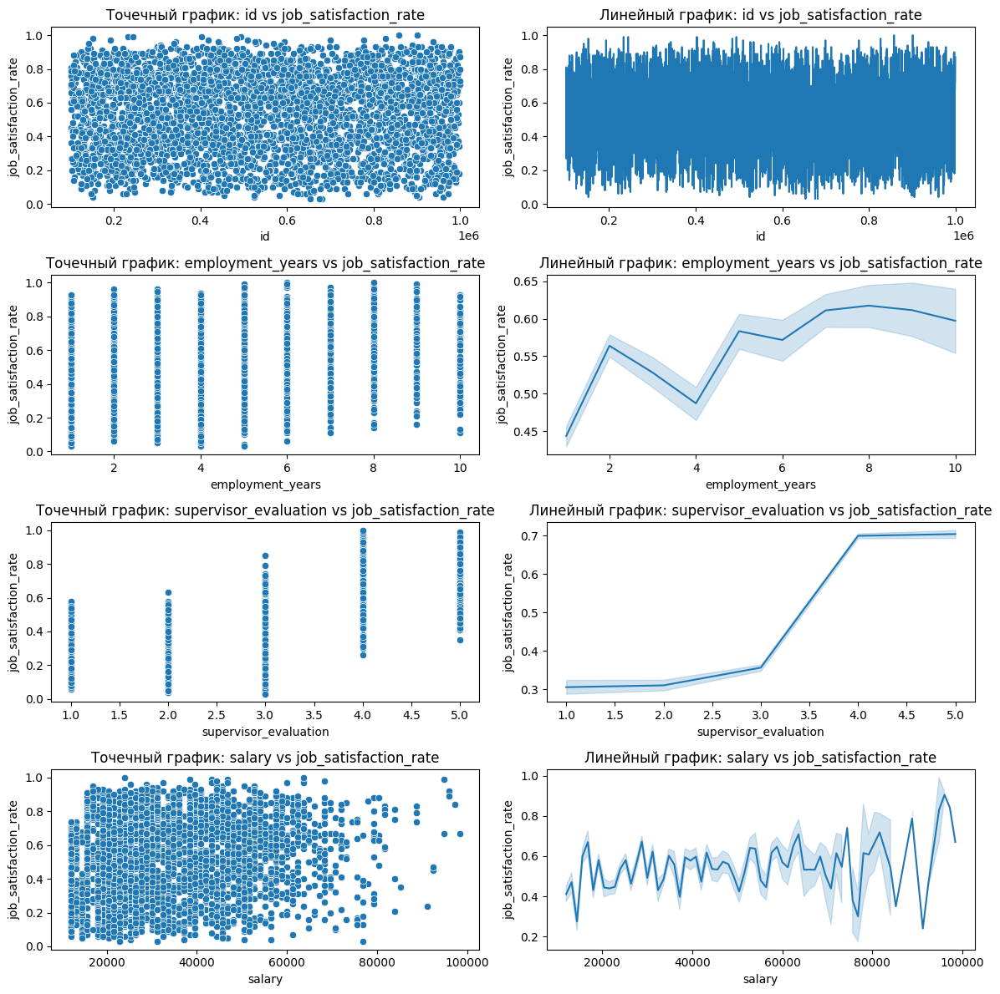

In [45]:
# Построим графики scatterplot и Lineplot (с медианой и 95% доверительным интервалом) для числовых колонок.
plot_scatter_line_chart(train_job_satisfaction_rate, y_label='job_satisfaction_rate')

**Влияние времени работы в компании**
- На начальных этапах (первый-второй год) наблюдается стремительный рост уровня удовлетворенности сотрудников. Это может быть обусловлено новизной работы, позитивными ожиданиями и адаптацией к коллективу.
- После достижения локального пика на втором году, на четвертый год работы, удовлетворенность сотрудников резко падает. Это может быть связано с:
  - Несоответствием карьерных ожиданий сотрудников с реальностью.
  - Отсутствием роста зарплат и продвижений по службе.
  - Перегорание в связи с высокой загрузкой на начальных этапах.
- После прохождения кризисного четвертого года удовлетворенность работой восстанавливается и становится более менее стабильной. Тем не менее на 9-10 году, она вновь приобретает тенденцию к снижению. Вероятно, опытные сотрудники со временем теряют интерес и реже сталкиваются с новизной в работе, кроме того им уже хорошо известны все преимущества и недостатки работодателя.    
 
**Влияние оценки руководителя**
- Оценка работы сотрудника руководителем значительно влияет на его удовлетворенность.
- Негативные оценки (1-2-3) почти не снижают уровень удовлетворенности, однако не способствуют его росту.
- Положительные оценки (4-5) могут практически удвоить уровень удовлетворенности по сравнению с низкими оценками. Поощрение заслуг со стороны руководства, веротяно, повышают мотивацию сотрудников и позитивно сказываются на их отношении к работе.

**Влияние зарплаты**
- Размер зарплаты практически не влияет на удовлетворенность сотрудников.

Теперь посмотрим на связи между целевым и категориальными признаками.

In [46]:
# Определяем колонки для перебора
grouping_columns = [
    'dept', 
    'level', 
    'workload', 
    'employment_years',
    'last_year_promo', 
    'last_year_violations', 
    'supervisor_evaluation'
]

In [47]:
# Функция для построения графиков box между входящими признаками и таргетом
def plot_box_features_target(data, features, target):
    """
    Построение ящиков с усами для заданных признаков и целевой переменной.

    :param data: DataFrame с данными
    :param features: Список столбцов-признаков для группировки
    :param target: Целевой столбец
    """
    n_cols = 2
    n_rows = (len(features) + n_cols - 1) // n_cols  # Вычисляем количество рядов

    plt.figure(figsize=(15, 5 * n_rows))  # Устанавливаем общий размер графиков

    for i, column in enumerate(features):
        plt.subplot(n_rows, n_cols, i + 1)  # Создаем подграфик
        sns.boxplot(data=data, x=column, y=target)
        plt.title(f'Ящик с усами: Уровень {target} по {column}')
        plt.xlabel(column)  # Подпись оси X
        plt.ylabel(target)  # Подпись оси Y
        plt.xticks(rotation=45)  # Поворачиваем подписи по оси X, если нужно

    plt.tight_layout()  # Настраиваем отступы
    plt.show()

**train_job_satisfaction_rate**

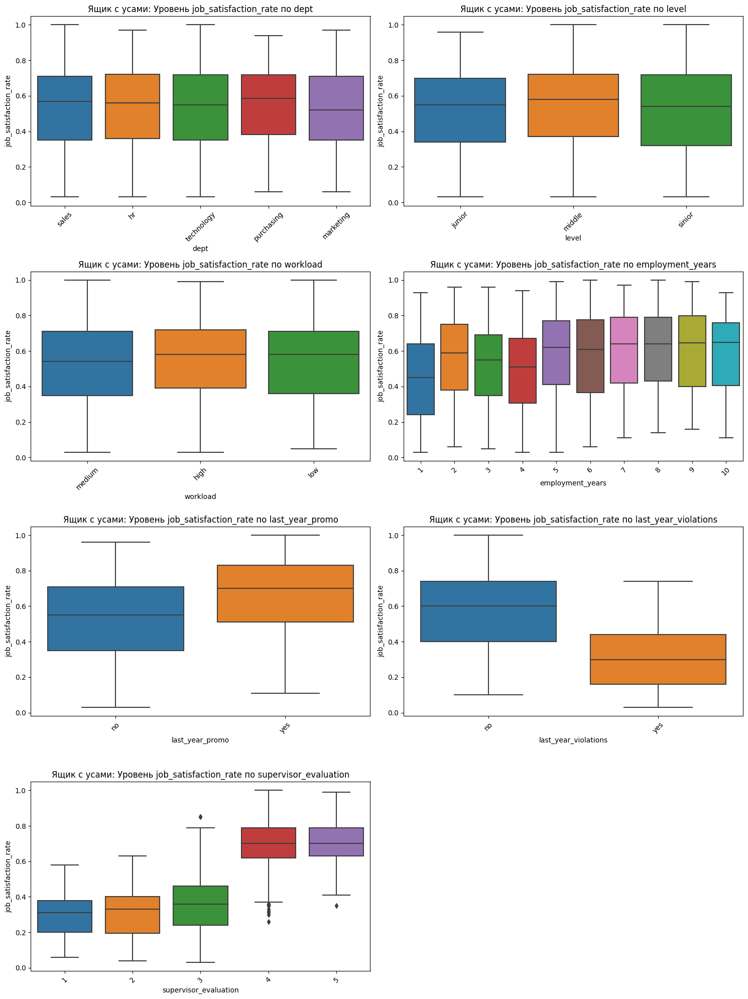

In [48]:
plot_box_features_target(train_job_satisfaction_rate, grouping_columns, "job_satisfaction_rate")

1. Уровень удовлетворенности работой среди сотрудников разных должностей, отделов и уровней загрузки примерно одинаковый. Выглядит так, что эти данные в общем не сильно влияют на отношение сотрудников к работе. Тем не менее небольшие различия в медианных значения удовлетворенности заметны:
 - Чуть ниже удовлетворенность работой в отделе `marketing`, чуть выше в `purchsing`.
 - У сотрудников `middle` удовлетворенность работой чуть выше чем у `junior` и `senior`.
 - Сотрудники со `medium` уровнем загрузки получают немного меньше удовольствия от работы, чем те кто работают много или мало. 
2. Сотрудники, которых в прошлом году повысили  более довольны своей работой.
3. Работники нарушающие трудовой договор намного чаще недовольны работой. Наверное, поэтому они хуже относятся к соблюдению трудовой дисциплины.

Про срок работы в годах и оценку супервизора уже было сказано чуть выше. Графики подтверждают прежние выводы. 

**test_features**

In [49]:
test_features.merge(test_target_job_satisfaction_rate, how='left').isna().sum()

id                       0
dept                     3
level                    1
workload                 1
employment_years         0
last_year_promo          0
last_year_violations     0
supervisor_evaluation    0
salary                   0
job_satisfaction_rate    0
dtype: int64

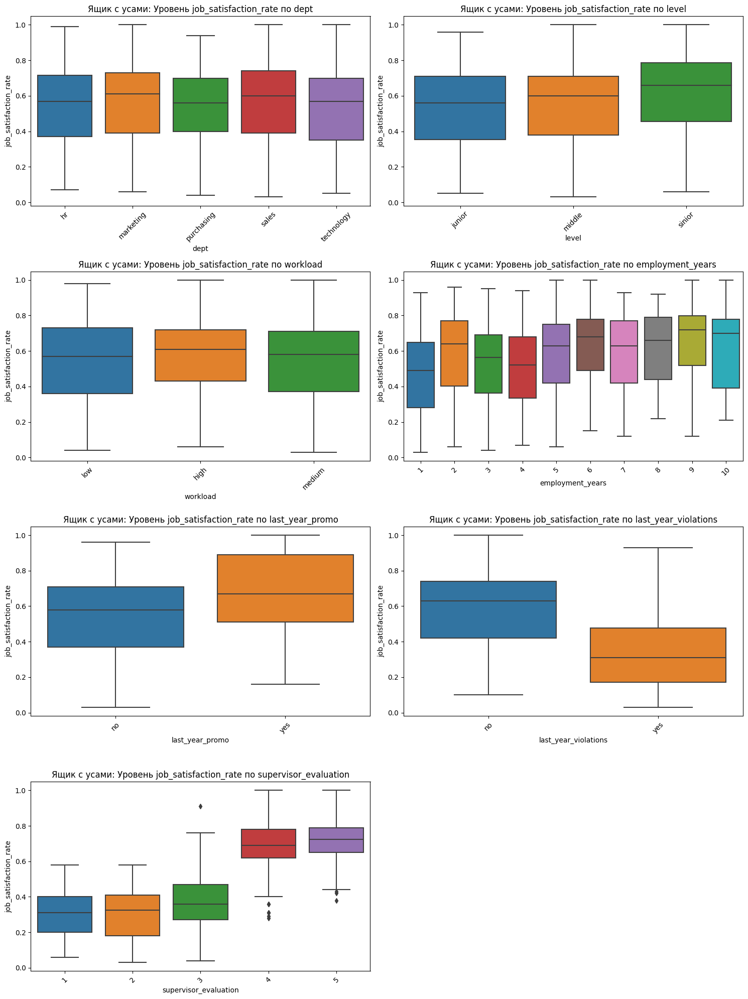

In [50]:
plot_box_features_target(
    test_features.merge(test_target_job_satisfaction_rate, how='left'),
    grouping_columns, "job_satisfaction_rate")

В тестовой выборке все взаимосвязи и выводы те же, что и в тренировочной. Заметных отличий нет.

Еще немного углубимся в анализ влияния входящих признаков на целевой и посмотрим одновременное влияние различных комбинаций двух признаков. Возможно, сможем заметить какие-то более сложные связи в данных.

In [51]:
def create_boxplots(train_data, test_data, x, hue):
    """Создает боксплоты для заданных категориальных переменных для обучающих и тестовых данных."""
    
    # Удаляем строки с пропусками
    train_data = train_data.dropna(subset=[x, "job_satisfaction_rate", hue])
    test_data = test_data.dropna(subset=[x, "job_satisfaction_rate", hue])
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))  # Увеличиваем ширину до 18

    # Получаем уникальные значения для оси X из обучающих данных
    order = train_data[x].unique()

    # График для обучающих данных
    sns.boxplot(data=train_data, x=x, y="job_satisfaction_rate", hue=hue, ax=axes[0], order=order)
    axes[0].set_title(f'Обучающие: {hue} по {x}', fontsize=16)
    axes[0].set_xlabel(x)
    axes[0].set_ylabel('Удовлетворенность')

    # График для тестовых данных
    sns.boxplot(data=test_data, x=x, y="job_satisfaction_rate", hue=hue, ax=axes[1], order=order)
    axes[1].set_title(f'Тестовые: {hue} по {x}', fontsize=16)
    axes[1].set_xlabel(x)
    axes[1].set_ylabel('Удовлетворенность')

    # Создание внешней легенды, ближе к графикам
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', title=hue)

    # Убираем внутренние легенды
    axes[0].get_legend().remove() if axes[0].get_legend() else None
    axes[1].get_legend().remove() if axes[1].get_legend() else None

    plt.tight_layout(rect=[0, 0, 0.9, 1])  # Увеличиваем пространство для легенды
    plt.show()

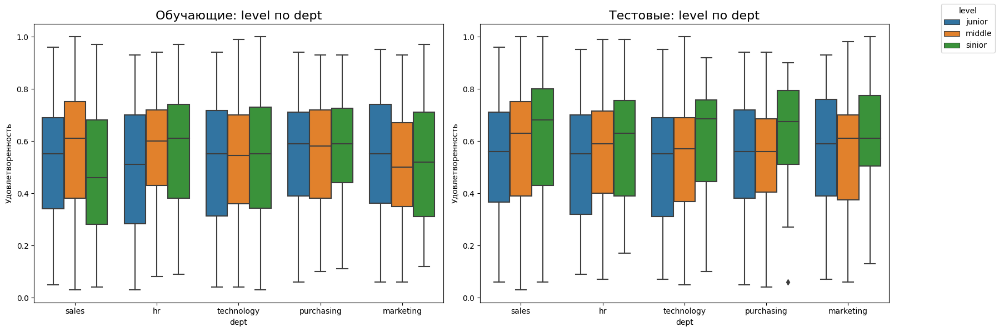

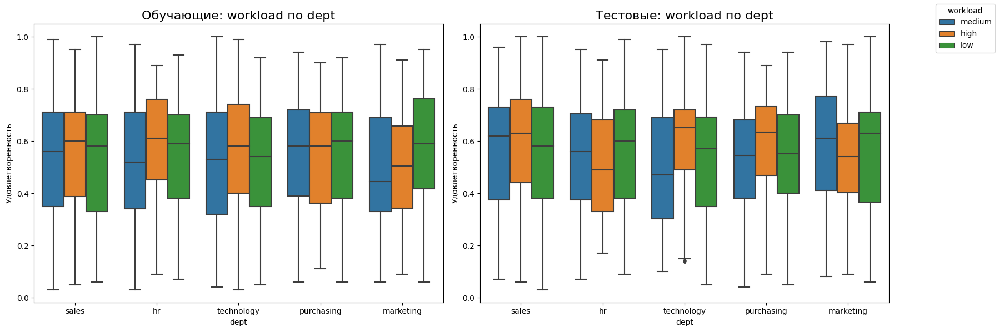

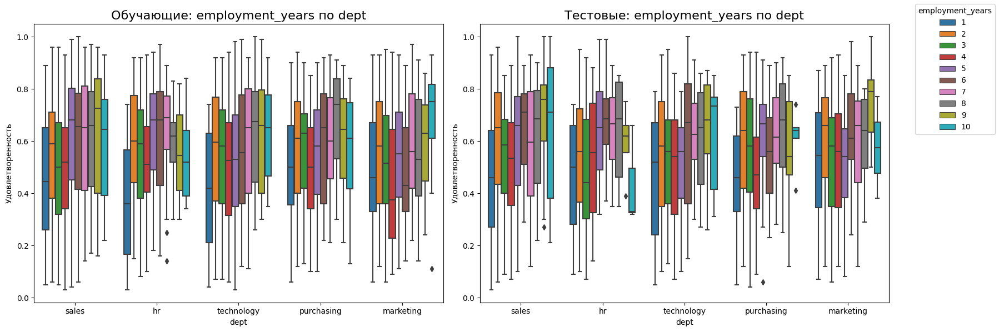

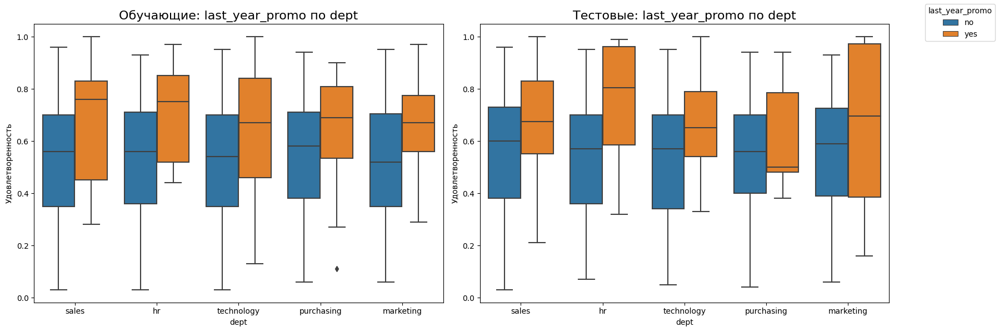

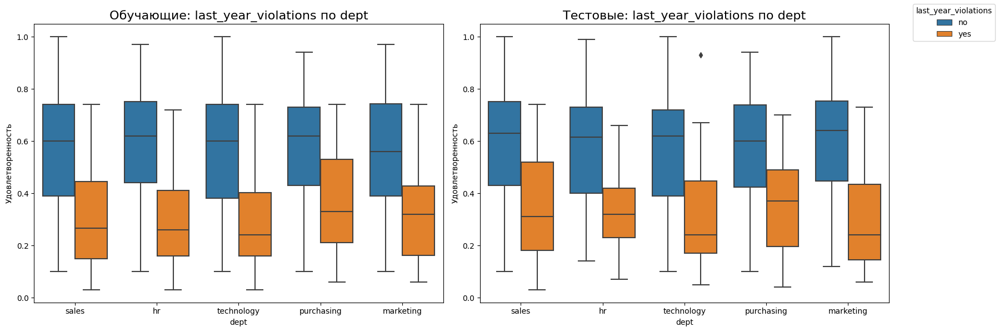

...

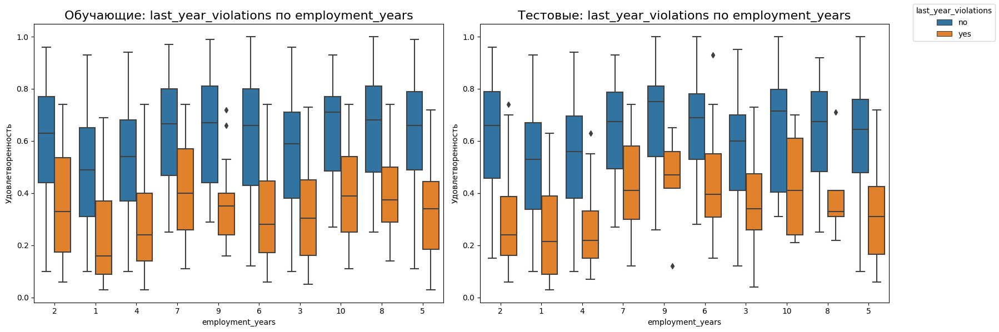

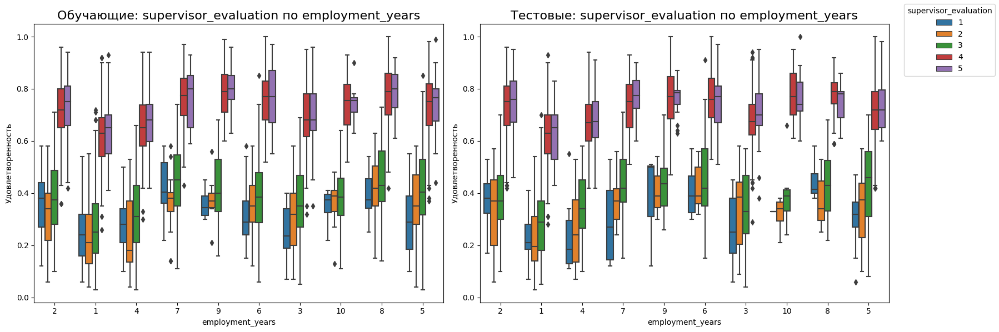

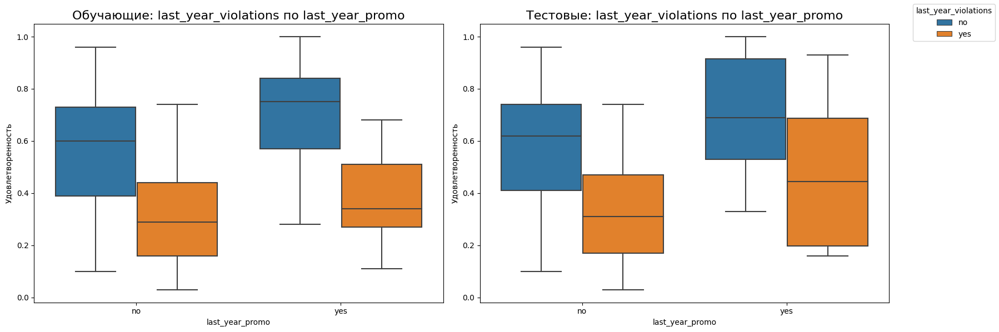

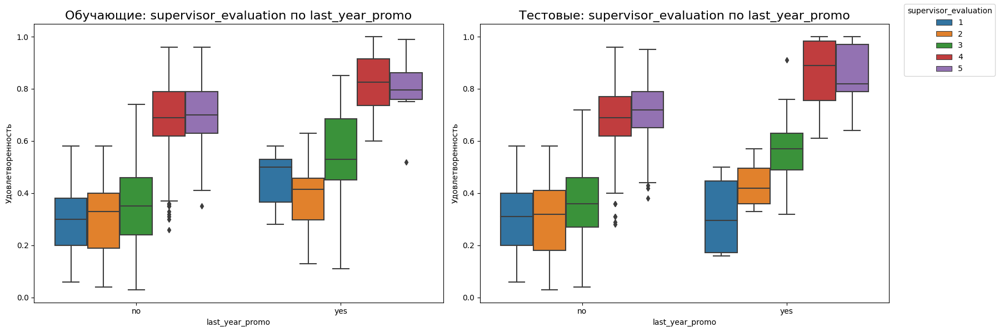

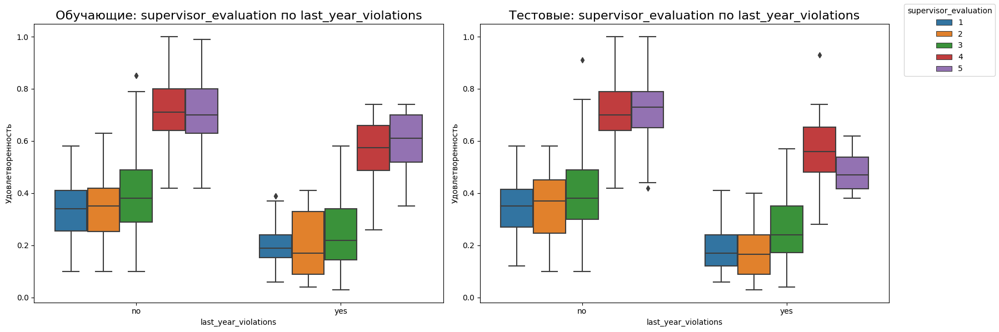

In [52]:
# Создаем графики для всех сочетаний колонок для группировки
for x, hue in combinations(grouping_columns, 2):
    create_boxplots(
        train_job_satisfaction_rate,
        test_features.merge(test_target_job_satisfaction_rate, how='left'),
        x,
        hue)

- В отделе `sales` меньше всего довольны работой `senior`, а в отделе `hr` - `junior`.
- Самый низкий уровень удовлетворенности наблюдается в отделах `hr` и `technology` на первом году работы.
- `junior` работаю в компании не более 5 лет.
- В прошлом году промоушены получили только `middle` и `senior`. При этом все `junior` остались без промоушена.

Существенной разницы в распределении признаков в тренировочной и тестовой выборках не заметно.

Еще посмотрим как распределены зарплаты в зависимости от департамента и должности.

In [53]:
train_level_dept_salaries = train_job_satisfaction_rate.pivot_table(values='salary', index='dept', columns='level', aggfunc='mean')
test_level_dept_salaries = test_features.merge(test_target_job_satisfaction_rate, how='left').pivot_table(values='salary', index='dept', columns='level', aggfunc='mean')

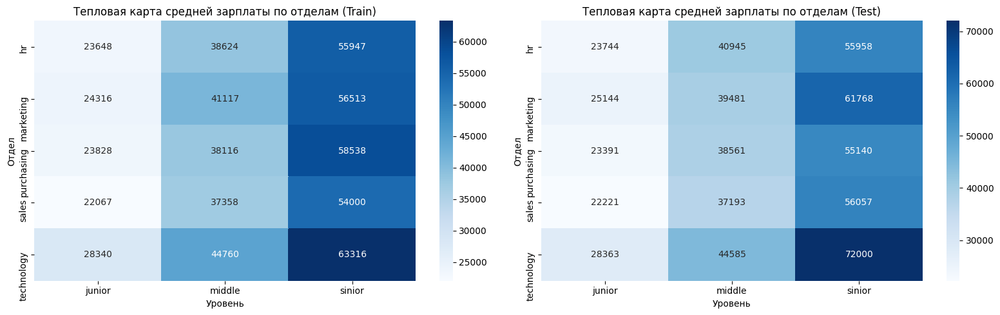

In [54]:
# Создание фигуры с двумя подграфиками
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Тепловая карта для train_level_dept_salaries
sns.heatmap(train_level_dept_salaries, annot=True, cmap='Blues', cbar=True, fmt=".0f", ax=axes[0])
axes[0].set_title('Тепловая карта средней зарплаты по отделам (Train)')
axes[0].set_xlabel('Уровень')
axes[0].set_ylabel('Отдел')

# Тепловая карта для test_level_dept_salaries
sns.heatmap(test_level_dept_salaries, annot=True, cmap='Blues', cbar=True, fmt=".0f", ax=axes[1])
axes[1].set_title('Тепловая карта средней зарплаты по отделам (Test)')
axes[1].set_xlabel('Уровень')
axes[1].set_ylabel('Отдел')

# Отображение графиков
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

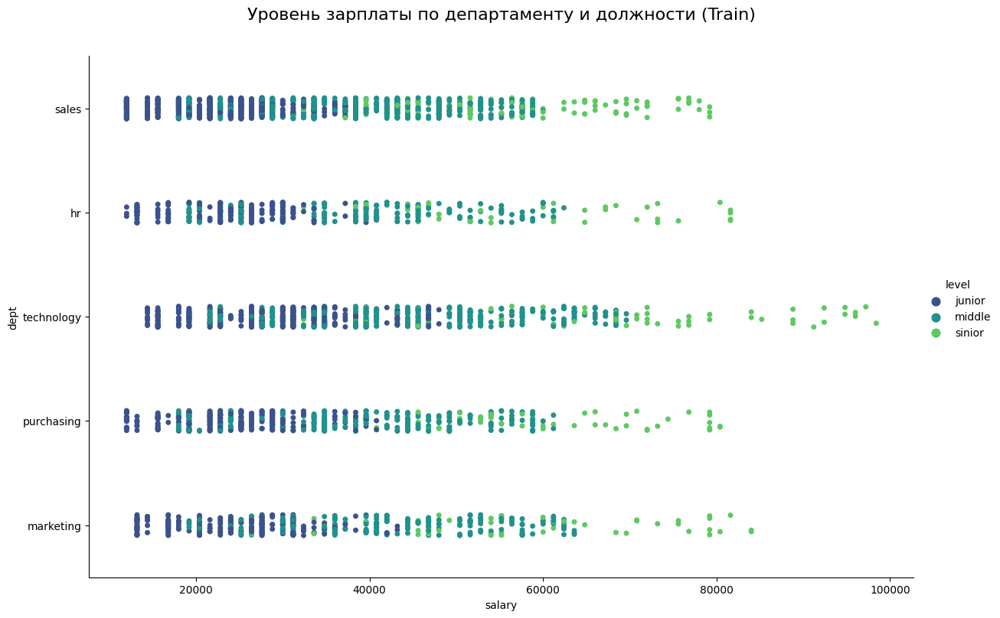

<Figure size 1200x800 with 0 Axes>

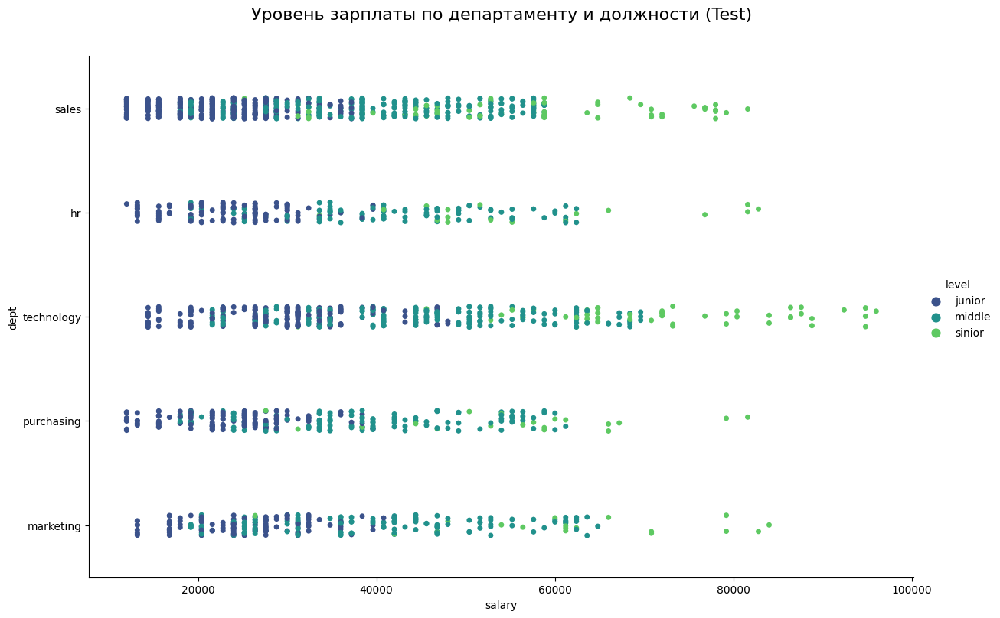

In [55]:
def plot_job_satisfaction(train_data, test_data):
    # Удаление строк с NaN из данных
    train_data_clean = train_data.dropna(subset=['salary', 'dept', 'level'])
    test_data_clean = test_data.dropna(subset=['salary', 'dept', 'level'])
    
    # Получаем уникальные категории для оси Y
    dept_order = train_data_clean['dept'].unique()

    # Увеличение размера графика для первого графика
    plt.figure(figsize=(12, 8))

    # Создание catplot для train_job_satisfaction_rate
    sns.catplot(data=train_data_clean, 
                x='salary', 
                y='dept', 
                hue='level', 
                kind='strip', 
                palette='viridis', 
                height=8, 
                aspect=1.5, 
                jitter=True,
                order=dept_order)

    # Добавление заголовка
    plt.subplots_adjust(top=0.9)
    plt.suptitle('Уровень зарплаты по департаменту и должности (Train)', fontsize=16)

    # Показ графика
    plt.show()

    # Увеличение размера графика для второго графика
    plt.figure(figsize=(12, 8))

    # Создание catplot для test_level_dept_salaries
    sns.catplot(data=test_data_clean, 
                x='salary', 
                y='dept', 
                hue='level', 
                kind='strip', 
                palette='viridis', 
                height=8, 
                aspect=1.5, 
                jitter=True,
                order=dept_order)

    # Добавление заголовка
    plt.subplots_adjust(top=0.9)
    plt.suptitle('Уровень зарплаты по департаменту и должности (Test)', fontsize=16)

    # Показ графика
    plt.show()

# Пример вызова функции
plot_job_satisfaction(train_job_satisfaction_rate, test_features.merge(test_target_job_satisfaction_rate, how='left'))

- На уровне junior зарплаты везде относительно низкие, в отделей Sales наименьшие.
- На уровне senior зарплаты значительно выше, особенно в Technology, что говорит о высокой ценности специалистов в этой области.
- В каждом отделе наблюдается рост зарплат с увеличением уровня должности.
- Technology является наиболее высокооплачиваемым отделом, тогда как Sales занимает последнее место.

Принципиальные различия между тренировочной и тестовой выборкой отсутствуют.

#### Выводы

**1. Распределение данных и выбросы**

**Общие наблюдения**
Никаких существенных аномалий в данных не выявлено. Тренировочная и тестовая выборки схожи.

**Количественные признаки**
- В колонке зарплаты наблюдаются небольшие выбросы, характерные для высокооплачиваемых сотрудников.
- Очень плохие оценки руководителя также на графиках также выглядят как выбросы, это значит что такие оценки достаточно редкие.
- В целом данные распределены нормально с небольшой ассиметрией в ту или иную сторону. Лучше всего мат. ожидание описывается показателем "моды",

**Качественные признаки**
- Наибольшее количество сотрудников работает в отделе продаж (38%), наименьшее — в HR (11%).
- 51% сотрудников имеет среднюю загрузку, 30% недозагружены.
- Соотношение junior и middle сотрудников близкое, с меньшим количеством senior (3%).

**2. Взаимосвязь входящих признаков с целевым**

**Время работы в компании**
- Уровень удовлетворенности растет в первые два года, затем резко падает на четвертом.
- После кризиса четвертого года удовлетворенность стабилизируется, но с тенденцией к снижению на 9-10 году.

**Оценка руководителя**
- Негативные оценки не снижают удовлетворенность, но и не способствуют ее росту.
- Положительные оценки значительно увеличивают уровень удовлетворенности.

**Зарплата**
- Размер зарплаты практически не влияет на удовлетворенность сотрудников.

**3. Связи между целевым и категориальными признаками**

- Уровень удовлетворенности среди разных должностей и отделов примерно одинаковый:
  - Небольшие различия: ниже в маркетинге, выше в закупках.
  - Сотрудники, получившие повышение, в среднем более удовлетворены своей работой.
  - Нарушители трудового договора чаще недовольны.

**4. Общие наблюдения**

- В отделах sales и hr наименьшая удовлетворенность среди senior и junior соответственно.
- Junior, работают в компании не более 5 лет.
- В прошлом году промоушены получили только middle и senior. При этом все junior остались без промоушена.
- В каждом отделе наблюдается рост зарплат с увеличением уровня должности, с Technology как наиболее высокооплачиваемым.
- Существенных различий между тренировочной и тестовой выборками не обнаружено.

### Корреляционный анализ

In [56]:
interval_columns = ['salary', 'job_satisfaction_rate']

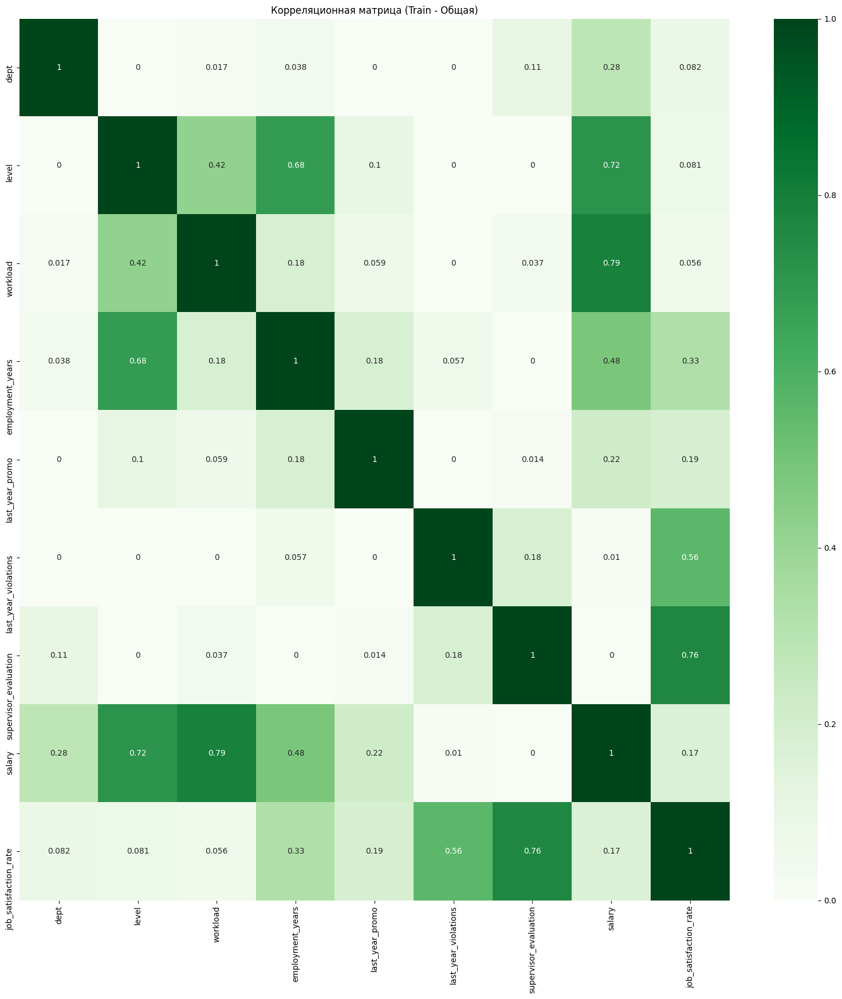

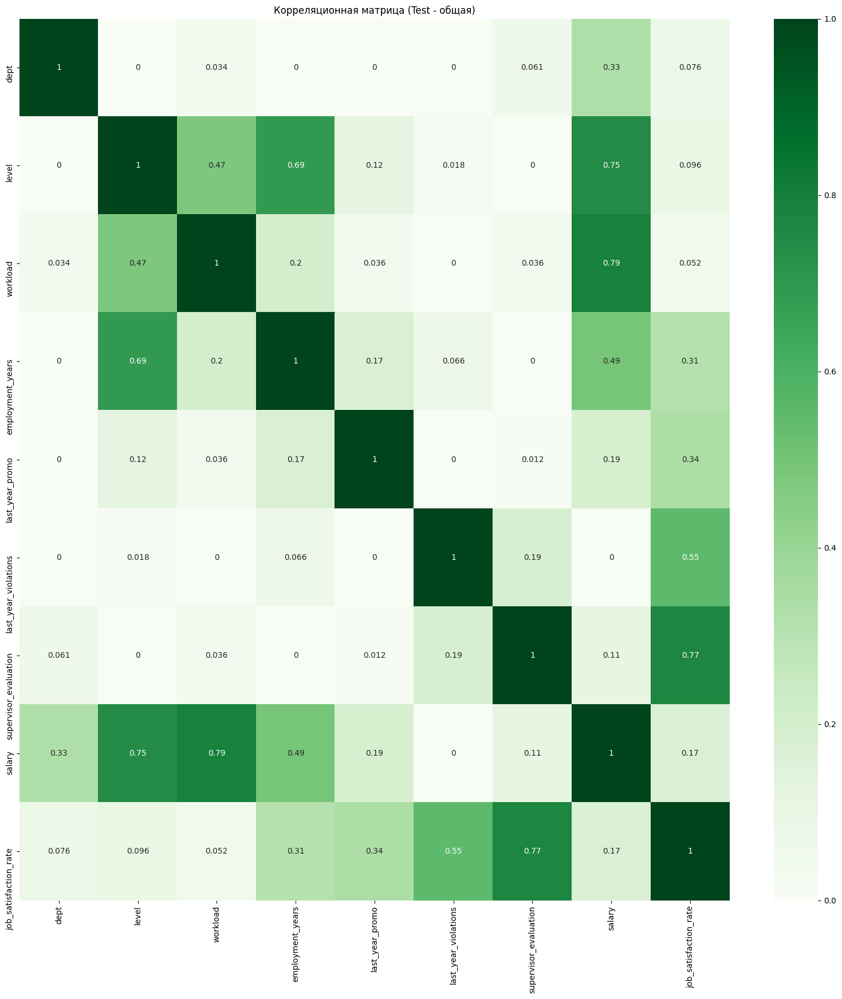

In [57]:
# построим корреляционную матрицу по обучающей выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(train_job_satisfaction_rate.drop('id', axis=1)
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Общая)")
plt.show()

# построим корреляционную матрицу по тестовой выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(test_features.merge(test_target_job_satisfaction_rate, how='left').drop('id', axis=1)
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Test - общая)")
plt.show()

Целевой признак коррелирует с входящими следующим образом:
    
**1. Сильная корреляция:**
- `supervisor_evaluation` (0.76-0.77): Этот фактор имеет определяющее значения для определения целевой переменной.

**2. Умеренная корреляция:**

- `last_year_violations` (0.55-0.56): Это может указывать на то, что наличие нарушений в прошлом году связано с более низким уровнем удовлетворенности.
- `employment_years` (0.31-0.33): С увеличением стажа работы наблюдается рост удовлетворенности, что может свидетельствовать о том, что опыт работы важен для восприятия удовлетворенности.

**3. Слабая корреляция:**
- `last_year_prom` (0.19-0.34!!!): В тренировочной выборке влияние на целевой признак низкое, а в тестовой уже умеренное. Разница небольшая, но это потенциально может снизить предсказательную силу модели на тестовой выборке. 
- `salary` (0.17): Хотя зарплата и имеет положительное влияние, оно не столь значительное, как у других факторов.

**4. Отсуствие кореляции:**
- `workload` (0.052-0.056), `dept` (0.076-0.082), `level` (0.081-0.096): Эти факторы имеют очень слабую корреляцию с уровнем удовлетворенности, что указывает на то, что они, вероятно, не оказывают значительного влияния на целевую переменную.

Проверим наличие мультиколлинеарности среди входящих признаков:
- Наблюдается достаточно сильная взаимосвязь `salary` c `level` (0.72-0.75) и `workload`(0.79). Зарплата в основном определяется должностью и загрузкой работника.
- `level` также коррелирует с количеством отработанных лет в компании (0.68-0.69).

В целом, связь между этими факторами существенная, однако недостаточная, чтобы говорить о мультиколлинеарности указанных входящих признаков.

Также построим корреляционные матрицы отдельно для сотрудников удовлетворенных своей работой и нет.

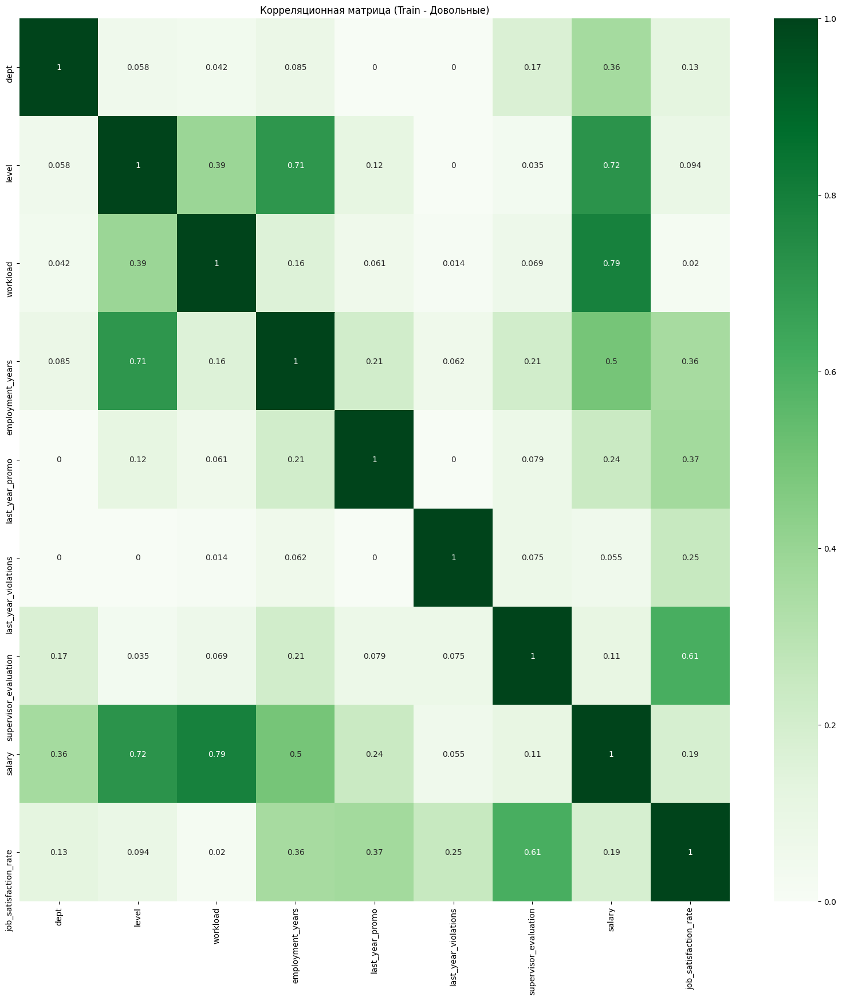

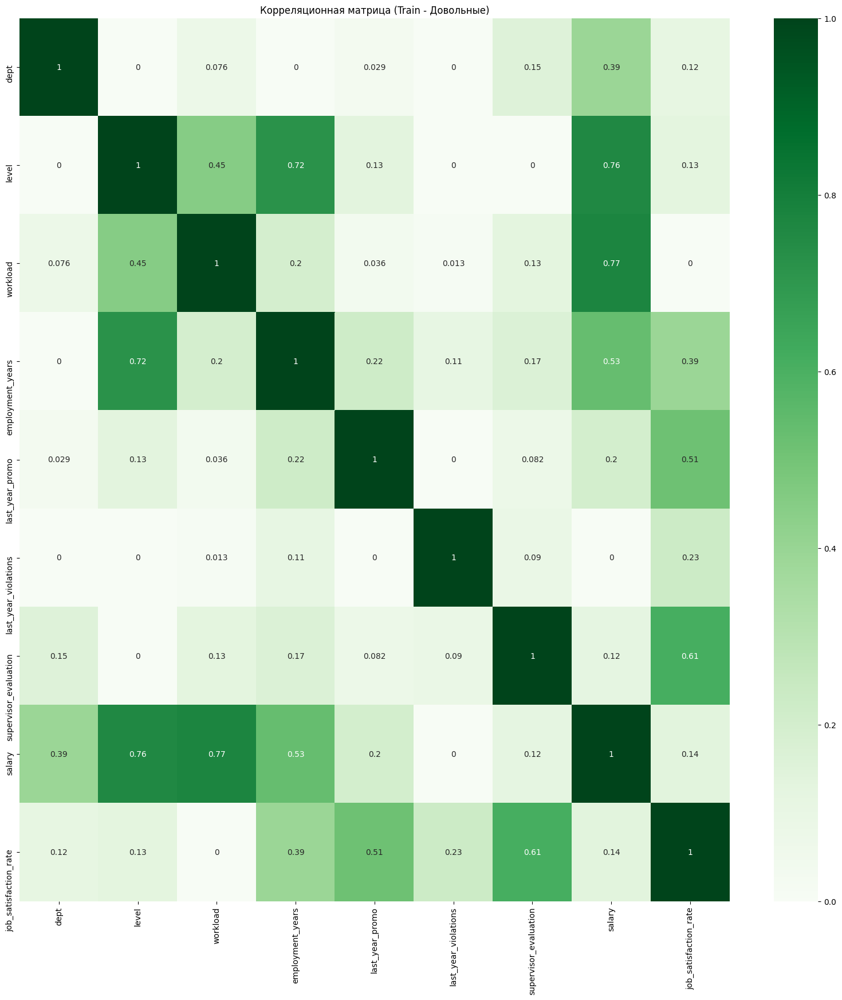

In [58]:
# построим корреляционную матрицу по тренировочной таблице
plt.figure(figsize=(20, 20)) 
sns.heatmap(train_job_satisfaction_rate.drop('id', axis=1).query('job_satisfaction_rate >= 0.5')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Довольные)")
plt.show()


# построим корреляционную матрицу по тестовой таблице
plt.figure(figsize=(20, 20)) 
sns.heatmap(test_features.merge(test_target_job_satisfaction_rate, how='left').drop('id', axis=1).query('job_satisfaction_rate >= 0.5')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Довольные)")
plt.show()

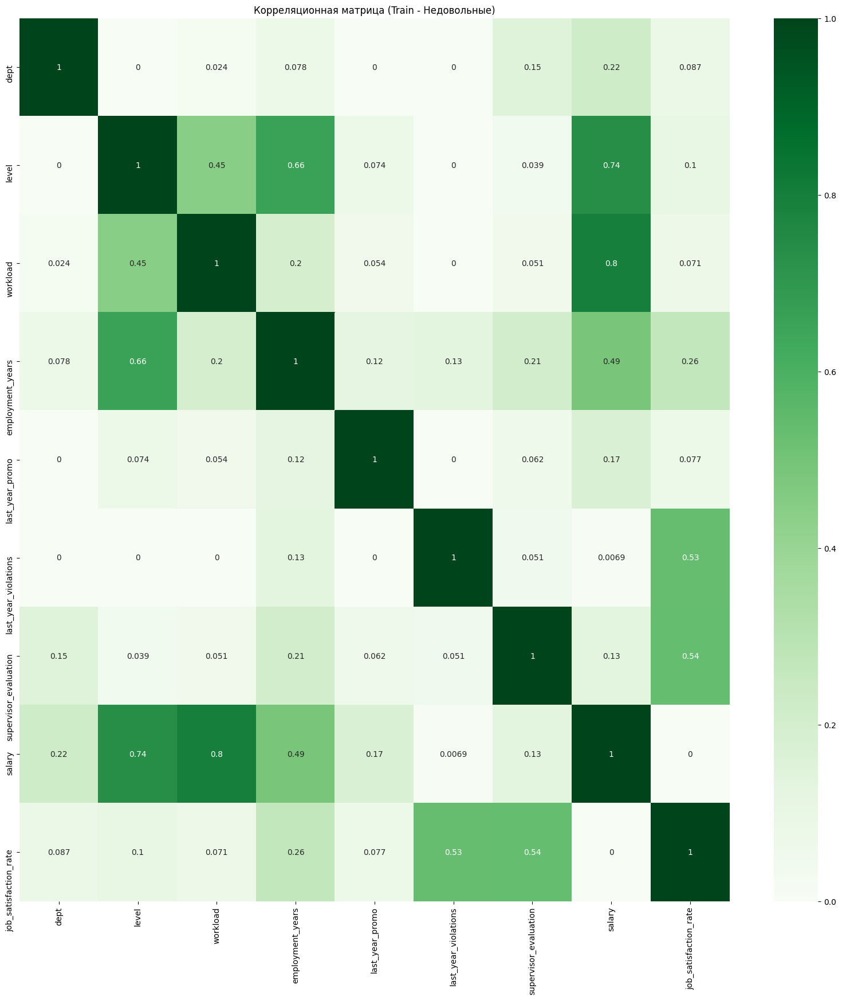

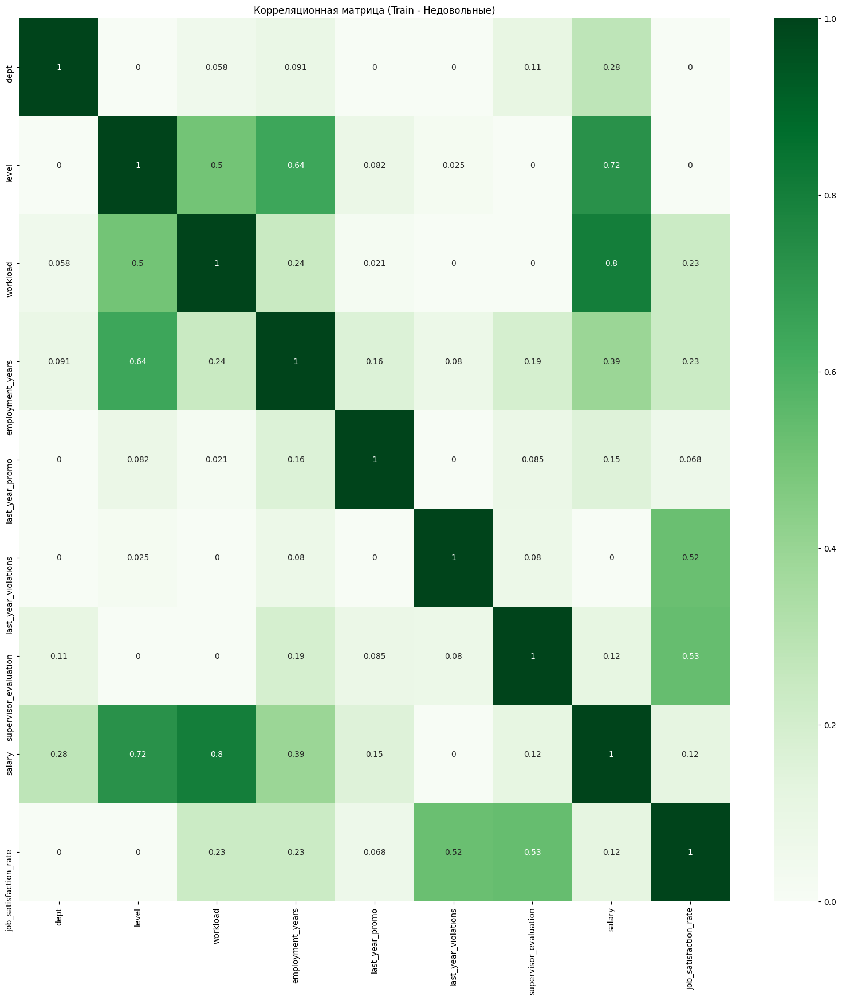

In [59]:
# построим корреляционную матрицу по тренировочной таблице
plt.figure(figsize=(20, 20)) 
sns.heatmap(train_job_satisfaction_rate.drop('id', axis=1).query('job_satisfaction_rate < 0.5')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Недовольные)")
plt.show()


# построим корреляционную матрицу по тестовой таблице
plt.figure(figsize=(20, 20)) 
sns.heatmap(test_features.merge(test_target_job_satisfaction_rate, how='left').drop('id', axis=1).query('job_satisfaction_rate < 0.5')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Недовольные)")
plt.show()

Заметно, насколько сильней `job_satisfaction_rate` коррелирует с `last_year_violation` у сотрудинков с низким уровнем удовлетворенности работой, что еще раз подтверждает наблюдения, сделанные в ходе исследовательского анализа.

### Обучение моделей

#### Описание признаков и выбор метрики

**Целевая переменная:** `job_satisfaction_rate`

**Категориальные признаки (неранговые):**
- `dept`: ['hr', 'marketing', 'purchasing', 'sales', 'technology']
- `last_year_promo`: ['no', 'yes']
- `last_year_violations`: ['no', 'yes']

**Категориальные признаки (ранговые):**
- `level`: ['junior', 'middle', 'sinior']
- `workload`: ['low', 'medium', 'high']

**Количественные признаки:**
- `employment_years`,
- `supervisor_evaluation`,
- `salary`

Колонку `id` не влияет на анализ, предварительно сделаем ее индексом. 

In [60]:
train_job_satisfaction_rate = train_job_satisfaction_rate.sort_values(by='id').set_index('id')

In [61]:
# Перед подготовкой тестовых признаков для работы модели, запишем обработанную копию файла для задачи 2
# в задаче 1 этот файл использоваться не будет
test_features_quit = test_features.copy()

In [62]:
test_features = test_features.sort_values(by='id').set_index('id')

In [63]:
test_target_job_satisfaction_rate = test_target_job_satisfaction_rate.sort_values(by='id').set_index('id')

In [64]:
for df in [train_job_satisfaction_rate, test_features, test_target_job_satisfaction_rate]:
    display(df.head(5))

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
id,,,,,,,,,
100954,purchasing,junior,low,1,no,no,4,15600,0.60
101057,sales,junior,low,1,no,yes,4,19200,0.45
101074,sales,junior,medium,2,no,no,2,20400,0.36
101081,sales,middle,low,2,no,no,4,28800,0.66
101129,technology,junior,medium,1,no,no,4,34800,0.71


,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
id,,,,,,,,
100298,hr,junior,low,2,no,no,4,19200
100480,marketing,junior,low,4,no,no,4,16800
100503,purchasing,middle,high,5,no,no,4,55200
100610,sales,middle,medium,5,no,no,4,43200
100692,sales,middle,high,6,no,no,4,48000


,job_satisfaction_rate
id,
100298,0.80
100480,0.84
100503,0.79
100610,0.75
100692,0.69


**Выбор метрики**

По условиям задачи для выбора лучшей модели должна использоваться метрика — SMAPE (англ. symmetric mean absolute percentage error, «симметричное среднее абсолютное процентное отклонение»). 


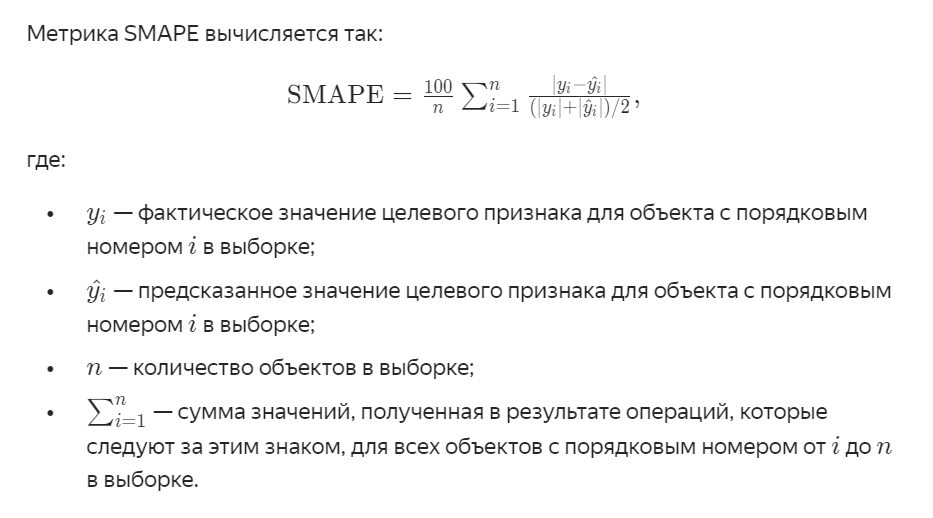


**Критерий успеха:**

SMAPE ≤ 15 на тестовой выборке.

In [65]:
# Напишем функцию для расчета метрики SMAPE
def smape(y_true, y_pred):
    """
    Вычисляет SMAPE (Symmetric Mean Absolute Percentage Error).
    
    :param y_true: Массив фактических значений (NumPy array или pandas Series)
    :param y_pred: Массив предсказанных значений (NumPy array или pandas Series)
    :return: Значение SMAPE
    """
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    diff = np.abs(y_true - y_pred) / denominator
    
    # Избегаем деления на ноль
    diff[denominator == 0] = 0.0
    
    return 100 * np.mean(diff)

In [66]:
# на основе функции сделаем scorer
smape_scorer = make_scorer(smape, greater_is_better=False)

#### Подготовка данных

Удалим дубликаты из тренировочной выборки, чтобы исключить ситуацию, когда на кросс-валидации дубликат попадёт и в обучающий, и в оценивающий фолд. Это может привести к завышению значений анализируемой метрики на кросс-валидации.

In [67]:
# дубликаты в тренировочной выборки
print('Дубликаты:', train_job_satisfaction_rate.duplicated().sum())
print('Shape:', train_job_satisfaction_rate.shape)

Дубликаты: 245
Shape: (4000, 9)


In [68]:
# удалим дубликаты
train_job_satisfaction_rate = train_job_satisfaction_rate.drop_duplicates()

In [69]:
# проверка
print('Дубликаты:', train_job_satisfaction_rate.duplicated().sum())
print('Shape:', train_job_satisfaction_rate.shape)

Дубликаты: 0
Shape: (3755, 9)


In [70]:
# Разделим тренировочный набор на X_train и y_train
X_train = train_job_satisfaction_rate.drop('job_satisfaction_rate', axis=1)
y_train = train_job_satisfaction_rate['job_satisfaction_rate']

# Для удобства сохраним тестовые данные в новые переменные
X_test = test_features.copy()
# заодно преобразуем y_test в pd.Series по аналогии с y_train
y_test = pd.Series(
    test_target_job_satisfaction_rate['job_satisfaction_rate'].values,
    index=test_target_job_satisfaction_rate.index) 

In [71]:
for df in [X_train, y_train, X_test, y_test]:
    display(df.head(2))

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
id,,,,,,,,
100954,purchasing,junior,low,1,no,no,4,15600
101057,sales,junior,low,1,no,yes,4,19200


id
100954    0.60
101057    0.45
Name: job_satisfaction_rate, dtype: float64

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
id,,,,,,,,
100298,hr,junior,low,2,no,no,4,19200
100480,marketing,junior,low,4,no,no,4,16800


id
100298    0.80
100480    0.84
dtype: float64

#### Создание пайплайна

In [72]:
# Создадим списки с названиями признаков
target_job_satisfaction =['job_satisfaction_rate']

ohe_columns = [
    'dept',
    'last_year_promo',
    'last_year_violations'
]

ord_columns = [
    'level',
    'workload'
]

num_columns_job_satisfaction = [
    'employment_years',
    'supervisor_evaluation',
    'salary'
]

In [73]:
# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
    ]
)

In [74]:
# создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(
                categories=[
                    ['junior', 'middle', 'sinior'], # порядок кодирования для level
                    ['low', 'medium', 'high'] #порядок кодирования для workload
                ], 
                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

In [75]:
# Пайплайн предобработки
data_preprocessor = ColumnTransformer(
    [   ('ohe', ohe_pipe, ohe_columns),
        ('ord', ord_pipe, ord_columns),
        ('num', StandardScaler(), num_columns_job_satisfaction)
    ], 
    remainder='passthrough'
)

In [76]:
# создадим итоговый пайплайн
pipe_final = ImbPipeline([
    ('preprocessor', data_preprocessor),
    ('selector', 'passthrough'),
    ('poly', 'passthrough'), 
    ('sampler', 'passthrough'), # будет использоваться только в Задаче 2 (классификация), для регрессии не используем
    ('models', LinearRegression())
])

#### Поиск лучшей модели

##### Базовые модели без перебора гиперпараметров

In [77]:
# списки для хранения данных об обученных моделях
pipeline_names = []
pipeline = []
train_smape_score = []

In [78]:
# чтобы регрессионные модели работали корректно, оставим перебор скейлеров
param_grid_base = [
    {
        'models': [DecisionTreeRegressor(random_state=RANDOM_STATE)],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [LinearRegression()],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    }
]

In [79]:
%%time

grid_search_base, results_base = find_best_model_grid(
    pipe_final,
    param_grid_base,
    X_train,
    y_train,
    scoring=smape_scorer
)
print()

Лучшая модель и её параметры
Лучшая метрика на кросс-валидации для лучшей модели: 16.32910039796467


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector', 'passthrough'), ('poly', 'passthrough'),
                ('sampler', 'passthrough'),
                ('models', DecisionTreeRegressor(random_state=42))])


CPU times: total: 297 ms
Wall time: 1.3 s


In [80]:
# запишем результаты в общую таблицу
all_relsults_satisfaction = results_base.copy().sort_values(by='mean_test_score', ascending=False)
all_relsults_satisfaction.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1,0.069015,0.025226,0.021942,0.006823,DecisionTreeRegressor(random_state=42),MinMaxScaler(),"{'models': DecisionTreeRegressor(random_state=42), 'preprocessor__num': MinMaxScaler()}",-15.586062,-15.246277,-16.657442,-17.111199,-17.044521,-16.329100,0.768886,1
2,0.055451,0.013915,0.032114,0.018209,DecisionTreeRegressor(random_state=42),passthrough,"{'models': DecisionTreeRegressor(random_state=42), 'preprocessor__num': 'passthrough'}",-15.602384,-15.343789,-16.733981,-17.095846,-17.144425,-16.384085,0.761632,2
0,0.058843,0.011372,0.018949,0.003155,DecisionTreeRegressor(random_state=42),StandardScaler(),"{'models': DecisionTreeRegressor(random_state=42), 'preprocessor__num': StandardScaler()}",-15.635350,-15.246892,-16.838965,-17.253541,-17.114410,-16.417832,0.817846,3
4,0.033510,0.006388,0.024734,0.012573,LinearRegression(),MinMaxScaler(),"{'models': LinearRegression(), 'preprocessor__num': MinMaxScaler()}",-24.243952,-24.649675,-24.845564,-25.929670,-25.266643,-24.987101,0.574933,4
3,0.049269,0.009865,0.019348,0.007507,LinearRegression(),StandardScaler(),"{'models': LinearRegression(), 'preprocessor__num': StandardScaler()}",-24.243952,-24.649675,-24.845564,-25.929670,-25.266643,-24.987101,0.574933,5


In [81]:
# Сохраним результаты в соответствующие списки
pipeline_names.append('grid_search_base.best_estimator_')
pipeline.append(grid_search_base.best_estimator_)
train_smape_score.append(grid_search_base.best_score_)

Без подбора параметров лучший результат (SMAP=15.72) показала DecisionTreeRegressor(), ей чуть-чуть не хватило чтобы преодолить критерий успеха, установленный в задании: SMAPE ≤ 15 (SMAP получился отрицательным, потому что при задании скорера мы указали "greater_is_better=False" для корректной работы best_scorer_)

А вот линейная регрессия справилась хуже (SMAP = 25.02).

Посмотрим, сможем ли мы улучшить эти показатели с помощью перебора гиперпараметров моделей.

In [82]:
# выведем количество признаков после обработки препроцессором
# чтобы понимать максимальное число признаков для перебора в селекторе позже
grid_search_base.best_estimator_.named_steps['preprocessor'].transform(X_train).shape[1]

11

##### Подбор гиперпараметров моделей

Попробуем использовать OptunaSearchCV для поиска лучших гиперпараметров, т.к. перебор GridSearchCV может занять очень больше времени.

В моделе линейной регрессии отсутствуют гиперпараметры, позволяющие существенно  улучшить качества модели, поэтому будем пытаться улучшить модель дерева решений. 

In [83]:
param_grid_optuna = [
    {
        'models': distributions.CategoricalDistribution([DecisionTreeRegressor(random_state=RANDOM_STATE)]),
        'models__max_depth': distributions.IntDistribution(1, 50),
        'models__min_samples_split': distributions.IntDistribution(2, 50),
        'models__min_samples_leaf': distributions.IntDistribution(1, 50),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    },
    {
        'models': distributions.CategoricalDistribution([LinearRegression()]),
        'models__fit_intercept' : distributions.CategoricalDistribution([True, False]),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    }
]

In [84]:
%%time

best_optuna_model, best_score_cv, optuna_models_dict, optuna_scores_dict, results_optuna = \
find_best_model_optuna(
    pipe_final,
    param_grid_optuna,
    X_train,
    y_train,
    scoring=smape_scorer,
    n_trials=40
)
print()

Лучшая модель: DecisionTreeRegressor с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 15.358011282911828


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector', 'passthrough'), ('poly', 'passthrough'),
                ('sampler', 'passthrough'),
                ('models',
                 DecisionTreeRegressor(max_depth=22, min_samples_leaf=4,
                                       random_state=42))])

Лучшая модель: LinearRegression с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 24.533864511759067


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', 'passthrough',
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector', 'passthrough'), ('poly', 'passthrough'),
                ('sampler', 'passthrough'),
                ('models', LinearRegression(fit_intercept=False))])


CPU times: total: 16.2 s
Wall time: 17.2 s


In [85]:
all_results_satisfaction = pd.concat([all_relsults_satisfaction, results_optuna]).sort_values(by='mean_test_score', ascending=False)

In [86]:
print(all_results_satisfaction.shape)
all_results_satisfaction.head()

(86, 19)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_models__fit_intercept
31,0.029317,0.002854,0.011771,0.001724,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.831321,-14.178860,-15.092021,-16.906297,-15.781557,-15.358011,0.928992,NaN,22.0,2.0,4.0,NaN
32,0.034111,0.000977,0.015158,0.000747,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.838642,-14.217701,-15.155207,-16.937435,-15.880623,-15.405922,0.934602,NaN,20.0,9.0,4.0,NaN
21,0.029721,0.001163,0.011170,0.001163,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.904836,-14.450110,-14.993185,-16.614303,-16.098330,-15.412153,0.809251,NaN,16.0,7.0,1.0,NaN
39,0.033585,0.001877,0.014160,0.000976,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",StandardScaler(),NaN,-14.580605,-15.024536,-15.088961,-17.012493,-15.740105,-15.489340,0.846761,NaN,19.0,12.0,3.0,NaN
19,0.032526,0.003259,0.012766,0.001466,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.851253,-14.684724,-15.464717,-16.445369,-16.030747,-15.495362,0.672622,NaN,17.0,6.0,1.0,NaN


In [87]:
for key, model in optuna_models_dict.items():
    # Сохраним результаты в соответствующие списки
    pipeline_names.append(f"optuna_models_dict['{key}']")  # Сохраняем имя модели
    pipeline.append(model)       # Сохраняем саму модель

    # Получаем SMAPE_CV, не выполняя повторную кросс-валидацию
    train_smape_score.append(optuna_scores_dict[key])  # Используем сохраненный результа

##### Селектор признаков

In [88]:
param_grid_optuna_select = [
    {
        'models': distributions.CategoricalDistribution([DecisionTreeRegressor(random_state=RANDOM_STATE)]),
        'models__max_depth': distributions.IntDistribution(1, 50),
        'models__min_samples_split': distributions.IntDistribution(2, 50),
        'models__min_samples_leaf': distributions.IntDistribution(1, 50),
        'selector': distributions.CategoricalDistribution([SelectKBest(score_func=f_regression), SelectKBest(score_func=mutual_info_regression)]),
        'selector__k': distributions.IntDistribution(1, 12),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    },
    {
        'models': distributions.CategoricalDistribution([LinearRegression()]),
        'models__fit_intercept' : distributions.CategoricalDistribution([True, False]),
        'selector': distributions.CategoricalDistribution([SelectKBest(score_func=f_regression), SelectKBest(score_func=mutual_info_regression)]),
        'selector__k': distributions.IntDistribution(1, 12),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    }
]

In [89]:
%%time

best_optuna_model_selector, best_smape_cv_selector, optuna_models_dict_selector, optuna_scores_dict_selector, results_optuna_selector = \
find_best_model_optuna(
    pipe_final,
    param_grid_optuna_select,
    X_train,
    y_train,
    scoring=smape_scorer,
    n_trials=40
)
print()

Лучшая модель: DecisionTreeRegressor с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 15.393636828574643


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector',
                 SelectKBest(k=11,
                             score_func=<function f_regression at 0x0000011E562F4700>)),
                ('poly', 'passthrough'), ('sampler', 'passthrough'),
                ('models',
                 DecisionTreeRegressor(max_depth=20, min_samples_leaf=4,
                                       min_samples_split=3, random_state=42))])

Лучшая модель: LinearRegression с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 24.98710093080617


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector',
                 SelectKBest(k=12,
                             score_func=<function f_regression at 0x0000011E562F4700>)),
                ('poly', 'passthrough'), ('sampler', 'passthrough'),
                ('models', LinearRegression())])


CPU times: total: 36.8 s
Wall time: 39.3 s


In [90]:
all_results_satisfaction = pd.concat([all_results_satisfaction, results_optuna_selector]).sort_values(by='mean_test_score', ascending=False)

In [91]:
print(all_results_satisfaction.shape)
all_results_satisfaction.head()

(166, 21)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_models__fit_intercept,param_selector,param_selector__k
31,0.029317,0.002854,0.011771,0.001724,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.831321,-14.178860,-15.092021,-16.906297,-15.781557,-15.358011,0.928992,NaN,22.0,2.0,4.0,NaN,NaN,NaN
32,0.028921,0.001411,0.010577,0.000795,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),NaN,-14.856948,-14.277413,-15.156025,-16.896242,-15.781557,-15.393637,0.894288,NaN,22.0,2.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0
31,0.026960,0.001341,0.010578,0.001021,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),NaN,-14.856948,-14.277413,-15.156025,-16.896242,-15.781557,-15.393637,0.894288,NaN,20.0,3.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0
32,0.034111,0.000977,0.015158,0.000747,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.838642,-14.217701,-15.155207,-16.937435,-15.880623,-15.405922,0.934602,NaN,20.0,9.0,4.0,NaN,NaN,NaN
21,0.029721,0.001163,0.011170,0.001163,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.904836,-14.450110,-14.993185,-16.614303,-16.098330,-15.412153,0.809251,NaN,16.0,7.0,1.0,NaN,NaN,NaN


In [92]:
for key, model in optuna_models_dict_selector.items():
    # Сохраним результаты в соответствующие списки
    pipeline_names.append(f"optuna_models_dict_selector['{key}']")  # Сохраняем имя модели
    pipeline.append(model)       # Сохраняем саму модель

    # Получаем SMAPE_CV, не выполняя повторную кросс-валидацию
    train_smape_score.append(optuna_scores_dict_selector[key])  # Используем сохраненный результа

С селектором признаков модель стала работать немного хуже, лучше откажемся от его использования.

##### Полиномизация признаков

In [93]:
param_grid_optuna_poly = [
    {
        'models': distributions.CategoricalDistribution([DecisionTreeRegressor(random_state=RANDOM_STATE)]),
        'models__max_depth': distributions.IntDistribution(1, 50),
        'models__min_samples_split': distributions.IntDistribution(2, 50),
        'models__min_samples_leaf': distributions.IntDistribution(1, 50),
        'poly': distributions.CategoricalDistribution([PolynomialFeatures(include_bias=False)]),
        'poly__degree': distributions.IntDistribution(1, 5),  # Степень полинома
        'poly__interaction_only': distributions.CategoricalDistribution([True, False]),  # Взаимодействия
        'poly__include_bias': distributions.CategoricalDistribution([True, False]),  # Смещение
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    },
    {
        'models': distributions.CategoricalDistribution([LinearRegression()]),
        'models__fit_intercept' : distributions.CategoricalDistribution([True, False]),
        'poly': distributions.CategoricalDistribution([PolynomialFeatures(include_bias=False)]),
        'poly__degree': distributions.IntDistribution(1, 4),  # Степень полинома
        'poly__interaction_only': distributions.CategoricalDistribution([True, False]),  # Взаимодействия
        'poly__include_bias': distributions.CategoricalDistribution([True, False]),  # Смещение
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    }
]

In [94]:
%%time

# снизим количество итераций до 15, чтобы снизизить время поиска лучшей модели.
best_optuna_model_poly, best_smape_cv_poly, optuna_models_dict_poly, optuna_scores_dict_poly, results_optuna_poly = \
find_best_model_optuna(
    pipe_final,
    param_grid_optuna_poly,
    X_train,
    y_train,
    scoring=smape_scorer,
    n_trials=15
)
print()

Лучшая модель: DecisionTreeRegressor с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 16.036655762147884


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', 'passthrough',
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector', 'passthrough'),
                ('poly', PolynomialFeatures(degree=1, include_bias=False)),
                ('sampler', 'passthrough'),
                ('models',
                 DecisionTreeRegressor(max_depth=16, min_samples_leaf=8,
                                       min_samples_split=32,
                                       random_state=42))])

Лучшая модель: LinearRegression с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 20.367421539856945


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                               'high']],
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector', 'passthrough'),
                ('poly', PolynomialFeatures(degree=3)),
                ('sampler', 'passthrough'), ('models', LinearRegression())])


CPU times: total: 33 s
Wall time: 23.4 s


In [95]:
all_results_satisfaction = pd.concat([all_results_satisfaction, results_optuna_poly]).sort_values(by='mean_test_score', ascending=False)

In [96]:
print(all_results_satisfaction.shape)
all_results_satisfaction.head()

(196, 25)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_models__fit_intercept,param_selector,param_selector__k,param_poly,param_poly__degree,param_poly__interaction_only,param_poly__include_bias
31,0.029317,0.002854,0.011771,0.001724,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.831321,-14.178860,-15.092021,-16.906297,-15.781557,-15.358011,0.928992,NaN,22.0,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,0.026960,0.001341,0.010578,0.001021,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),NaN,-14.856948,-14.277413,-15.156025,-16.896242,-15.781557,-15.393637,0.894288,NaN,20.0,3.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0,NaN,NaN,NaN,NaN
32,0.028921,0.001411,0.010577,0.000795,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),NaN,-14.856948,-14.277413,-15.156025,-16.896242,-15.781557,-15.393637,0.894288,NaN,22.0,2.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0,NaN,NaN,NaN,NaN
32,0.034111,0.000977,0.015158,0.000747,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.838642,-14.217701,-15.155207,-16.937435,-15.880623,-15.405922,0.934602,NaN,20.0,9.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,0.029721,0.001163,0.011170,0.001163,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.904836,-14.450110,-14.993185,-16.614303,-16.098330,-15.412153,0.809251,NaN,16.0,7.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
for key, model in optuna_models_dict_poly.items():
    # Сохраним результаты в соответствующие списки
    pipeline_names.append(f"optuna_models_dict_poly['{key}']")  # Сохраняем имя модели
    pipeline.append(model)       # Сохраняем саму модель

    # Получаем SMAPE_CV, не выполняя повторную кросс-валидацию
    train_smape_score.append(optuna_scores_dict_poly[key])  # Используем сохраненный результа

Полиномизация четвертой степени помогла улучшить метрику качества модели линейной регрессии, однако она все равно хуже чем метрика в модели с деревом решений. Вероятно можно пробовать продолжать увеличивать степеними полиномизации и этот будет улучшать метрики можелей, однако они станут слабо интерпретируемыми, сама модель может переобучиться, а время обучения непропроционально увеличится. Поэтому остановимся на дереве решений как лучше модели.

##### Dummy-модели

Для сравнения проверим, как поведут себя различные примитивные модели и какие предсказания они дадут. Выберем из них лучшую и запишем в общую таблицу для сравнения.

In [98]:
param_grid_dummy_regressor = [
    {
        'models': [DummyRegressor()],
        'models__strategy': ['mean', 'median'],
    },
    {
        'models': [DummyRegressor()],
        'models__strategy': ['quantile'],
        'models__quantile': [0.1, 0.25, 0.5, 0.75, 0.9],
    }
]

In [99]:
%%time

grid_search_dummy, results_base_dummy = find_best_model_grid(
    pipe_final,
    param_grid_dummy_regressor,
    X_train,
    y_train,
    cv=None,
    scoring=smape_scorer
)
print()

Лучшая модель и её параметры
Лучшая метрика для лучшей модели: 39.935828035678675


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector', 'passthrough'), ('poly', 'passthrough'),
                ('sampler', 'passthrough'),
                ('models', DummyRegressor(strategy='median'))])


CPU times: total: 250 ms
Wall time: 815 ms


In [100]:
all_results_satisfaction = pd.concat([all_results_satisfaction, results_base_dummy]).sort_values(by='mean_test_score', ascending=False)

In [101]:
print(all_results_satisfaction.shape)
all_results_satisfaction.head()

(203, 27)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_models__fit_intercept,param_selector,param_selector__k,param_poly,param_poly__degree,param_poly__interaction_only,param_poly__include_bias,param_models__strategy,param_models__quantile
31,0.029317,0.002854,0.011771,0.001724,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.831321,-14.178860,-15.092021,-16.906297,-15.781557,-15.358011,0.928992,NaN,22.0,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,0.026960,0.001341,0.010578,0.001021,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),NaN,-14.856948,-14.277413,-15.156025,-16.896242,-15.781557,-15.393637,0.894288,NaN,20.0,3.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0,NaN,NaN,NaN,NaN,NaN,NaN
32,0.028921,0.001411,0.010577,0.000795,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),NaN,-14.856948,-14.277413,-15.156025,-16.896242,-15.781557,-15.393637,0.894288,NaN,22.0,2.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0,NaN,NaN,NaN,NaN,NaN,NaN
32,0.034111,0.000977,0.015158,0.000747,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.838642,-14.217701,-15.155207,-16.937435,-15.880623,-15.405922,0.934602,NaN,20.0,9.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,0.029721,0.001163,0.011170,0.001163,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),NaN,-14.904836,-14.450110,-14.993185,-16.614303,-16.098330,-15.412153,0.809251,NaN,16.0,7.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [102]:
# Сохраним результаты в соответствующие списки
pipeline_names.append('grid_search_dummy.best_estimator_')
pipeline.append(grid_search_dummy.best_estimator_)
train_smape_score.append(grid_search_dummy.best_score_)

##### Лучшая модель

Соберем статистику по обученным моделям в таблицу и выберем модель, которая лучше всего показала себя на тренировочной выборке.

In [103]:
aggregated_stats = pd.DataFrame({
    'Модель': [pipe.named_steps['models'] for pipe in pipeline],
    'Обученный пайплайн': pipeline,
    'Пайплай хранится в переменной': pipeline_names,
    'SMAPE_CV (тренировочная)': train_smape_score,
})

In [104]:
# Создадим маски для максимума и второго максимума
mask_max = aggregated_stats['SMAPE_CV (тренировочная)'] == aggregated_stats['SMAPE_CV (тренировочная)'].max()
mask_second_max = aggregated_stats['SMAPE_CV (тренировочная)'] == aggregated_stats['SMAPE_CV (тренировочная)'].nlargest(2).iloc[-1]

# Функция для применения стилей
def highlight_max_and_second_max(s, mask_max, mask_second_max):
    styles = ['' for _ in range(len(s))]
    if mask_max.any():
        styles[mask_max.argmax()] = 'background-color: green'  # Максимум
    if mask_second_max.any():
        styles[mask_second_max.argmax()] = 'background-color: yellow'  # Второй максимум
    return styles

# Применим стилизацию
aggregated_stats_styled = aggregated_stats.style.apply(
    highlight_max_and_second_max, 
    mask_max=mask_max, 
    mask_second_max=mask_second_max, 
    axis=0
)

# Отобразим стилизованный DataFrame
aggregated_stats_styled

,Модель,Обученный пайплайн,Пайплай хранится в переменной,SMAPE_CV (тренировочная)
0,DecisionTreeRegressor(random_state=42),"Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... handle_unknown='use_encoded_value', unknown_value=nan)), ('simpleImputer_after_ord', SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', MinMaxScaler(), ['employment_years', 'supervisor_evaluation', 'salary'])])), ('selector', 'passthrough'), ('poly', 'passthrough'), ('sampler', 'passthrough'), ('models', DecisionTreeRegressor(random_state=42))])",grid_search_base.best_estimator_,-16.329100
1,"DecisionTreeRegressor(max_depth=22, min_samples_leaf=4, random_state=42)","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... unknown_value=nan)), ('simpleImputer_after_ord', SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', MinMaxScaler(), ['employment_years', 'supervisor_evaluation', 'salary'])])), ('selector', 'passthrough'), ('poly', 'passthrough'), ('sampler', 'passthrough'), ('models', DecisionTreeRegressor(max_depth=22, min_samples_leaf=4, random_state=42))])",optuna_models_dict['DecisionTreeRegressor'],-15.358011
2,LinearRegression(fit_intercept=False),"Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... handle_unknown='use_encoded_value', unknown_value=nan)), ('simpleImputer_after_ord', SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', 'passthrough', ['employment_years', 'supervisor_evaluation', 'salary'])])), ('selector', 'passthrough'), ('poly', 'passthrough'), ('sampler', 'passthrough'), ('models', LinearRegression(fit_intercept=False))])",optuna_models_dict['LinearRegression'],-24.533865
3,"DecisionTreeRegressor(max_depth=20, min_samples_leaf=4, min_samples_split=3, random_state=42)","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', StandardScaler(), ['employment_years', 'supervisor_evaluation', 'salary'])])), ('selector', SelectKBest(k=11, score_func=)), ('poly', 'passthrough'), ('sampler', 'passthrough'), ('models', DecisionTreeRegressor(max_depth=20, min_samples_leaf=4, min_samples_split=3, random_state=42))])",optuna_models_dict_selector['DecisionTreeRegressor'],-15.393637
4,LinearRegression(),"Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... unknown_value=nan)), ('simpleImputer_after_ord', SimpleImputer(strategy='most_frequent'))]), ['level', 'wor

In [105]:
# Выведем 5 лучших моделей из всех попыток
# в колонке param_models могут быть неактуальные гиперпараметры
# актуальные надо смотреть в отдельных колонках
(all_results_satisfaction.filter(like='param_')
 .join(all_results_satisfaction['mean_test_score'])
 .sort_values('mean_test_score', ascending=False).head())

,param_models,param_preprocessor__num,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_models__fit_intercept,param_selector,param_selector__k,param_poly,param_poly__degree,param_poly__interaction_only,param_poly__include_bias,param_models__strategy,param_models__quantile,mean_test_score
31,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),20.0,3.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0,NaN,NaN,NaN,NaN,NaN,NaN,-15.358011
31,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),22.0,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-15.358011
31,"DecisionTreeRegressor(max_depth=19, min_samples_leaf=3, min_samples_split=12,\n random_state=42)",MinMaxScaler(),22.0,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-15.393637
32,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),22.0,2.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0,NaN,NaN,NaN,NaN,NaN,NaN,-15.393637
31,"DecisionTreeRegressor(max_depth=12, min_samples_leaf=4, min_samples_split=15,\n random_state=42)",StandardScaler(),20.0,3.0,4.0,NaN,SelectKBest(score_func=<function f_regression at 0x0000011E562F4700>),11.0,NaN,NaN,NaN,NaN,NaN,NaN,-15.393637


Лучшая модель **DecisionTreeRegressor(max_depth=22, min_samples_leaf=4, min_samples_split=2, random_state=42)**, была найдена с помощью OptunaSearchCV (выделена зеленым цветом в таблице) с показателем **SMATE = 15.36** (на кросс-валидации). Селектор и полиномизация признаков не смогли улучшить качество выбранной модели. 

Модели линейной регрессии показали себя хуже, самый лучший показатель SMATE = -20.40 удалось получить при полиномизации признаков 3 степени.

Для дальнейшего анализа в качестве лучшей модели будем использовать указанную выше модель DecisionTreeRegressor.

In [106]:
best_model_safisfaction_rate = optuna_models_dict['DecisionTreeRegressor']

In [107]:
best_model_safisfaction_rate

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('selector', 'passthrough'), ('poly', 'passthrough'),
                ('sampler', 'passthrough'),
                ('models',
                 DecisionTreeRegressor(max_depth=22, min_samples_leaf=4,
                                       random_state=42))])

Посмотрим, какое качество она покажет на тестовой выборке.

In [108]:
# сделаем предсказания на тестовой выборки
y_test_pred = best_model_safisfaction_rate.predict(X_test)

In [109]:
# проверим, что все значения предсказаний находятся в диапазоне от 0 до 1.
pd.Series(y_test_pred).describe()

count    2000.000000
mean        0.549522
std         0.216690
min         0.060000
25%         0.354214
50%         0.577500
75%         0.695786
max         0.985000
dtype: float64

In [110]:
# рассчитаем SMAPE
print("SMAPE на тестовых данных:", smape(y_test, y_test_pred))

SMAPE на тестовых данных: 13.480802910070372


Отлично, значение SMAPE на тестовой выборке показало удовлетворительный результат.

Модель прошла проверку.

In [111]:
# Оценим преобразованные данные
model = best_model_safisfaction_rate.named_steps['models']

X_train_processed = pd.DataFrame(
    best_model_safisfaction_rate['preprocessor'].transform(X_train), 
    columns=best_model_safisfaction_rate.named_steps['preprocessor'].get_feature_names_out()
)
X_train_processed.head()

,ohe__dept_marketing,ohe__dept_purchasing,ohe__dept_sales,ohe__dept_technology,ohe__last_year_promo_yes,ohe__last_year_violations_yes,ord__level,ord__workload,num__employment_years,num__supervisor_evaluation,num__salary
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.75,0.041667
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.000000,0.75,0.083333
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.111111,0.25,0.097222
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.111111,0.75,0.194444
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.000000,0.75,0.263889


In [112]:
# Выведем полученные коэффициенты модели регрессии
feature_importances = pd.DataFrame({
    'Feature': X_train_processed.columns,
    'Importance': best_model_safisfaction_rate.named_steps['models'].feature_importances_})
feature_importances = feature_importances.sort_values('Importance', ascending=False)
feature_importances.sort_values('Importance', ascending=False)

,Feature,Importance
9,num__supervisor_evaluation,0.674367
10,num__salary,0.081842
8,num__employment_years,0.073810
5,ohe__last_year_violations_yes,0.054570
6,ord__level,0.049149
7,ord__workload,0.020296
2,ohe__dept_sales,0.014063
4,ohe__last_year_promo_yes,0.010746
0,ohe__dept_marketing,0.009681
3,ohe__dept_technology,0.008837


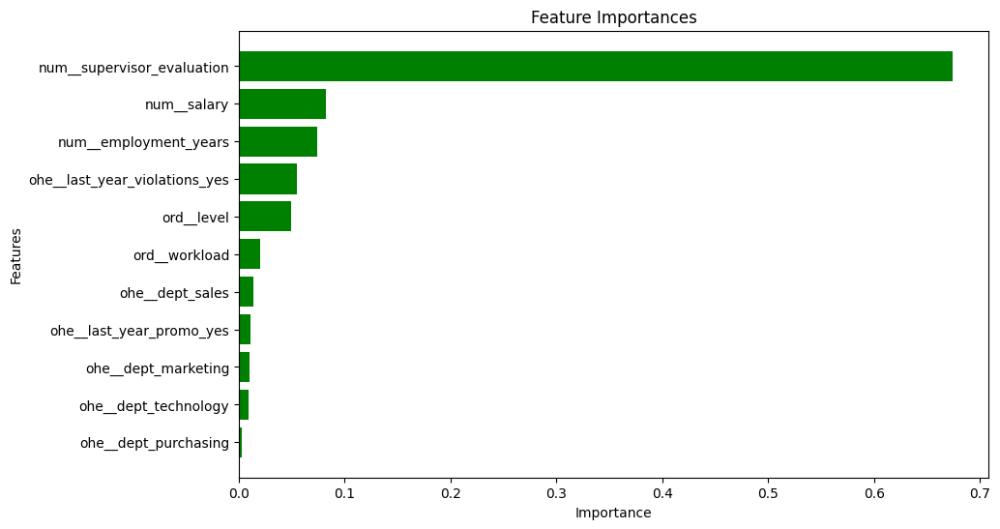

In [113]:
# визуализируем коэффициенты регрессии
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'], color='Green')
plt.xlabel('Importance')
plt.ylabel('Features')  # Добавлена подпись для оси Y
plt.title('Feature Importances')
plt.gca().invert_yaxis()
plt.show()

На основе коэффициентов регрессионной модели дерева решений можно сделать следующие выводы о факторах, влияющих на уровень удовлетворенности сотрудников работой в компании:

- **Оценка супервайзера (num__supervisor_evaluation):**
Наиболее значимый фактор с коэффициентом 0.670691. Это указывает на то, что высокая оценка со стороны руководства напрямую коррелирует с удовлетворенностью работников. Улучшение обратной связи и оценок может существенно повысить уровень удовлетворенности.
- **Зарплата (num__salary):**
С коэффициентом 0.087002, зарплата также играет важную роль, но не так значимо, как оценка супервайзера. Это может свидетельствовать о том, что хотя бы базовый уровень компенсации важен для сотрудников, но не является единственным определяющим фактором.
- **Стаж работы в компании (num__employment_years):**
С коэффициентом 0.075687, стаж также имеет значение, что может означать, что более опытные сотрудники чаще удовлетворены своей работой, возможно, из-за накопленного опыта и понимания корпоративной культуры.
- **Нарушения в прошлом году (ohe__last_year_violations_yes):**
С коэффициентом 0.050546, наличие нарушений может негативно сказываться на удовлетворенности. Это подчеркивает важность соблюдения норм и правил в компании.
- **Уровень должности (ord__level):**
С коэффициентом 0.048903, уровень должности также влияет на удовлетворенность. Это может говорить о том, что сотрудники на более высоких позициях чувствуют себя более удовлетворенными.
- **Рабочая нагрузка (ord__workload):**
С коэффициентом 0.019355, рабочая нагрузка имеет минимальное, но все же заметное влияние. Это может указывать на то, что чрезмерная нагрузка негативно сказывается на удовлетворенности.
- **Отдел продаж (ohe__dept_sales) и другие отделы:**
Остальные факторы, такие как принадлежность к определенным отделам (отделы технологий, маркетинга и закупок) и наличие повышения в прошлом году, имеют значительно меньшую важность, что может означать, что они менее влияют на удовлетворенность по сравнению с вышеперечисленными факторами.

In [116]:
# Основные метрики
r2 = r2_score(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = mean_squared_error(y_test, y_test_pred) ** 0.5  # Взятие квадратного корня для RMSE
mae = mean_absolute_error(y_test, y_test_pred)
smape_satisfaction = smape(y_test, y_test_pred)

# Вывод оценок
print("R2 LinearRegression =", round(r2, 4))
print(f'MSE = {mse:.4f}')
print(f'RMSE = {rmse:.4f}')
print(f'MAE = {mae:.4f}')
print(f'SMAPE = {smape_satisfaction:.4f}')

R2 LinearRegression = 0.8818
MSE = 0.0057
RMSE = 0.0757
MAE = 0.0576
SMAPE = 13.4808


Оценим основные метрики регрессионной модели:

1. **R² (Коэффициент детерминации) = 0.8818**
Это значение указывает на то, что модель объясняет 88.18% вариации уровня удовлетворенности сотрудников. Это довольно высокий показатель, что говорит о хорошей способности модели предсказывать результаты на основе входных данных.

2. **MSE (Среднеквадратичная ошибка) = 0.0057**
MSE измеряет среднюю квадратичную разницу между предсказанными и фактическими значениями. Низкое значение MSE (в данном случае 0.0057) говорит о том, что модель делает небольшие ошибки в предсказаниях.

3. **RMSE (Корень из среднеквадратичной ошибки) = 0.0757**
RMSE представляет собой квадратный корень из MSE и показывает, насколько в среднем предсказания модели отклоняются от фактических значений. Значение 0.0757 указывает на то, что средняя ошибка предсказания составляет примерно 7.57%, что тоже является хорошим показателем.

4. **MAE (Средняя абсолютная ошибка) = 0.0580**
MAE измеряет среднюю величину абсолютных ошибок в предсказаниях. Значение 0.0576 говорит о том, что в среднем предсказания модели отклоняются от фактических значений на 5.76%. Это также указывает на высокую точность модели.

5. **SMAPE (Симметричная средняя абсолютная процентная ошибка) = 13.48%**
SMAPE измеряет точность предсказаний в процентном выражении и учитывает как абсолютную ошибку, так и фактические значения. Значение 13.48% указывает на то, что в среднем предсказания модели отклоняются от фактических значений на 13.48%.


С учетом всех показателей, модель дерева решений демонстрирует высокую точность в предсказании уровня удовлетворенности сотрудников.

In [117]:
def plot_residuals(y_true, y_pred):
    residuals = y_true - y_pred
    
    # Установим стиль графиков
    sns.set(style="whitegrid")
    
    # Рисуем график остатков
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws=dict(color="g"))
    
    # Добавляем вертикальные линии для среднего и медианы остатков
    plt.axhline(y=residuals.mean(), color='r', linestyle='--', label='Среднее остатков')
    plt.axhline(y=residuals.median(), color='r', linestyle='-', label='Медиана остатков')
    
    plt.title('График остатков')
    plt.xlabel('Предсказанные значения')
    plt.ylabel('Остатки')
    plt.legend()
    plt.grid(True)
    
    # Рисуем гистограмму остатков
    plt.subplot(1, 2, 2)
    sns.histplot(residuals, kde=True, color="b")
    
    # Добавляем вертикальные линии для среднего и медианы остатков
    plt.axvline(x=residuals.mean(), color='r', linestyle='-', label='Среднее остатков')
    plt.axvline(x=residuals.median(), color='r', linestyle='--', label='Медиана остатков')
    
    plt.title('Гистограмма остатков')
    plt.xlabel('Остатки')
    plt.ylabel('Частота')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()


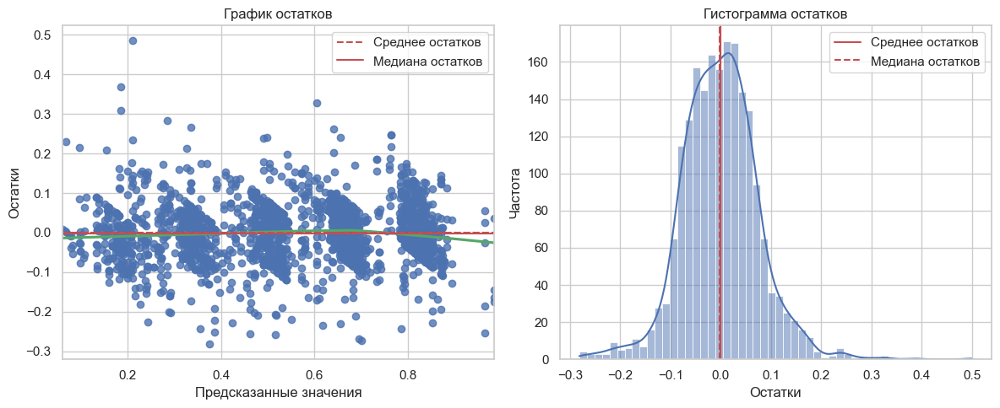

In [118]:
plot_residuals(y_test, y_test_pred)

1. **График остатков:**
- На графике остатков показаны остатки (разница между фактическими и предсказанными значениями) по сравнению с предсказанными значениями.
- Остатки распределены случайным образом вокруг нуля, что является хорошим признаком. Это указывает на то, что модель не имеет систематической ошибки и подходит для задачи.
- Наличие средней и медианной линий позволяет оценить, что они находятся близко к нулю, что также подтверждает отсутствие смещения в предсказаниях.
- Тем не менее, на графике заметно некоторое объединение остатков в отдельные группы вдоль оси X. Это не критично для предсказаний модели, но может говорить о том, что модель не учитывает какие-то важные взаимодействия между переменными или в данных есть нелинейные связи, а линейная модель не может их адекватно интерпретировать.


2. **Гистограмма остатков:**
- Остатки имеют приблизительно нормальное распределение, что является желаемым для линейных моделей. Это подтверждает, что модель адекватно описывает существующие зависимости.
- Наличие максимума вблизи нуля говорит о том, что большинство предсказаний модели находятся близко к фактическим значениям.
- Средние и медианные значения распределения практически совпадают друг с другом и находятся вблизи 0, это также подтверждает то, что остатки не смещены и модель можно использовать для предсказаний.

#### Выводы

1. **Подготовка данных**
- Были определены методы кодирования и масштабирования признаков.
- Все выборки были подготовлены для дальнейшего использования в моделях регрессии и отсортированы по индексам.

2. **Выбор метрики**
- В качестве метрики качества моделей по условиям задачи используется SMAPE (симметричное среднее абсолютное процентное отклонение). Цель — добиться значения SMAPE ≤ 15 на тестовой выборке.

3. **Моделирование**
- Были апробированы два вида базовых моделей регрессии: DecisionTreeRegressor и LinearRegression.
- Для каждой модели были подобраны оптимальные гиперпараметры, а также испробованы другие методы улучшения качества моделей (например, селектор признаков SelectKBest и полимизация PolynomialFeatures). Селектор признаков не помог улучшить качество моделей, а полиномизация 3й степени смогла существенно улучшить качество LinearRegression. Однако она все равно справлялась хуже, чем DecisionTreeRegressor. Возможно не все связи признаков имеют линейный характер, поэтому дерево решений показало себя лучше, чем модель линейной регрессии.
- Для сравнения были также построены и опробованы различные примитивные Dummy-модели, однако они плохо справились с предсказанием целевого признака.
- В результате анализа была выбрана лучшая модель DecisionTreeRegressor(max_depth=22, min_samples_leaf=4, min_samples_split=2) с показателем SMATE = 15.36 (на кросс-валидации). 
- На тестовых данных выбранная модель показала себя еще лучше (SMAPE : 13.4808). Модель справилась с заданием.
- Основные метрики модели:
 - R² = 0.8818: Модель объясняет 88.18% вариации в удовлетворенности, что свидетельствует о высокой предсказательной способности.
 - MSE = 0.0057, RMSE = 0.0757, MAE = 0.0576 : Низкие значения этих метрик указывают на небольшие ошибки в предсказаниях.
- Был проведен графический анализ остатков модели:
 - График остатков показывает случайное распределение, что является хорошим признаком модели. Средние и медианные линии близки к нулю, что подтверждает отсутствие смещения.
 - Гистограмма остатков демонстрирует приближенность к нормальному распределению, что подтверждает адекватность модели.
 - Модель дерева решений эффективно предсказывает уровень удовлетворенности сотрудников, учитывая ряд значимых факторов. Несмотря на высокую точность, наличие на графике кластиеров остатков может указывать на необходимость дальнейшего анализа взаимодействий между переменными или исследование нелинейных зависимостей.

4. **Влияние факторов на удовлетворенность сотрудников**

Анализ регрессионной модели дерева решений выявил несколько ключевых факторов, влияющих на уровень удовлетворенности сотрудников:

- `Оценка супервайзера` (коэффициент 0.674367) является наиболее значимым фактором, указывая на критическую важность обратной связи от руководства.
- `Зарплата` (коэффициент 0.081842) играет роль, но не так значимо, как оценка супервайзера. Это подразумевает, что базовый уровень компенсации важен, но не единственный фактор удовлетворенности.
- `Стаж работы` (коэффициент 0.073810) также влияет на удовлетворенность, вероятно, из-за накопленного опыта и лучшего понимания корпоративной культуры.
- `Нарушения в прошлом году` (коэффициент 0.054570) негативно сказываются на удовлетворенности, подчеркивая важность соблюдения норм.
- `Уровень должности` (коэффициент 0.049149) и рабочая нагрузка (коэффициент 0.020296) также имеют влияние, хотя и менее значительное.

5. **Рекомендации по повышению удовлетворенности сотрудников**

- Улучшение обратной связи от руководства. Рекомендуется регулярно проводить оценки работы сотрудников и предоставляйте конструктивную обратную связь. Это поможет сотрудникам чувствовать себя ценными и поддержанными.
- Пересмотр системы компенсации. Обеспечьте конкурентоспособные зарплаты и рассмотрите возможность дополнительных бонусов или поощрений за достижения, особенно для младших сотрудников, пришедших первый год на работу. Это может повысить мотивацию сотрудников.
- Развитие карьерных возможностей. Рекомендуется создайте программы обучения и повышения квалификации, а также четких показателей эффективности сотрудников разных грейдов. Сотрудники должны видеть пути для карьерного роста внутри компании.
- Мониторинг нарушений и соблюдение норм. Рекомендуется внедрить регулярные проверки соблюдения норм и стандартов, обеспечить прозрачность в процессах и создание безопасной рабочей среды.
- Гибкость в рабочих условиях. Рассмотрите возможность гибкого графика или удаленной работы, если это возможно. Это поможет сотрудникам лучше балансировать работу и личную жизнь.
- Оценка нагрузки на сотрудников. Проводите регулярные опросы для оценки рабочей нагрузки. Убедитесь, что она разумна и не приводит к выгоранию.

## Задача 2: Предсказание увольнения сотрудника из компании

### Загрузка данных

In [119]:
# Определяем пути к файлам
train_quit_path = '/datasets/train_quit.csv'
train_quit_url = 'https://code.s3.yandex.net/datasets/train_quit.csv'

test_target_quit_path = '/datasets/test_target_quit.csv'
test_target_quit_url = 'https://code.s3.yandex.net/datasets/test_target_quit.csv'

In [120]:
# Загрузка файлов
train_quit = load_csv(train_quit_path, train_quit_url)
test_target_quit = load_csv(test_target_quit_path, test_target_quit_url)

In [121]:
# ранее мы уже записали копию файла с тестовыми признаками в новую переменную
test_features_quit.head()

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
0,100298,hr,junior,low,2,no,no,4,19200
1,100480,marketing,junior,low,4,no,no,4,16800
2,100503,purchasing,middle,high,5,no,no,4,55200
3,100610,sales,middle,medium,5,no,no,4,43200
4,100692,sales,middle,high,6,no,no,4,48000


In [122]:
# Общая информация о train_quit
df_info(train_quit)

1. Первые 5 строк датасета:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
0,723290,sales,middle,high,2,no,no,4,54000,no
1,814010,sales,junior,medium,2,no,no,4,27600,no
2,155091,purchasing,middle,medium,5,no,no,1,37200,no
3,257132,sales,junior,medium,2,no,yes,3,24000,yes
4,910140,marketing,junior,medium,2,no,no,5,25200,no



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     4000 non-null   int64 
 1   dept                   4000 non-null   object
 2   level                  4000 non-null   object
 3   workload               4000 non-null   object
 4   employment_years       4000 non-null   int64 
 5   last_year_promo        4000 non-null   object
 6   last_year_violations   4000 non-null   object
 7   supervisor_evaluation  4000 non-null   int64 
 8   salary                 4000 non-null   int64 
 9   quit                   4000 non-null   object
dtypes: int64(4), object(6)
memory usage: 312.6+ KB
None

3. Статистика по колонкам:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
count,4000.000000,4000,4000,4000,4000.000000,4000,4000,4000.000000,4000.000000,4000
unique,NaN,5,3,3,NaN,2,2,NaN,NaN,2
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN,no
freq,NaN,1438,1949,2118,NaN,3887,3455,NaN,NaN,2872
mean,552099.283750,NaN,NaN,NaN,3.701500,NaN,NaN,3.474750,33805.800000,NaN
std,260158.031387,NaN,NaN,NaN,2.541852,NaN,NaN,1.004049,15152.415163,NaN
min,100222.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000,NaN
25%,327785.750000,NaN,NaN,NaN,2.000000,NaN,NaN,3.000000,22800.000000,NaN
50%,546673.000000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000,NaN
75%,781497.750000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000,NaN



4. Доля пропусков в колонках:


,0
id,0.000000
dept,0.000000
level,0.000000
workload,0.000000
employment_years,0.000000
last_year_promo,0.000000
last_year_violations,0.000000
supervisor_evaluation,0.000000
salary,0.000000
quit,0.000000



5. Количество полных дубликатов: 0


- Файл `train_quit` содержит 4000 строк и 10 колонок. Представленные в файле данные в целом соответствуют описанию, представленному в задании.
- Типы данных в колонках соответствуют их фактическому содержанию. Предварительно изменять типы колонок не требуется.
- Пропуски в данных отсутствуют. 

In [123]:
# Общая информация о test_features_quit
df_info(test_features_quit)

1. Первые 5 строк датасета:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
0,100298,hr,junior,low,2,no,no,4,19200
1,100480,marketing,junior,low,4,no,no,4,16800
2,100503,purchasing,middle,high,5,no,no,4,55200
3,100610,sales,middle,medium,5,no,no,4,43200
4,100692,sales,middle,high,6,no,no,4,48000



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     2000 non-null   int64 
 1   dept                   1997 non-null   object
 2   level                  1999 non-null   object
 3   workload               1999 non-null   object
 4   employment_years       2000 non-null   int64 
 5   last_year_promo        2000 non-null   object
 6   last_year_violations   2000 non-null   object
 7   supervisor_evaluation  2000 non-null   int64 
 8   salary                 2000 non-null   int64 
dtypes: int64(4), object(5)
memory usage: 140.8+ KB
None

3. Статистика по колонкам:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
count,2000.000000,1997,1999,1999,2000.000000,2000,2000,2000.000000,2000.000000
unique,NaN,5,3,3,NaN,2,2,NaN,NaN
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN
freq,NaN,763,974,1043,NaN,1937,1738,NaN,NaN
mean,552765.213500,NaN,NaN,NaN,3.666500,NaN,NaN,3.526500,34066.800000
std,253851.326129,NaN,NaN,NaN,2.537222,NaN,NaN,0.996892,15398.436729
min,100298.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000
25%,339052.000000,NaN,NaN,NaN,1.000000,NaN,NaN,3.000000,22800.000000
50%,550793.000000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000
75%,765763.750000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000



4. Доля пропусков в колонках:


,0
id,0.000000
employment_years,0.000000
last_year_promo,0.000000
last_year_violations,0.000000
supervisor_evaluation,0.000000
salary,0.000000
level,0.050000
workload,0.050000
dept,0.150000



5. Количество полных дубликатов: 0


- Файл `test_features_quit` содержит 2000 строк и 9 колонок (те же колонки, кроме целевого признака).
- Представленные в файле данные в целом соответствуют описанию, указанному в задании.
- Типы данных в колонках соответствуют их фактическому содержанию. Предварительно изменять типы колонок не требуется.
- Файл также содержит небольшое количество пропусков в колонка `level`, `workload` и `dept`. 

Ранее мы уже подробно анализировали содержание этого файла.

In [124]:
# Общая информация о train_quit
df_info(test_target_quit)

1. Первые 5 строк датасета:


,id,quit
0,999029,yes
1,372846,no
2,726767,no
3,490105,no
4,416898,yes



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2000 non-null   int64 
 1   quit    2000 non-null   object
dtypes: int64(1), object(1)
memory usage: 31.4+ KB
None

3. Статистика по колонкам:


,id,quit
count,2000.000000,2000
unique,NaN,2
top,NaN,no
freq,NaN,1436
mean,552765.213500,NaN
std,253851.326129,NaN
min,100298.000000,NaN
25%,339052.000000,NaN
50%,550793.000000,NaN
75%,765763.750000,NaN



4. Доля пропусков в колонках:


,0
id,0.000000
quit,0.000000



5. Количество полных дубликатов: 0


Файл `test_target_quit` содержит 2000 строк и 1 колонку (целевой признак).

Представленные в файле данные в целом соответствуют описанию, указанному в задании.

Типы данных в колонках соответствуют их фактическому содержанию. Предварительно изменять типы колонок не требуется.

Несмотря на то, что размерности тестовых выборок с входящими и целевыми признаками совпадают, нужно будет убедиться в соответствии `id` пользователей в обеих таблицах. Также нужно будет убедиться, что в тренировочный датасет не попали пользователи из тестового, чтобы не допустить обучение модели на тестовых данных.

**По итогам загрузки и ознакомления с исходными данными можно сделать следующие выводы:**

- Содержание колонок и типы данных соответствуют заявленным.
- Пропуски в данных отсутствуют.
- Названия колонок представлены в формате "snake_case" и дальнейших изменений не требуют.
- Полные дубликаты в каждой отдельной таблице отсутствуют.

На этапе предобработки данных, необходимо будет:

- проверить наличие косвенных дубликатов и опечаток;
- убедиться что в тренировочные данные не попали тестовые.
- убедиться, что id пользователей в двух таблицах тестовой выборки совпадают и указаны в едином порядке (отсортированы).

### Предобработка данных

#### Обработка текстовых данных

In [125]:
# посмотрим уникальные нечисловые значения по каждой колонке
print_unique_values(train_quit)

Уникальные значения в колонке dept: ['hr', 'marketing', 'purchasing', 'sales', 'technology']
Уникальные значения в колонке level: ['junior', 'middle', 'sinior']
Уникальные значения в колонке workload: ['high', 'low', 'medium']
Уникальные значения в колонке last_year_promo: ['no', 'yes']
Уникальные значения в колонке last_year_violations: ['no', 'yes']
Уникальные значения в колонке quit: ['no', 'yes']


In [126]:
# Сравним их с теми, чтобы были в предыдущей выборке
# посмотрим уникальные нечисловые значения по каждой колонке
print_unique_values(train_job_satisfaction_rate)

Уникальные значения в колонке dept: ['hr', 'marketing', 'purchasing', 'sales', 'technology']
Уникальные значения в колонке level: ['junior', 'middle', 'sinior']
Уникальные значения в колонке workload: ['high', 'low', 'medium']
Уникальные значения в колонке last_year_promo: ['no', 'yes']
Уникальные значения в колонке last_year_violations: ['no', 'yes']


In [127]:
# посмотрим уникальные нечисловые значения по каждой колонке
print_unique_values(test_target_quit)

Уникальные значения в колонке quit: ['no', 'yes']


С текстовыми данными все в порядке, обработка не требуется.

#### Неявные дубликаты

In [128]:
train_quit.head()

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
0,723290,sales,middle,high,2,no,no,4,54000,no
1,814010,sales,junior,medium,2,no,no,4,27600,no
2,155091,purchasing,middle,medium,5,no,no,1,37200,no
3,257132,sales,junior,medium,2,no,yes,3,24000,yes
4,910140,marketing,junior,medium,2,no,no,5,25200,no


Посмотрим есть ли дубликаты по колонке 'id':

In [129]:
for df in [train_quit, test_target_quit]:
    print(f'Количество дубликатов по колонке "id": {df["id"].duplicated().sum()}')

Количество дубликатов по колонке "id": 0
Количество дубликатов по колонке "id": 0


Посмотрим, если ли дубликаты по всем остальным колонкам, кроме `id`.

In [130]:
train_quit.columns

Index(['id', 'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary', 'quit'],
      dtype='object')

In [131]:
train_quit.duplicated(subset=[
    'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary', 'quit']).sum()

1413

In [132]:
# посмотрим что за дубликаты
train_quit[
    train_quit.duplicated(subset=[
        'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary', 'quit'],
                                           keep=False)
].sort_values(by=[ 
    'dept', 'level', 'workload', 'employment_years',
       'last_year_promo', 'last_year_violations', 'supervisor_evaluation',
       'salary', 'quit'])

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
891,746794,hr,junior,high,1,no,no,3,38400,yes
1509,531380,hr,junior,high,1,no,no,3,38400,yes
2090,839298,hr,junior,high,2,no,no,4,40800,no
3758,608156,hr,junior,high,2,no,no,4,40800,no
2899,626087,hr,junior,low,1,no,no,2,15600,yes
...,...,...,...,...,...,...,...,...,...,...
1861,662240,technology,middle,medium,9,no,no,4,45600,no
1809,555944,technology,sinior,medium,6,no,yes,3,62400,no
3035,897944,technology,sinior,medium,6,no,yes,3,62400,no
1696,327415,technology,sinior,medium,8,no,no,4,56400,no


Также как и в задаче 1, если не учитывать `id`, то в данных появляется очень много дубликатов. Для исследовательского и статистического анализа оставим дубликаты в данных, так как это данные о реальных сотрудниках и их удаление может исказить имещиеся взаимосвязи и выводы на текущем этапе.

Обработаем их позже на этапе подготовки данных к обучению моделей.

#### Тренировочные и тестовые данные

Проверим, не попали ли тестовые данные в тренировочный набор.

In [133]:
train_quit[train_quit['id'].isin(test_target_quit['id'])]

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit


Кажется, все в порядке.

Также проверим, совпадают ли id пользователей в тестовых файлах с входящими признаками и целевой переменной.

In [134]:
# Отсортируем оба набора по id и сбросим индекс
test_features_quit = test_features_quit.sort_values(by='id').reset_index(drop=True)
test_target_quit = test_target_quit.sort_values(by='id').reset_index(drop=True)

In [135]:
(test_features_quit['id'] != test_target_quit['id']).sum()

0

Все номера id в обоих наборах совпадают.

#### Выводы

В днном разделе было сделано следующее:

1. **Обработка текстовых данных**: Текстовые данные не требуют дополнительной обработки, так как они в порядке.
2. **Неявные дубликаты**: Проверка на дубликаты по колонке 'id' показала отсутствие проблем в данных. При анализе остальных колонок были выявлены многочисленные дубликаты, однако нет оснований считать их ошибочными, поэтому они были оставлены в таблице.
3. **Тренировочные и тестовые данные**: Проверка на наличие тестовых данных в тренировочном наборе показала, что все в порядке. Идентификаторы пользователей в тестовых файлах совпадают с входными признаками и целевой переменной.

### Исследовательский анализ

Посмотрим, одинаковые ли у тренировочные наборы в обеих задачах.

In [136]:
train_quit = train_quit.sort_values(by='id').reset_index(drop=True)
train_quit = train_quit.set_index('id')
train_quit

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
id,,,,,,,,,
100222,sales,junior,medium,3,no,no,2,20400,yes
100459,purchasing,junior,medium,3,no,no,3,21600,yes
100469,marketing,junior,medium,1,no,no,4,28800,no
100601,technology,middle,high,4,no,no,4,68400,no
100858,sales,junior,medium,2,no,no,4,25200,yes
...,...,...,...,...,...,...,...,...,...
998517,purchasing,middle,low,5,no,no,3,19200,no
999003,hr,middle,low,3,no,no,2,24000,yes
999158,purchasing,junior,medium,1,no,yes,1,21600,yes


In [137]:
train_job_satisfaction_rate.head()

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
id,,,,,,,,,
100954,purchasing,junior,low,1,no,no,4,15600,0.60
101057,sales,junior,low,1,no,yes,4,19200,0.45
101074,sales,junior,medium,2,no,no,2,20400,0.36
101081,sales,middle,low,2,no,no,4,28800,0.66
101129,technology,junior,medium,1,no,no,4,34800,0.71


In [138]:
# Посмотрим, есть ли пересекающшиеся пользователи в тренировочных данных
train_quit.index.intersection(train_job_satisfaction_rate.index)

Int64Index([], dtype='int64', name='id')

Кажется у нас совершенно новая тренировочная выборка с данными по другим пользователям.

#### Распределение данных и выбросы

In [139]:
# посмотрим общую статистику по всем таблицам:
for df in [train_quit, test_features_quit, test_target_quit]:
    display(df.describe(include='all').T)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
dept,4000,5,sales,1438,NaN,NaN,NaN,NaN,NaN,NaN,NaN
level,4000,3,junior,1949,NaN,NaN,NaN,NaN,NaN,NaN,NaN
workload,4000,3,medium,2118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employment_years,4000.0,NaN,NaN,NaN,3.7015,2.541852,1.0,2.0,3.0,6.0,10.0
last_year_promo,4000,2,no,3887,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_year_violations,4000,2,no,3455,NaN,NaN,NaN,NaN,NaN,NaN,NaN
supervisor_evaluation,4000.0,NaN,NaN,NaN,3.47475,1.004049,1.0,3.0,4.0,4.0,5.0
salary,4000.0,NaN,NaN,NaN,33805.8,15152.415163,12000.0,22800.0,30000.0,43200.0,96000.0
quit,4000,2,no,2872,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,2000.0,NaN,NaN,NaN,552765.2135,253851.326129,100298.0,339052.0,550793.0,765763.75,999029.0
dept,1997,5,sales,763,NaN,NaN,NaN,NaN,NaN,NaN,NaN
level,1999,3,junior,974,NaN,NaN,NaN,NaN,NaN,NaN,NaN
workload,1999,3,medium,1043,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employment_years,2000.0,NaN,NaN,NaN,3.6665,2.537222,1.0,1.0,3.0,6.0,10.0
last_year_promo,2000,2,no,1937,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_year_violations,2000,2,no,1738,NaN,NaN,NaN,NaN,NaN,NaN,NaN
supervisor_evaluation,2000.0,NaN,NaN,NaN,3.5265,0.996892,1.0,3.0,4.0,4.0,5.0
salary,2000.0,NaN,NaN,NaN,34066.8,15398.436729,12000.0,22800.0,30000.0,43200.0,96000.0


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,2000.0,NaN,NaN,NaN,552765.2135,253851.326129,100298.0,339052.0,550793.0,765763.75,999029.0
quit,2000,2,no,1436,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Судя по статистике значимых отличий в тренировочных и тестовых данных нет.

Посмотрим внимательней на распределения.

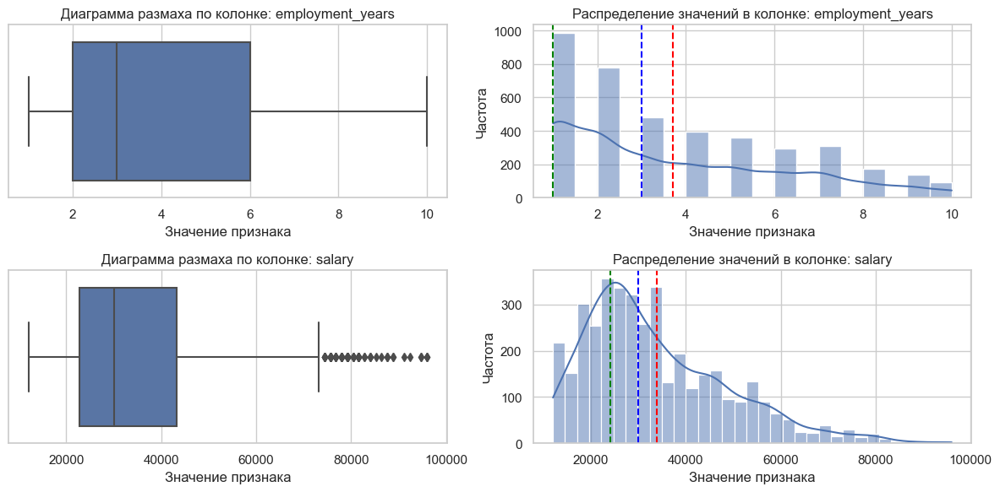

In [140]:
plot_box_hist_chart(train_quit.drop('supervisor_evaluation', axis=1))

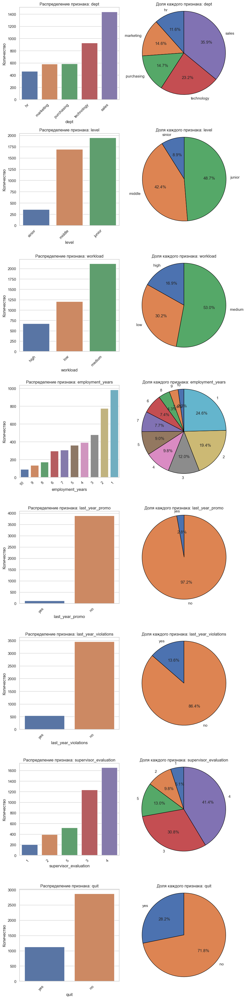

In [141]:
plot_bar_pie_chart(train_quit, ['dept', 'level', 'workload', 'employment_years', 'last_year_promo',
       'last_year_violations', 'supervisor_evaluation', 'quit'])

In [142]:
test_target_quit.columns

Index(['id', 'quit'], dtype='object')

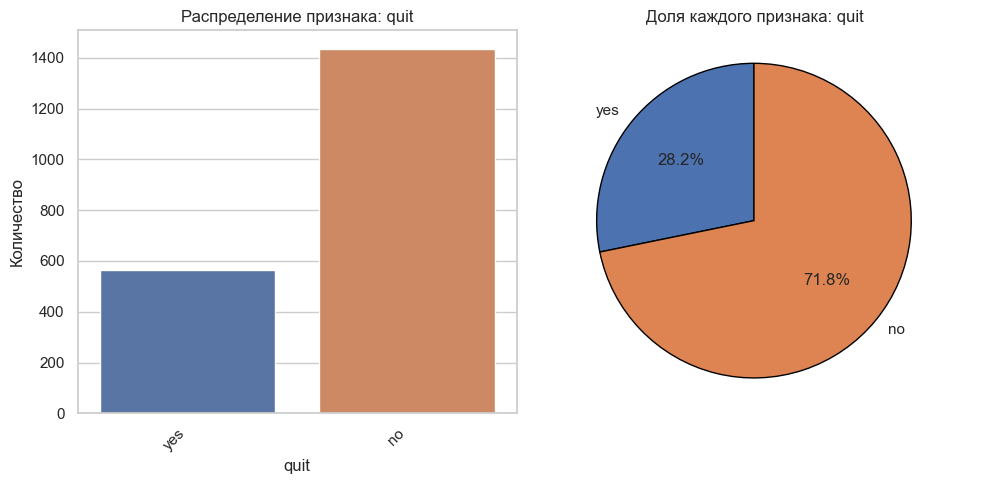

In [143]:
plot_bar_pie_chart(test_target_quit, ['quit'])

В целом распределение всех данных такое же как и в Задаче 1.

Тренировочная и тестовая выборки содержат около 28% записей уволившихся пользователей.

Это говорит о наличии дизбаланса в классах целевого признака. Лучше учитывать это в будущем при построении модели машинного обучения и попробовать разные методы сэмплирования данных.

Посмотрим внимательно на уволившихся сотрудников и попробуем составить его портрет.

#### Портрет «уволившегося сотрудника»

In [144]:
test_features_quit.merge(test_target_quit, how='left')

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
0,100298,hr,junior,low,2,no,no,4,19200,no
1,100480,marketing,junior,low,4,no,no,4,16800,no
2,100503,purchasing,middle,high,5,no,no,4,55200,no
3,100610,sales,middle,medium,5,no,no,4,43200,no
4,100692,sales,middle,high,6,no,no,4,48000,no
...,...,...,...,...,...,...,...,...,...,...
1995,997290,sales,sinior,medium,7,no,no,4,58800,no
1996,998548,marketing,junior,medium,2,no,no,4,32400,yes
1997,998762,technology,junior,low,3,no,no,3,22800,yes
1998,998900,marketing,middle,medium,7,no,no,3,45600,no


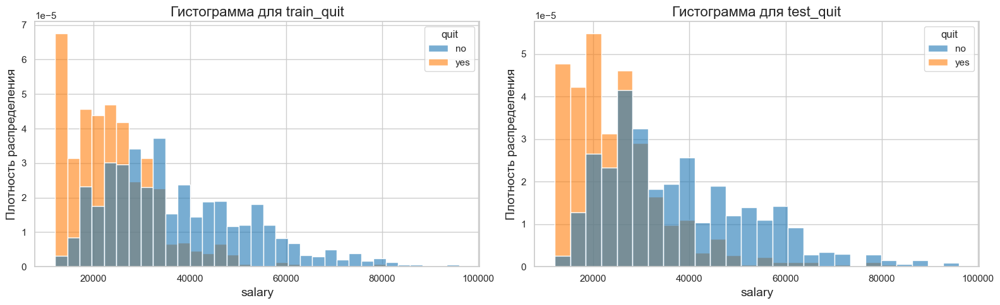

In [145]:
# Построим гистограмму с распределением непрерывного числового признака `salary` в тренировочном и тестовом датасете
palette = {'no': '#1f77b4', 'yes': '#ff7f0e'}

# Создание фигуры с двумя подграфиками
fig, axes = plt.subplots(1, 2, figsize=(16, 5))  # 1 строка, 2 столбца

# График для train_quit
sns.histplot(train_quit.sort_values('quit'), x='salary', hue='quit', bins='auto', stat='density', alpha=0.6, common_norm=False, palette=palette, ax=axes[0])
axes[0].set_title('Гистограмма для train_quit', fontsize=16)
axes[0].set_xlabel('salary', fontsize=14)
axes[0].set_ylabel('Плотность распределения', fontsize=14)

# График для test_quit
sns.histplot(test_features_quit.merge(test_target_quit, how='left'), x='salary', hue='quit', bins='auto', stat='density', alpha=0.6, common_norm=False, palette=palette, ax=axes[1])
axes[1].set_title('Гистограмма для test_quit', fontsize=16)
axes[1].set_xlabel('salary', fontsize=14)
axes[1].set_ylabel('Плотность распределения', fontsize=14)

plt.tight_layout()  # Улучшение расположения элементов
plt.show()  # Отображение графиков

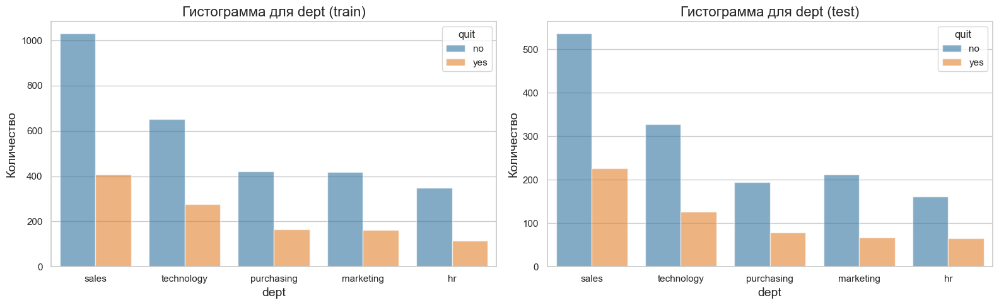

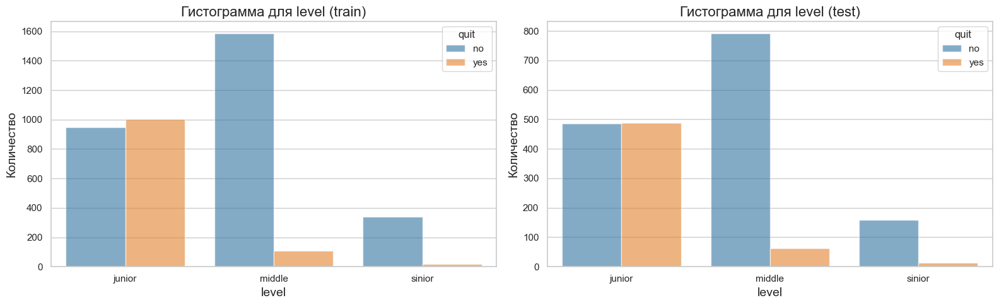

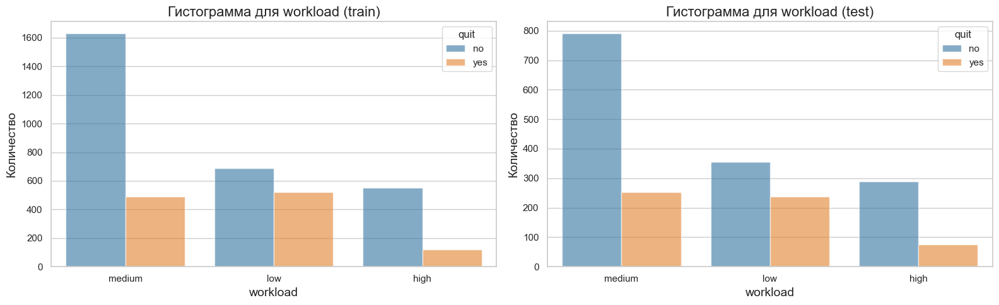

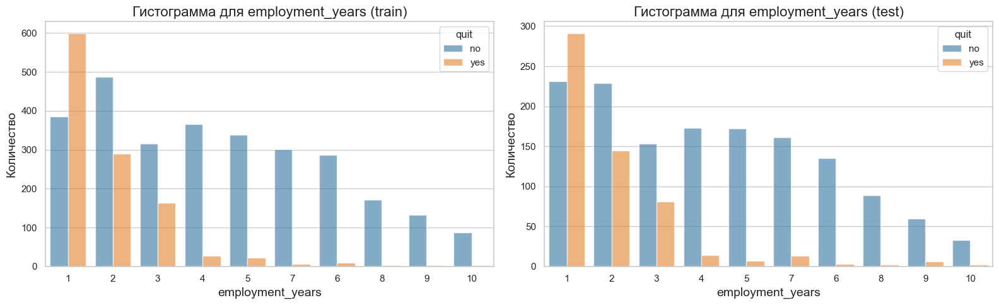

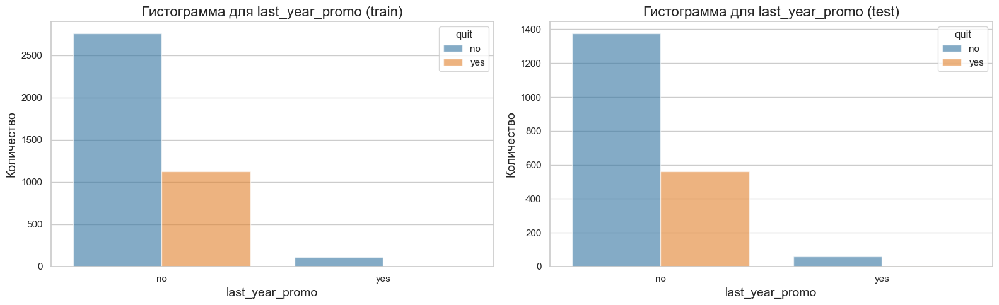

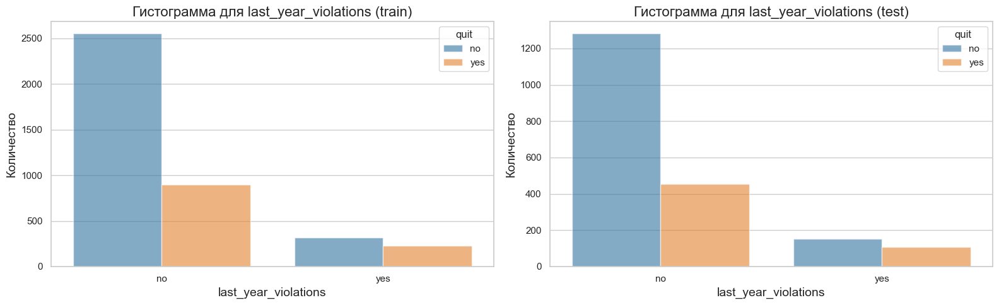

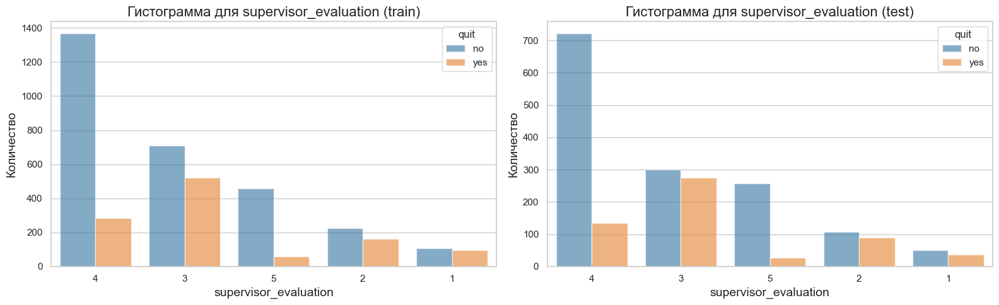

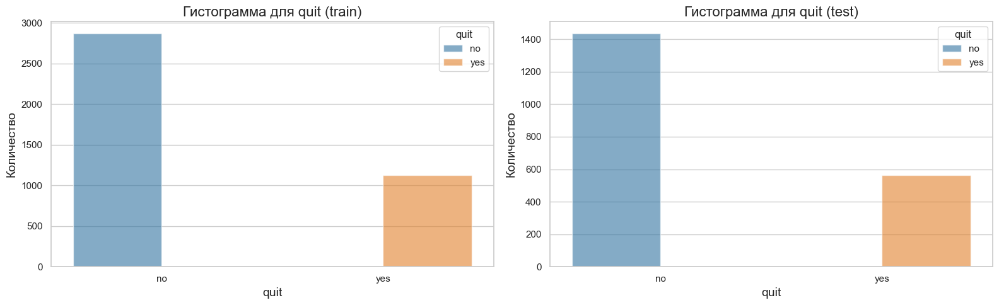

In [146]:
# Построим гистограммы дискретным признакам в тренировочном и тестовом датасетах
unique_categories = [col for col in train_quit.drop('salary', axis=1).columns]

# Цикл по всем дискретным столбцам
for col in unique_categories:
    plt.figure(figsize=(16, 5))  # Устанавливаем размер графика

    # График для train_quit
    plt.subplot(1, 2, 1)  # 1 строка, 2 столбца, 1-й график
    sns.countplot(data=train_quit.sort_values('quit'), x=col, hue='quit', palette=palette, alpha=0.6, order=train_quit[col].value_counts().index)
    plt.title(f'Гистограмма для {col} (train)', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Количество', fontsize=14)

    # График для test
    plt.subplot(1, 2, 2)  # 1 строка, 2 столбца, 2-й график
    test_data = test_features_quit.merge(test_target_quit, how='left')
    sns.countplot(data=test_data, x=col, hue='quit', palette=palette, alpha=0.6, order=train_quit[col].value_counts().index)
    plt.title(f'Гистограмма для {col} (test)', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Количество', fontsize=14)

    plt.tight_layout()  # Улучшение расположения элементов
    plt.show()  # Отображение графиков

Построим гистограммы для категориальных признаков, используя относительные величины. Это позволит избежать проблем, связанных с масштабом исследования, поскольку абсолютные значения могут быть неинформативными при различном размере выборки. 

Для построения портрета "уволившегося сотрудника" мы будем рассчитывать относительные частоты только для группы с quit = 'yes', что позволит более точно оценить характеристики клиентов, избегая искажений от сильного дисбаланса целевого признака.

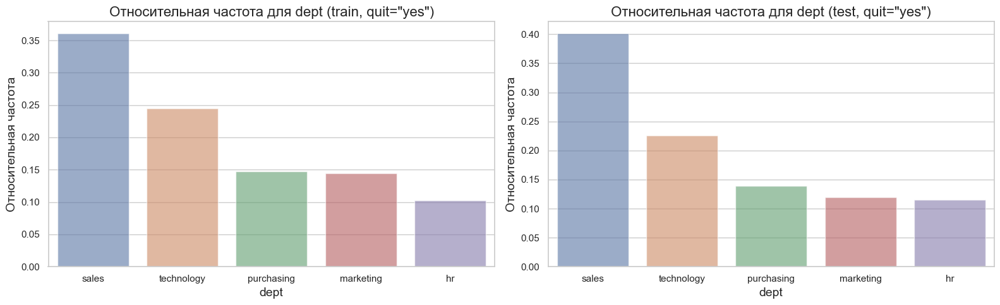

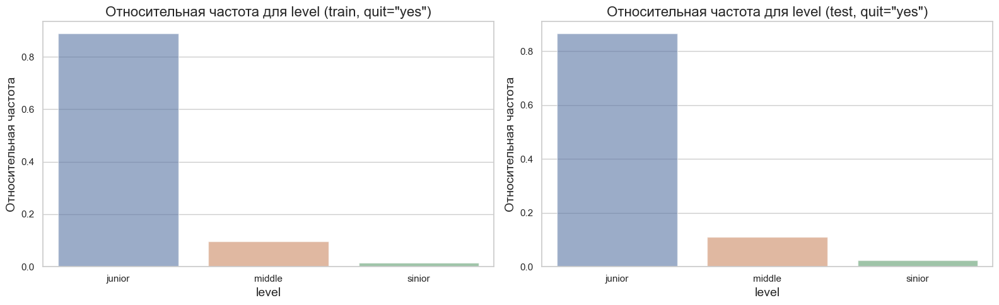

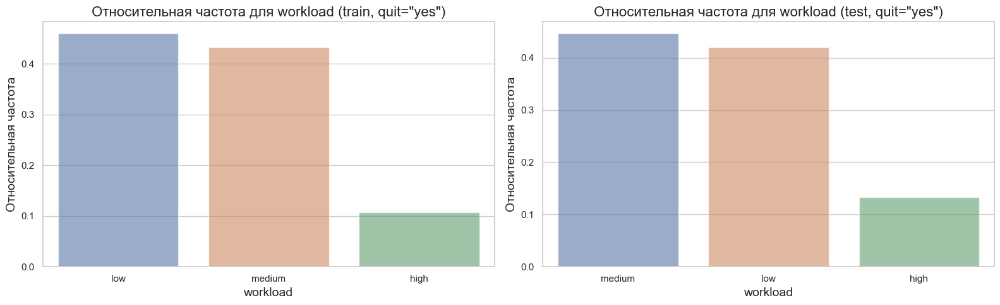

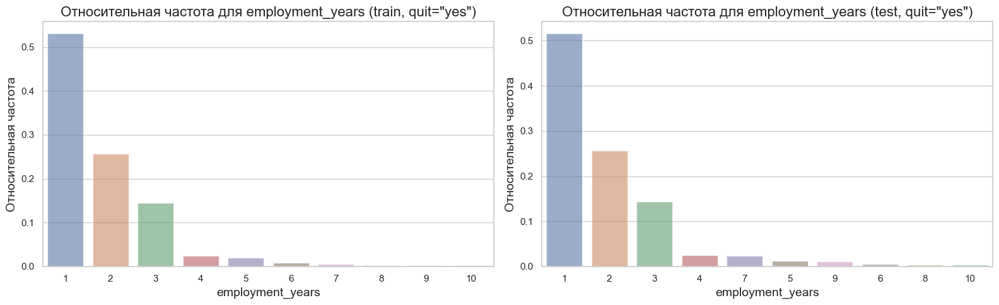

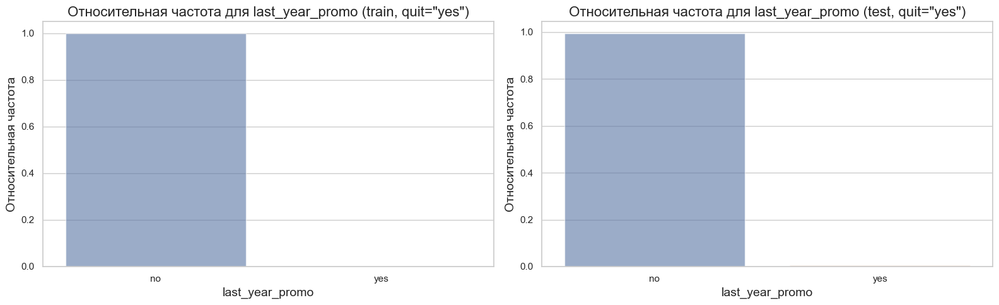

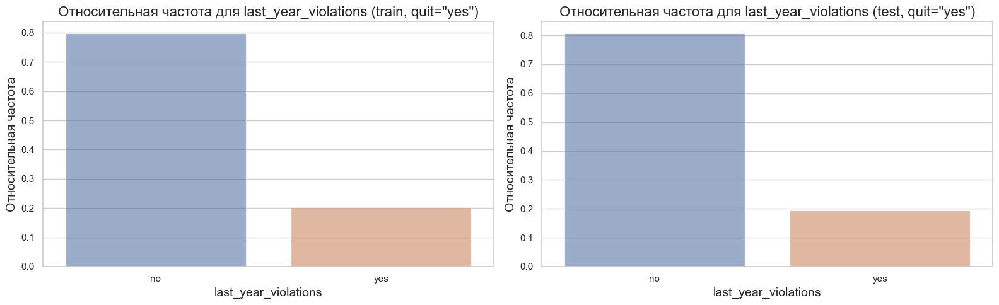

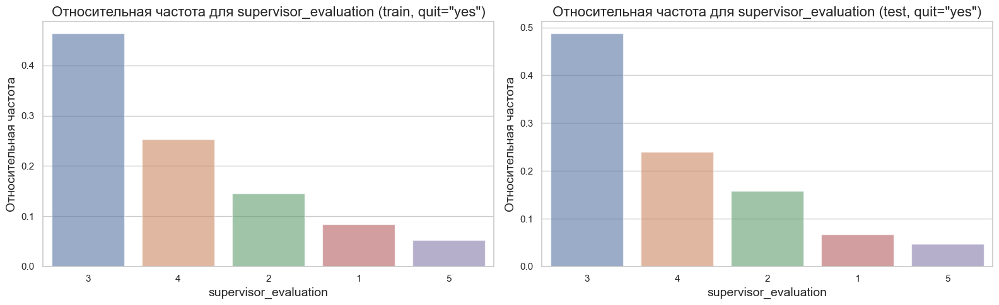

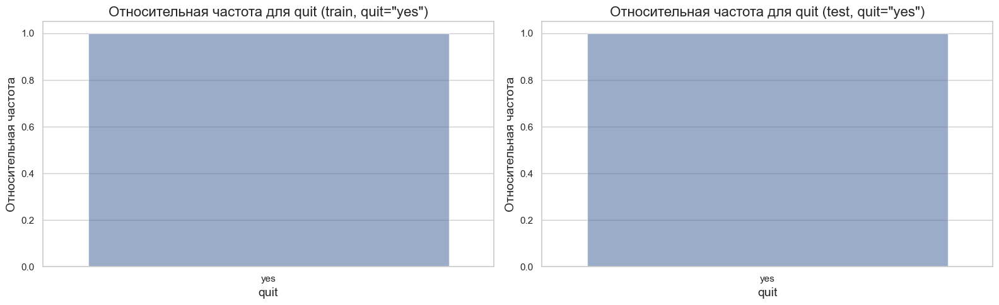

In [147]:
# Посмтроим 
unique_categories = [col for col in train_quit.drop('salary', axis=1).columns]
test_data = test_features_quit.merge(test_target_quit, how='left')

# Цикл по всем дискретным столбцам
for col in unique_categories:
    plt.figure(figsize=(16, 5))  # Устанавливаем размер графика

    # График для train_quit
    plt.subplot(1, 2, 1)  # 1 строка, 2 столбца, 1-й график
    train_counts = train_quit[train_quit['quit'] == 'yes'][col].value_counts(normalize=True)
    sns.barplot(x=train_counts.index, y=train_counts.values, alpha=0.6, order=train_counts.index)
    plt.title(f'Относительная частота для {col} (train, quit="yes")', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Относительная частота', fontsize=14)

    # График для test
    plt.subplot(1, 2, 2)  # 1 строка, 2 столбца, 2-й график
    test_counts = test_data[test_data['quit'] == 'yes'][col].value_counts(normalize=True)
    sns.barplot(x=test_counts.index, y=test_counts.values, alpha=0.6, order=test_counts.index)
    plt.title(f'Относительная частота для {col} (test, quit="yes")', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Относительная частота', fontsize=14)

    plt.tight_layout()  # Улучшение расположения элементов
    plt.show()  # Отображение графиков

При сравнении распределений признаков можно заметить, что чаще всего увольняются сотрудники в их первый год работы, получившие оценку супервайзера 3, а также получающие очень низкую зарплату (<20 Тыс). Возможно это интерны или стажеры.

На графиках видно, что:
- увольняются в основном junior с низким workload.
- от отдела в котором они работают, это не зависит. Чаще всего увольняются из sales, но там и работает больше людей. 
- уволившиеся сотрудники раза в 2 чаще допускают нарушение контракта.

In [148]:
# посмотрим статистику
for df in [train_quit.query('quit == "yes"'), train_quit.query('quit == "no"')]:
    display(df.describe(include='all').T)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
dept,1128,5,sales,407,NaN,NaN,NaN,NaN,NaN,NaN,NaN
level,1128,3,junior,1003,NaN,NaN,NaN,NaN,NaN,NaN,NaN
workload,1128,3,low,519,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employment_years,1128.0,NaN,NaN,NaN,1.844858,1.27492,1.0,1.0,1.0,2.0,10.0
last_year_promo,1128,2,no,1127,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_year_violations,1128,2,no,900,NaN,NaN,NaN,NaN,NaN,NaN,NaN
supervisor_evaluation,1128.0,NaN,NaN,NaN,3.046099,0.973291,1.0,3.0,3.0,4.0,5.0
salary,1128.0,NaN,NaN,NaN,23885.106383,9351.599505,12000.0,16800.0,22800.0,27600.0,79200.0
quit,1128,1,yes,1128,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
dept,2872,5,sales,1031,NaN,NaN,NaN,NaN,NaN,NaN,NaN
level,2872,3,middle,1586,NaN,NaN,NaN,NaN,NaN,NaN,NaN
workload,2872,3,medium,1630,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employment_years,2872.0,NaN,NaN,NaN,4.43071,2.544635,1.0,2.0,4.0,6.0,10.0
last_year_promo,2872,2,no,2760,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_year_violations,2872,2,no,2555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
supervisor_evaluation,2872.0,NaN,NaN,NaN,3.643106,0.965295,1.0,3.0,4.0,4.0,5.0
salary,2872.0,NaN,NaN,NaN,37702.228412,15218.977339,12000.0,25200.0,34800.0,46800.0,96000.0
quit,2872,1,no,2872,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Составим портрет типичного **"уволившегося сотрудника"**:

- Это junior с низким уровне загрузки, работающий первый-второй год и получающий низкую зарплату (около 20тыс.). Руководитель оценил его работу на среднем уровне в 3 балла. Сотрудник чаще чем в среднем допускает нарушение трудового контракта.


Из этого можно сделать предположение о **возможных причинах увольнения** таких сотрудников:

 - Низкая зарплата: Уровень дохода может не соответствовать ожиданиям и потребностям сотрудника.
 - Низкая загрузка: Недостаток задач и вызовов может приводить к скуке и снижению мотивации.
 - Средняя оценка работы: Оценка в 3 балла может восприниматься как отсутствие признания и поддержки со стороны руководства.
 - Низкая мотивация и трудовая дисциплина: Частые нарушения могут свидетельствовать о недовольстве условиями труда или отсутствием интереса к работе.

**Рекомендации:**
 - Увеличение загрузки: Предоставить новичкам больше задач, чтобы сотрудник чувствовал себя вовлеченным.
 - Оплата труда: Для сотрудников младших грейдов сделать привязку зарплаты к уровню загрузки (внедрения системы бонусов), чтобы повысить мотивацию.
 - Обратная связь и оценка деятельности: Регулярно проводить встречи для обсуждения работы и достижения целей, чтобы повысить уровень удовлетворенности. Установить четкие и понятные критерии по которым будут оценивать сотруднка, чтобы он понимал, что ему нужно сделать чтобы получить оценки 4 или 5.
 - Трудовая дисциплина: Для незначительных нарушений (вроде опозданий) можно внедрить систему штрафов или наоборот адаптировать правила компании и сделать их более гибкими. Например, разрешить опаздывать на 10-15 минут, но если делать это больше 3 раз в неделю, то сотрудник платит небольшой шраф. Т.к. нарушения чаще допускают сотрудники младших грейдов или недавно пришедшие в компанию, то можно разрешить опоздания (или другие отсутупления от правил) только для старших коллег, отработавших в компании не менее года. Это поможет дисциплинировать новых сотрудников и приучить их к отвественному поведению.

#### Удовлетворенность работой и увольнения

Добавим в тестовую таблицу предсказанный уровень удовлетворенности и целевую переменную quit, и посмотрим есть ли между ними связь.

In [149]:
# сделаем необходимые преобразования перед объединением
y_test.name = 'job_satisfaction_rate'

test_features_quit = test_features_quit.set_index('id')
test_target_quit = test_target_quit.set_index('id')

In [150]:
for df in [test_features_quit, y_test, test_target_quit]:
    print(df.shape)

(2000, 8)
(2000,)
(2000, 1)


In [151]:
# объединим таблицы
features_quit_satisfaction = test_features_quit.join([y_test, test_target_quit], how='left')

In [152]:
# проверим пропуски
features_quit_satisfaction.isna().sum()

dept                     3
level                    1
workload                 1
employment_years         0
last_year_promo          0
last_year_violations     0
supervisor_evaluation    0
salary                   0
job_satisfaction_rate    0
quit                     0
dtype: int64

In [153]:
features_quit_satisfaction.shape

(2000, 10)

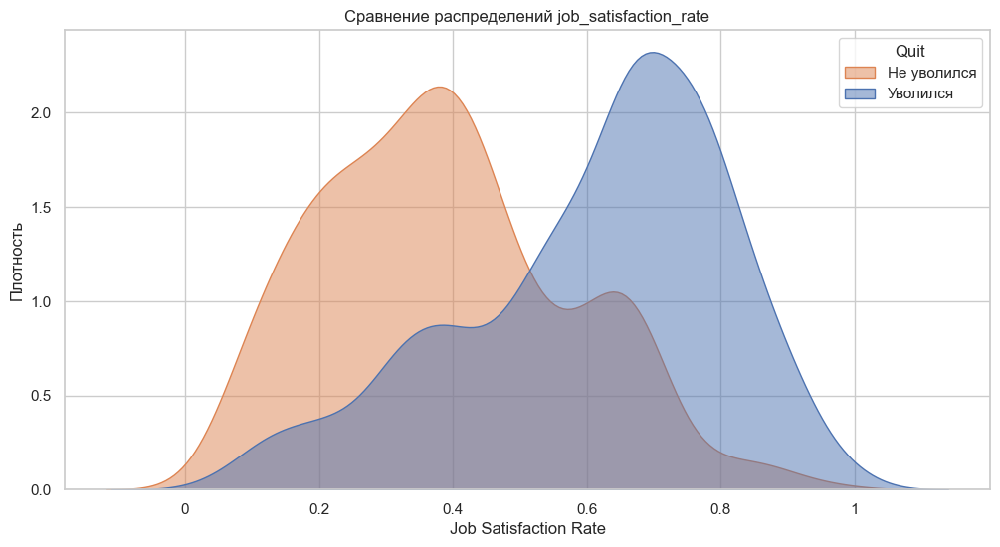

In [154]:
# Построение графиков для сравнения распределений
plt.figure(figsize=(12, 6))

# KDE Plot
sns.kdeplot(data=features_quit_satisfaction, x='job_satisfaction_rate', hue='quit', common_norm=False, fill=True, alpha=0.5)
plt.title('Сравнение распределений job_satisfaction_rate')
plt.xlabel('Job Satisfaction Rate')
plt.ylabel('Плотность')
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1], ['0', '0.2', '0.4', '0.6', '0.8', '1'])
plt.legend(title='Quit', labels=['Не уволился', 'Уволился'])
plt.grid(True)
plt.show()

Уровень удовлетворенности действительно влияет на увольнения сотрудников.

Увольняются чаще сотрудники, со средним уровнем удовлетворенности в районе 0.4.

Чаще остаются работь сотрудники со средним уровенм удовлетворенности в районе 0.6.

Поскольку мы рассматриваем выборки сотрудников, необходимо проверить, является ли гипотеза о том, что средний уровень удовлетворенности оставшихся сотрудников выше, чем у уволившихся, статистически достоверной в отношении генеральной совокупности. Сформулируем гипотезу следующим образом:

- **H0 (нулевая гипотеза):** Средний уровень удовлетворенности у уволившихся и оставшихся сотрудников одинаковый.
- **H1 (альтернативная гипотеза):** Средний уровень удовлетворенности оставшихся сотрудников выше, чем у уволившихся.

In [155]:
print(f'Средний уровень удовлетворенности оставшихся сотрудников:', round(features_quit_satisfaction.query('quit == "no"')['job_satisfaction_rate'].mean(), 2))
print(f'Средний уровень удовлетворенности уволившихся сотрудников:', round(features_quit_satisfaction.query('quit == "yes"')['job_satisfaction_rate'].mean(), 2))

Средний уровень удовлетворенности оставшихся сотрудников: 0.61
Средний уровень удовлетворенности уволившихся сотрудников: 0.39


In [156]:
# выбранный уровень статистической значимости
alpha = 0.01
print(f"Уровень статистической значимости: {alpha * 100}%")

# проведем односторонний ttest
st_results = st.ttest_ind(
    features_quit_satisfaction.query('quit == "no"')['job_satisfaction_rate'],
    features_quit_satisfaction.query('quit == "yes"')['job_satisfaction_rate'],
    alternative='greater') # ‘greater’: the mean of first sample is greater than the mean of the second sample.

#выведем полученное значение p-value
print('p-value:', st_results.pvalue)

if st_results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

Уровень статистической значимости: 1.0%
p-value: 6.155610332585965e-105
Отвергаем нулевую гипотезу


**Результат проверки:** На имеющихся данных, при уровне значимости 1% (уровне доверия 99%) есть основания отвергнуть нулевую гипотезу (H0) о равенстве среднего уровеня удовлетворенности оставшихся и уволившихся сотрудников в пользу альтернативной гипотезы (H1) о том, что уровень удовлетворенности оставшихся сотрудников выше, чем у сотрудников которые уволились.

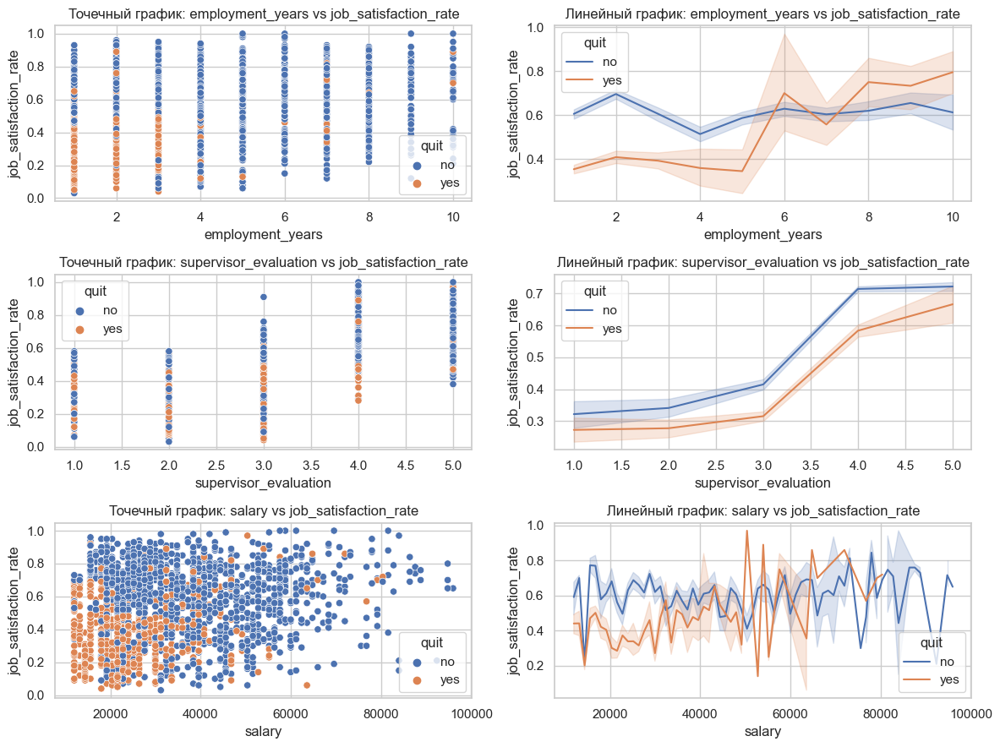

In [157]:
# Построим графики scatterplot и Lineplot (с медианой и 95% доверительным интервалом) для числовых колонок.
plot_scatter_line_chart(features_quit_satisfaction, y_label='job_satisfaction_rate', hue='quit')

До 6 года работы, действительно чаще увольняются сотрудники с низким уровенм удовлетворенности. Однако после 6 года, показатель удовлетворенности уже не имеет такого значения, примерно одинаково увольняются как те, так и другие. Даже наоборот, к 9-10 году немного чаще начинают увольняться сотрудники ценящие свою работу.

#### Выводы

**1. Распределение данных и выбросы**
- Тренировочные выборки для обеих задач отличаются, однако статистически значительных отличий в данных нет.
- Около 28% записей представляют уволившихся пользователей, что указывает на дисбаланс классов.

**2. Портрет "уволившегося сотрудника"**
**Типичный профиль:**
- Junior-специалист, работающий 1-2 года.
- Низкая зарплата (менее 20 тыс.).
- Оценка работы от супервайзера — 3 балла.
- Частые нарушения трудового контракта.

**Предполагаемые причины увольнения:**
- Низкая зарплата не соответствует ожиданиям.
- Недостаток задач и вызовов.
- Средняя оценка может восприниматься как отсутствие поддержки.
- Низкая мотивация и дисциплина.

**3. Рекомендации:**
- **Увеличение загрузки:** Предоставление большего количества задач для вовлечения сотрудников.
- **Оплата труда:** Внедрение системы бонусов для повышения мотивации.
- **Обратная связь:** Регулярные встречи для обсуждения работы и установления четких критериев оценки.
- **Трудовая дисциплина:** Гибкость в правилах для новых сотрудников, чтобы способствовать ответственному поведению.

**4. Удовлетворенность работой и увольнения**
- Уровень удовлетворенности влияет на решение об увольнении:
  - Увольняются чаще сотрудники с удовлетворенностью 0.3-0.4.
  - Сотрудники с удовлетворенностью 0.7 и выше остаются в компании.
- После 6 лет работы уровень удовлетворенности теряет значимость для увольнений.


Для снижения текучести кадров необходимо учитывать факторы, влияющие на увольнения, и внедрять рекомендации по повышению вовлеченности и удовлетворенности сотрудников.

### Корреляционный анализ

In [158]:
features_quit_satisfaction.head()

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate,quit
id,,,,,,,,,,
100298,hr,junior,low,2,no,no,4,19200,0.80,no
100480,marketing,junior,low,4,no,no,4,16800,0.84,no
100503,purchasing,middle,high,5,no,no,4,55200,0.79,no
100610,sales,middle,medium,5,no,no,4,43200,0.75,no
100692,sales,middle,high,6,no,no,4,48000,0.69,no


In [159]:
# колонки с непрерывными числовыми признаками те же что и прежде в задаче 1
interval_columns

['salary', 'job_satisfaction_rate']

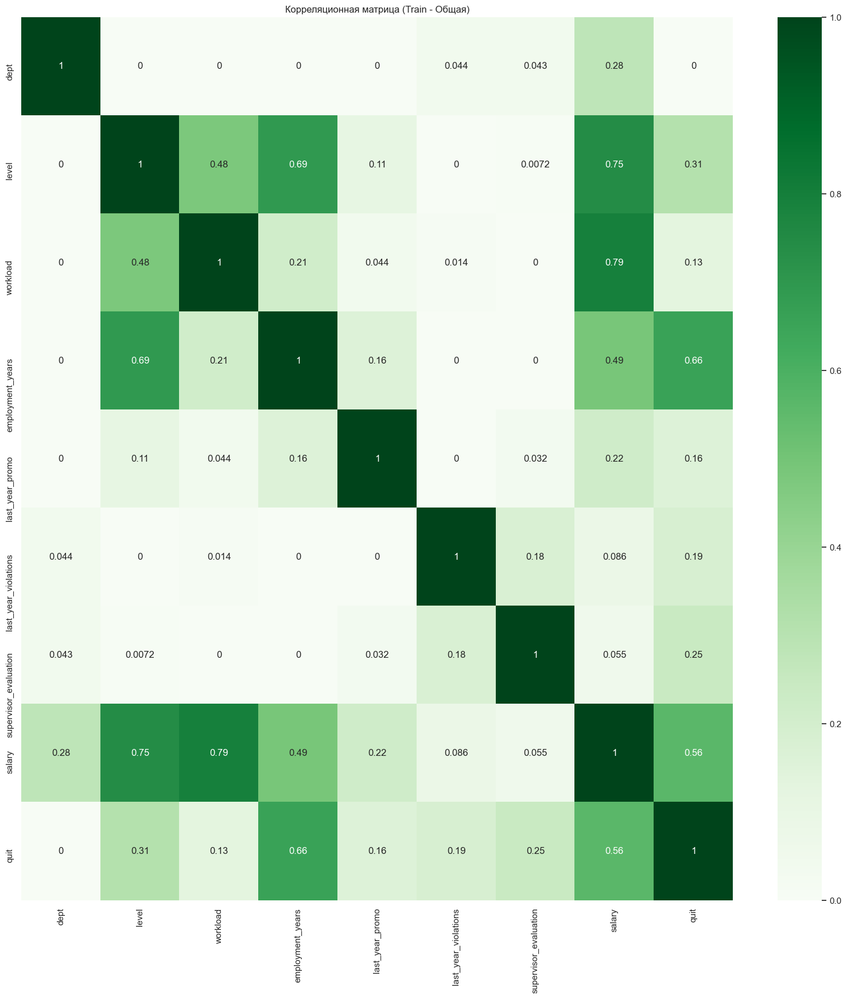

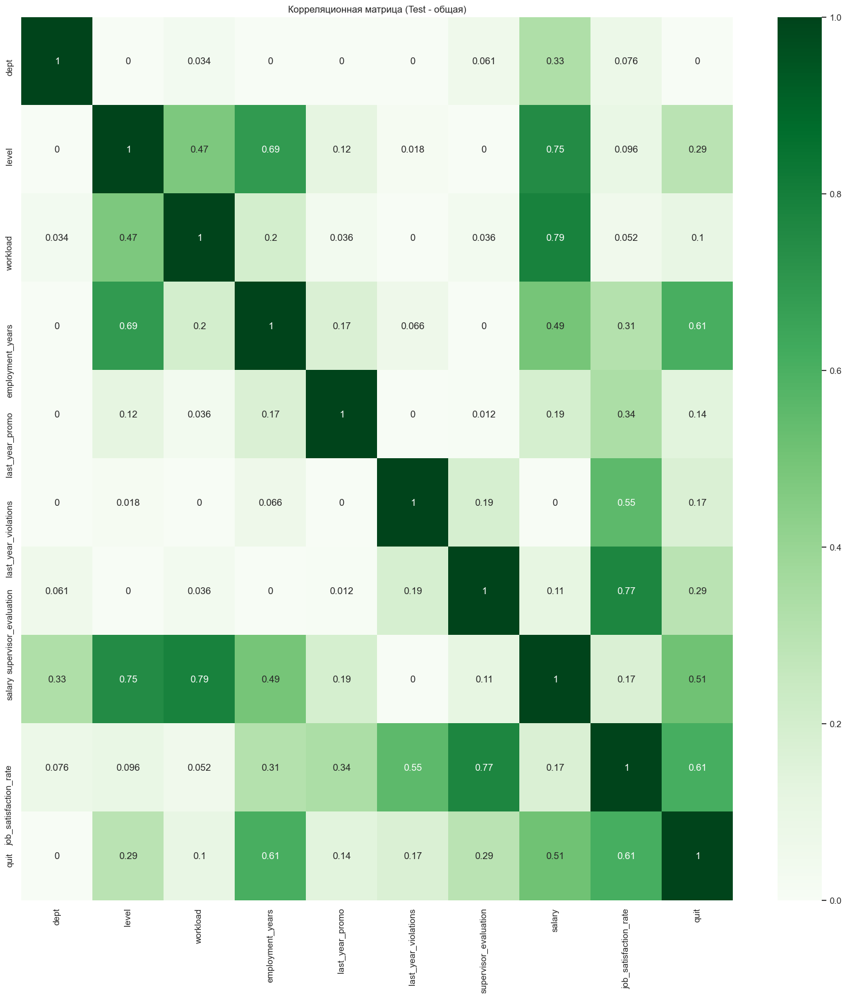

In [160]:
# построим корреляционную матрицу по обучающей выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(train_quit
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Общая)")
plt.show()

# построим корреляционную матрицу по тестовой выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(features_quit_satisfaction
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Test - общая)")
plt.show()

**Влияние признаков на целевой**

- `employment_years` (0.61): С увеличением стажа работы вероятность увольнения увеличивается. Это может указывать на то, что сотрудники с большим опытом чаще принимают решение об уходе, возможно, из-за поиска новых возможностей.
- `job_satisfaction_rate` (0.61): Более высокая удовлетворенность работой связана с повышенной вероятностью увольнения. Сотрудники, которые чувствуют себя не удовлетворенными, могут активнее искать другие варианты.
- `salary` (0.51): Чем ниже зарплата, тем выше вероятность ухода. Это может сигнализировать о том, что сотрудники, недовольные своим доходом, могут быть более склонны к поиску лучших предложений.
- `supervisor_evaluation` (0.29): Положительная оценка со стороны руководства также может способствовать увольнению, возможно, из-за повышения амбиций или ожиданий сотрудников.
- `level` (0.29): Уровень позиции также имеет небольшое влияние. Мы видели ранее, что junior чаще увольняются, чем другие сотрудники.
- `last_year_promos` (0.14) и `last_year_violations` (0.17): Небольшие значения указывают, что наличие повышений или нарушений в прошлом году также могут влиять на решение об увольнении.
- `workload` (0.1): Нагрузка на работе имеет незначительное влияние.
- `dept` (0.0): Отсутствие влияния данного признака может означать, что отдел или команда не играют значительной роли в решении об увольнении.

**Мультиколлинеарность:**

Входящих признаков с очень высокой взаимной корреляцией (>0.9) нету. Удалять признаки не будем.

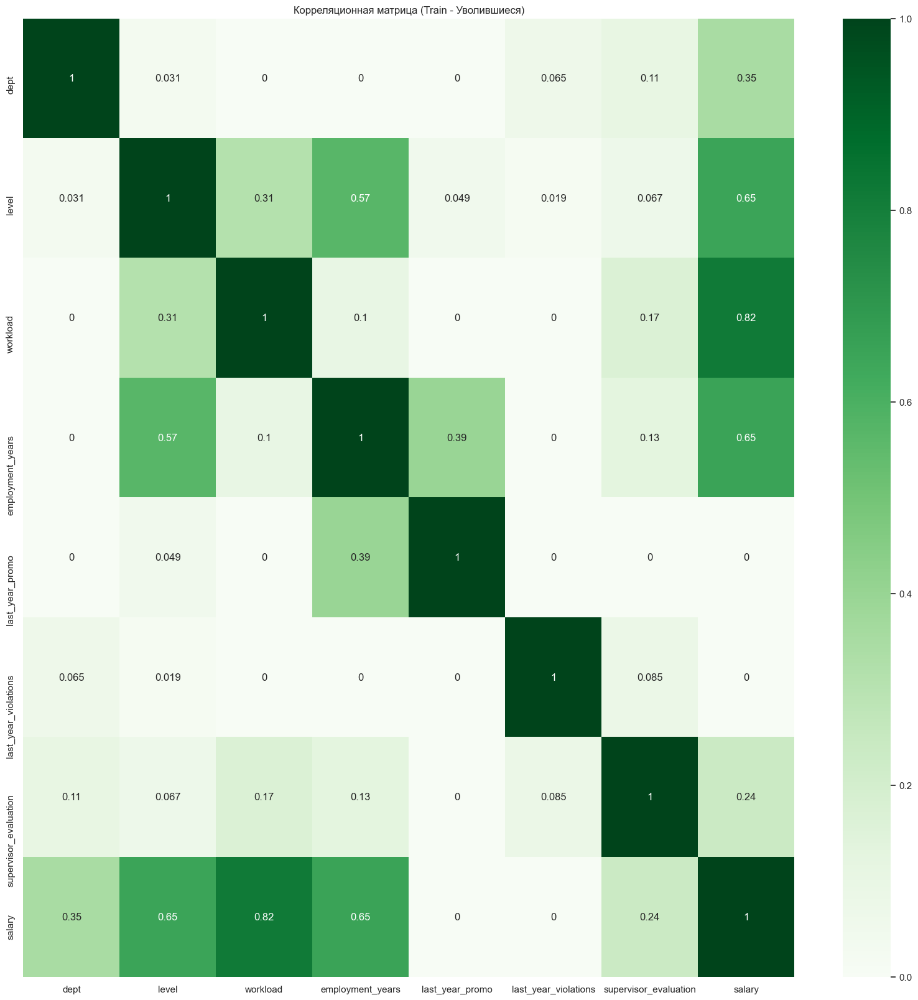

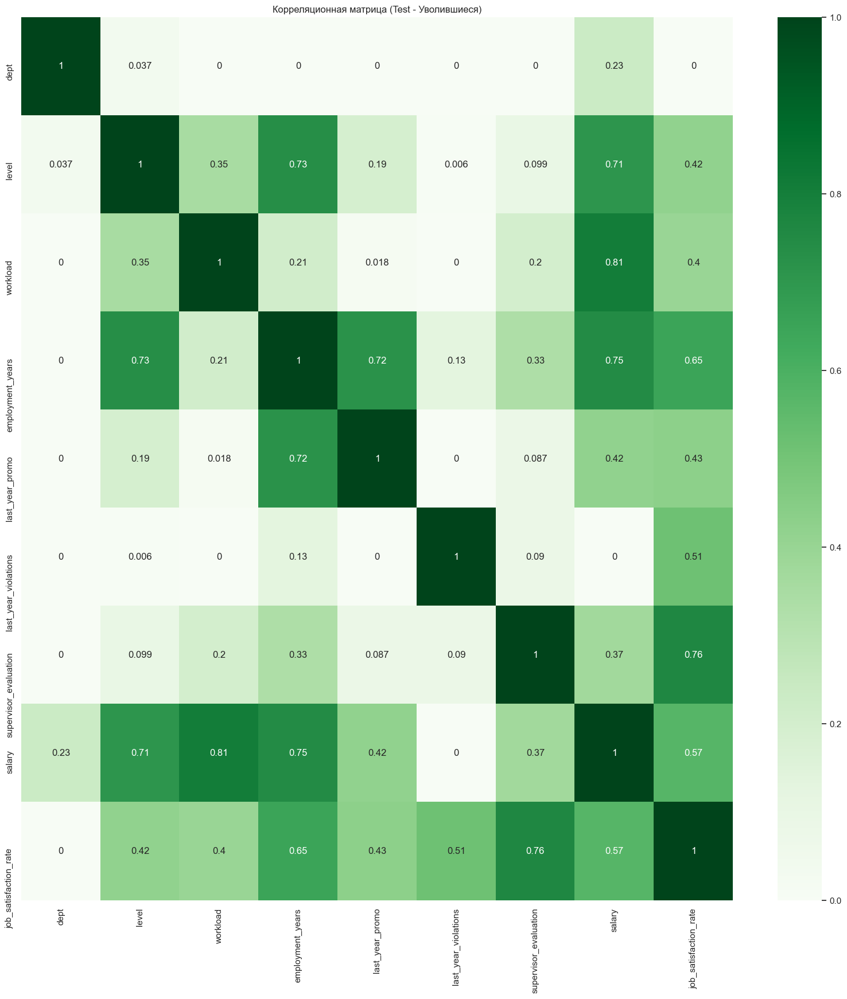

In [161]:
# построим корреляционную матрицу только по уволившимся сотрудникам

# построим корреляционную матрицу по обучающей выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(train_quit.query('quit == "yes"')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Уволившиеся)")
plt.show()

# построим корреляционную матрицу по тестовой выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(features_quit_satisfaction.query('quit == "yes"')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Test - Уволившиеся)")
plt.show()

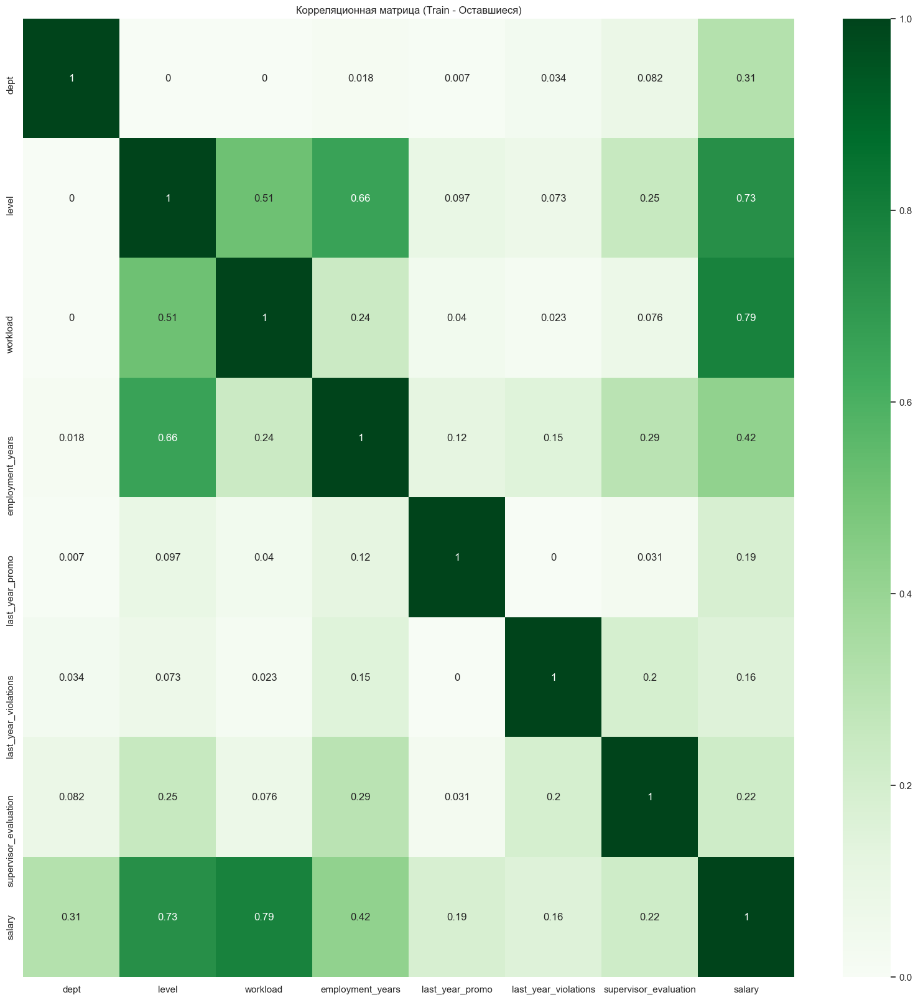

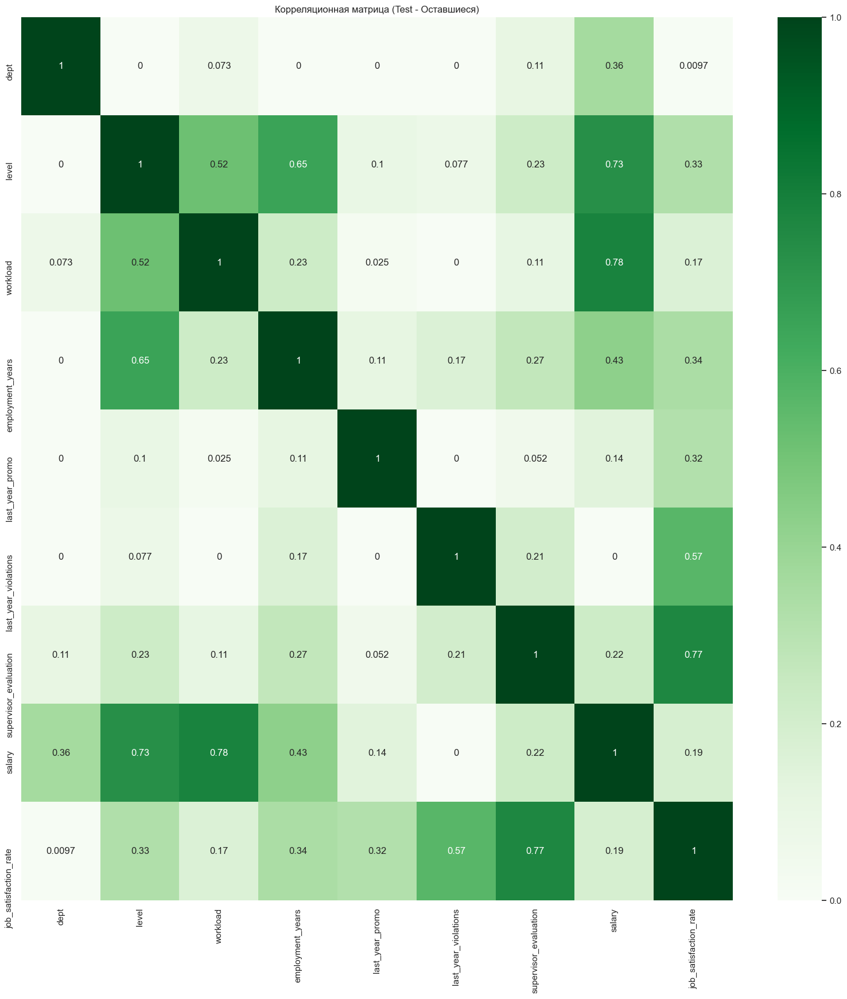

In [162]:
# построим корреляционную матрицу только по оставшимся сотрудникам
# построим корреляционную матрицу по обучающей выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(train_quit.query('quit == "no"')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Train - Оставшиеся)")
plt.show()

# построим корреляционную матрицу по тестовой выборке
plt.figure(figsize=(20, 20)) 
sns.heatmap(features_quit_satisfaction.query('quit == "no"')
            .phik_matrix(interval_cols=interval_columns),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица (Test - Оставшиеся)")
plt.show()

В целом корреляции признаков схожи, но у уволившихся сотрудников сильней корреляция промоушена количества отработанных лет. Ранее мы видели что в основном это сотрудники проработавшие 1-2 года, и они не получили промоушен. Понятно, почему корреляция высокая.

### Обучение моделей

#### Добавление job_satisfaction_rate в выборки

In [163]:
train_quit

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
id,,,,,,,,,
100222,sales,junior,medium,3,no,no,2,20400,yes
100459,purchasing,junior,medium,3,no,no,3,21600,yes
100469,marketing,junior,medium,1,no,no,4,28800,no
100601,technology,middle,high,4,no,no,4,68400,no
100858,sales,junior,medium,2,no,no,4,25200,yes
...,...,...,...,...,...,...,...,...,...
998517,purchasing,middle,low,5,no,no,3,19200,no
999003,hr,middle,low,3,no,no,2,24000,yes
999158,purchasing,junior,medium,1,no,yes,1,21600,yes


In [164]:
# сделаем предсказания для тренировочной выборки с использование лучшей модели из первой задачи
train_satisfaction_predict= best_model_safisfaction_rate.predict(train_quit.drop('quit', axis=1))
train_satisfaction_predict

array([0.34571429, 0.31166667, 0.65444444, ..., 0.082     , 0.76428571,
       0.285     ])

In [165]:
# сделаем предсказания для тренировочной выборки с использование лучшей модели из первой задачи
test_satisfaction_predict= best_model_safisfaction_rate.predict(test_features_quit)
test_satisfaction_predict

array([0.82      , 0.852     , 0.806     , ..., 0.48888889, 0.46428571,
       0.27555556])

In [166]:
train_quit['job_satisfaction_rate'] = train_satisfaction_predict
train_quit.head()

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit,job_satisfaction_rate
id,,,,,,,,,,
100222,sales,junior,medium,3,no,no,2,20400,yes,0.345714
100459,purchasing,junior,medium,3,no,no,3,21600,yes,0.311667
100469,marketing,junior,medium,1,no,no,4,28800,no,0.654444
100601,technology,middle,high,4,no,no,4,68400,no,0.670000
100858,sales,junior,medium,2,no,no,4,25200,yes,0.837273


In [167]:
test_features_quit['job_satisfaction_rate'] = test_satisfaction_predict
test_features_quit.head()

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
id,,,,,,,,,
100298,hr,junior,low,2,no,no,4,19200,0.820
100480,marketing,junior,low,4,no,no,4,16800,0.852
100503,purchasing,middle,high,5,no,no,4,55200,0.806
100610,sales,middle,medium,5,no,no,4,43200,0.814
100692,sales,middle,high,6,no,no,4,48000,0.696


In [168]:
test_target_quit.head()

,quit
id,
100298,no
100480,no
100503,no
100610,no
100692,no


In [169]:
train_quit.isna().sum()

dept                     0
level                    0
workload                 0
employment_years         0
last_year_promo          0
last_year_violations     0
supervisor_evaluation    0
salary                   0
quit                     0
job_satisfaction_rate    0
dtype: int64

In [170]:
test_features_quit.isna().sum()

dept                     3
level                    1
workload                 1
employment_years         0
last_year_promo          0
last_year_violations     0
supervisor_evaluation    0
salary                   0
job_satisfaction_rate    0
dtype: int64

#### Описание признаков и выбор метрики

**Целевая переменная:** `quit`

**Категориальные признаки (неранговые):**
- `dept`: ['hr', 'marketing', 'purchasing', 'sales', 'technology']
- `last_year_promo`: ['no', 'yes']
- `last_year_violations`: ['no', 'yes']

**Категориальные признаки (ранговые):**
- `level`: ['junior', 'middle', 'sinior']
- `workload`: ['low', 'medium', 'high']

**Количественные признаки:**
- `employment_years`,
- `supervisor_evaluation`,
- `salary`
- `job_satisfaction_rate`

**Выбор метрики**

По условиям задачи для выбора лучшей модели должна использоваться метрика — ROC-AUC.

#### Подготовка данных

In [171]:
# посмотрим дубликаты
train_quit.duplicated().sum()

1413

In [172]:
# Удалим дубликаты из обучающей выборки, для избежания утечки при кросс-валидации.
train_quit = train_quit.drop_duplicates()

In [173]:
# посмотрим дубликаты
train_quit.duplicated().sum()

0

In [174]:
# Разделим тренировочный набор на X_train и y_train
X_train_quit = train_quit.drop('quit', axis=1)
y_train_quit = train_quit['quit']

# Для удобства сохраним тестовые данные в новые переменные
X_test_quit = test_features_quit.copy()
y_test_quit = test_target_quit.copy()

y_test_quit = pd.Series(
    test_target_quit['quit'].values,
    index=test_target_quit.index,
    name='quit') 

In [175]:
for df in [X_train_quit, y_train_quit, X_test_quit, y_test_quit]:
    display(df.head())

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
id,,,,,,,,,
100222,sales,junior,medium,3,no,no,2,20400,0.345714
100459,purchasing,junior,medium,3,no,no,3,21600,0.311667
100469,marketing,junior,medium,1,no,no,4,28800,0.654444
100601,technology,middle,high,4,no,no,4,68400,0.670000
100858,sales,junior,medium,2,no,no,4,25200,0.837273


id
100222    yes
100459    yes
100469     no
100601     no
100858    yes
Name: quit, dtype: object

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
id,,,,,,,,,
100298,hr,junior,low,2,no,no,4,19200,0.820
100480,marketing,junior,low,4,no,no,4,16800,0.852
100503,purchasing,middle,high,5,no,no,4,55200,0.806
100610,sales,middle,medium,5,no,no,4,43200,0.814
100692,sales,middle,high,6,no,no,4,48000,0.696


id
100298    no
100480    no
100503    no
100610    no
100692    no
Name: quit, dtype: object

Осталось закодировать целевой признак.

In [176]:
# Закодируем целевой признак
label_encoder = LabelEncoder()

# Зададим порядок кодирования, чтобы "yes" закодировалось 1.
y_label_classes = ['no', 'yes']

label_encoder.fit(y_label_classes)

y_train_quit = label_encoder.transform(y_train_quit)
y_test_quit = label_encoder.transform(y_test_quit)

In [177]:
# проверим кодировку
print(y_train_quit[:3,])
print(y_test_quit[:3,])

[1 1 0]
[0 0 0]


In [178]:
# выведем названия закодированных классов [0, 1] соответственно
label_encoder.classes_

array(['no', 'yes'], dtype='<U3')

Теперь данные готовы к дальнейшему использованию в моделях.

#### Обновление пайплайна

In [179]:
# Создадим списки с названиями признаков
target_job_quit =['quit']

# не изменились
ohe_columns = [
    'dept',
    'last_year_promo',
    'last_year_violations'
]

# не изменились
ord_columns = [
    'level',
    'workload'
]

# добавился Job_satisfaction_rate
num_columns_quit = [
    'employment_years',
    'supervisor_evaluation',
    'salary',
    'job_satisfaction_rate'
]

In [180]:
# обновим Preprocessor, чтобы он использовал правильные числовые колонки
# Пайплайн предобработки
data_preprocessor_quit = ColumnTransformer(
    [   ('ohe', ohe_pipe, ohe_columns),
        ('ord', ord_pipe, ord_columns),
        ('num', StandardScaler(), num_columns_quit)
    ], 
    remainder='passthrough'
)

In [181]:
# обновим итоговый пайплайн
pipe_final_quit = ImbPipeline([
    ('preprocessor', data_preprocessor_quit),
    ('sampler', 'passthrough'),
    ('selector', 'passthrough'),
    ('poly', 'passthrough'), 
    ('models', LogisticRegression(random_state=RANDOM_STATE)) # заменил на базовую модель логистической регрессии
])

#### Поиск лучшей модели

##### Базовые модели без перебора гиперпараметров

Посмотрим как покажет себя базовые классификационные модели без перебора гиперпараметров, чтобы использовать их за отправную точку при дальнейшей настройке.

In [182]:
# списки для хранения данных об обученных моделях
pipeline_quit_names = []
pipeline_quit = []
train_roc_auc_cv_score = []

In [183]:
# чтобы классификационные модели работали корректно, оставим перебор скейлеров
param_grid_base_quit = [
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [LogisticRegression(random_state=RANDOM_STATE)],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [KNeighborsClassifier()],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [SVC(random_state=RANDOM_STATE, probability=True)],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    }
]

In [184]:
%%time

grid_search_base_quit, results_base_quit = find_best_model_grid(
    pipe_final_quit,
    param_grid_base_quit,
    X_train_quit,
    y_train_quit,
    scoring='roc_auc'
)
print()

Лучшая модель и её параметры
Лучшая метрика на кросс-валидации для лучшей модели: 0.9021327410917713


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', 'passthrough'), ('selector', 'passthrough'),
                ('poly', 'passthrough'),
                ('models', LogisticRegression(random_state=42))])


CPU times: total: 297 ms
Wall time: 4.71 s


In [185]:
# посмотрим на результаты, которые показали модели
results_base_quit.sort_values('mean_test_score', ascending=False)[['param_models', 'param_preprocessor__num', 'params', 'mean_test_score']]

,param_models,param_preprocessor__num,params,mean_test_score
3,LogisticRegression(random_state=42),StandardScaler(),"{'models': LogisticRegression(random_state=42), 'preprocessor__num': StandardScaler()}",0.902133
4,LogisticRegression(random_state=42),MinMaxScaler(),"{'models': LogisticRegression(random_state=42), 'preprocessor__num': MinMaxScaler()}",0.900273
9,"SVC(probability=True, random_state=42)",StandardScaler(),"{'models': SVC(probability=True, random_state=42), 'preprocessor__num': StandardScaler()}",0.899255
10,"SVC(probability=True, random_state=42)",MinMaxScaler(),"{'models': SVC(probability=True, random_state=42), 'preprocessor__num': MinMaxScaler()}",0.898262
6,KNeighborsClassifier(),StandardScaler(),"{'models': KNeighborsClassifier(), 'preprocessor__num': StandardScaler()}",0.884463
5,LogisticRegression(random_state=42),passthrough,"{'models': LogisticRegression(random_state=42), 'preprocessor__num': 'passthrough'}",0.881147
8,KNeighborsClassifier(),passthrough,"{'models': KNeighborsClassifier(), 'preprocessor__num': 'passthrough'}",0.875721
7,KNeighborsClassifier(),MinMaxScaler(),"{'models': KNeighborsClassifier(), 'preprocessor__num': MinMaxScaler()}",0.874033
1,DecisionTreeClassifier(random_state=42),MinMaxScaler(),"{'models': DecisionTreeClassifier(random_state=42), 'preprocessor__num': MinMaxScaler()}",0.771615
0,DecisionTreeClassifier(random_state=42),StandardScaler(),"{'models': DecisionTreeClassifier(random_state=42), 'preprocessor__num': StandardScaler()}",0.771603


In [186]:
# запишем результаты в общую таблицу
all_results_quit = results_base_quit.copy().sort_values(by='mean_test_score', ascending=False)

In [187]:
# Сохраним результаты в соответствующие списки
pipeline_quit_names.append('grid_search_base_quit.best_estimator_')
pipeline_quit.append(grid_search_base_quit.best_estimator_)
train_roc_auc_cv_score.append(grid_search_base_quit.best_score_)

В целом, почти все базовые модели показали результат **AUC>=0.87**, кроде дерева решений. Лучше всех пока что справились LogisticRegression и SVC.

Посмотрим, можно ли улучшить модели подбирая оптимальные значения гиперпараметров.

##### Подбор моделей и гиперпараметров, семплирование

In [188]:
param_grid_optuna_quit = [
    {
        'models': distributions.CategoricalDistribution([DecisionTreeClassifier(random_state=RANDOM_STATE)]),
        'models__max_depth': distributions.IntDistribution(1, 30),
        'models__min_samples_split': distributions.IntDistribution(2, 30),
        'models__min_samples_leaf': distributions.IntDistribution(1, 30),
        'sampler': distributions.CategoricalDistribution([SMOTETomek(random_state=RANDOM_STATE, n_jobs=-1), 'passthrough']),
        # отсутствие скейлера для деревьев не критично, оставим passthrough как опцию
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    },
    {
        'models': distributions.CategoricalDistribution([KNeighborsClassifier()]),
        'models__n_neighbors': distributions.IntDistribution(1, 300),
        'sampler': distributions.CategoricalDistribution([SMOTETomek(random_state=RANDOM_STATE, n_jobs=-1), 'passthrough']),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler()])
    },
    {
        'models': distributions.CategoricalDistribution([LogisticRegression(
            random_state=RANDOM_STATE, 
            solver='liblinear', 
            penalty='l1'
        )]),
        'models__C': distributions.FloatDistribution(0.001, 100),
        'sampler': distributions.CategoricalDistribution([SMOTETomek(random_state=RANDOM_STATE, n_jobs=-1), 'passthrough']),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler()])
    },
    {
        'models': distributions.CategoricalDistribution([SVC(random_state=RANDOM_STATE, probability=True)]),
        'models__C': distributions.FloatDistribution(0.001, 100),
        'models__gamma': distributions.FloatDistribution(0.001, 1),
        'sampler': distributions.CategoricalDistribution([SMOTETomek(random_state=RANDOM_STATE, n_jobs=-1), 'passthrough']),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler()])
    }
]

In [189]:
%%time

best_optuna_model_quit, best_score_cv_quit, optuna_models_dict_quit, best_scores_dict_quit, results_optuna_quit = \
find_best_model_optuna(
    pipe_final_quit,
    param_grid_optuna_quit,
    X_train_quit,
    y_train_quit,
    scoring='roc_auc',
    n_trials=20
)
print()

Лучшая модель: DecisionTreeClassifier с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.9086658815490305


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', SMOTETomek(n_jobs=-1, random_state=42)),
                ('selector', 'passthrough'), ('poly', 'passthrough'),
                ('models',
                 DecisionTreeClassifier(max_depth=20, min_samples_leaf=30,
                                        min_samples_split=18,
                                        random_state=42))])

Лучшая модель: KNeighborsClassifier с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.9100659143150697


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', 'passthrough'), ('selector', 'passthrough'),
                ('poly', 'passthrough'),
                ('models', KNeighborsClassifier(n_neighbors=43))])

Лучшая модель: LogisticRegression с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.9028126415181694


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', 'passthrough'), ('selector', 'passthrough'),
                ('poly', 'passthrough'),
                ('models',
                 LogisticRegression(C=97.73039534038152, penalty='l1',
                                    random_state=42, solver='liblinear'))])

Лучшая модель: SVC с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.912004486474095


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', SMOTETomek(n_jobs=-1, random_state=42)),
                ('selector', 'passthrough'), ('poly', 'passthrough'),
                ('models',
                 SVC(C=62.964505501679, gamma=0.02795336243942883,
                     probability=True, random_state=42))])


CPU times: total: 2min 2s
Wall time: 1min 56s


In [190]:
all_results_quit = pd.concat([all_results_quit, results_optuna_quit]).sort_values(by='mean_test_score', ascending=False)

In [191]:
print(all_results_quit.shape)
all_results_quit.head()

(92, 22)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_sampler,param_models__n_neighbors,param_models__C,param_models__gamma
77,1.107825,0.081935,0.067824,0.009201,"SVC(C=65.98160009431204, gamma=0.12481588219531656, probability=True,\n random_state=42)",MinMaxScaler(),NaN,0.929739,0.920686,0.918067,0.902919,0.888611,0.912004,0.014536,NaN,NaN,NaN,NaN,"SMOTETomek(n_jobs=-1, random_state=42)",NaN,62.964506,0.027953
38,0.031807,0.004935,0.038537,0.004511,KNeighborsClassifier(n_neighbors=34),StandardScaler(),NaN,0.923970,0.923625,0.914953,0.899379,0.888403,0.910066,0.014032,NaN,NaN,NaN,NaN,passthrough,43.0,NaN,NaN
37,0.034309,0.013834,0.033710,0.002469,KNeighborsClassifier(n_neighbors=34),StandardScaler(),NaN,0.921544,0.921208,0.917039,0.900437,0.887553,0.909556,0.013437,NaN,NaN,NaN,NaN,passthrough,54.0,NaN,NaN
35,0.032120,0.003527,0.045909,0.016043,KNeighborsClassifier(n_neighbors=34),StandardScaler(),NaN,0.920479,0.921287,0.916792,0.901713,0.887118,0.909478,0.013223,NaN,NaN,NaN,NaN,passthrough,55.0,NaN,NaN
34,0.032475,0.003730,0.040293,0.004398,KNeighborsClassifier(n_neighbors=34),StandardScaler(),NaN,0.920419,0.918693,0.917662,0.903097,0.885595,0.909093,0.013281,NaN,NaN,NaN,NaN,passthrough,59.0,NaN,NaN


In [192]:
for key, model in optuna_models_dict_quit.items():
    # Сохраним результаты в соответствующие списки
    pipeline_quit_names.append(f"optuna_models_dict_quit['{key}']")  # Сохраняем имя модели
    pipeline_quit.append(model)       # Сохраняем саму модель

    # Получаем SMAPE_CV, не выполняя повторную кросс-валидацию
    train_roc_auc_cv_score.append(best_scores_dict_quit[key])  # Используем сохраненный результа

##### Селектор и полиномизатор признаков

In [193]:
# выведем количество признаков после обработки препроцессором
# чтобы понимать максимальное число признаков для перебора в селекторе
grid_search_base_quit.best_estimator_.named_steps['preprocessor'].transform(X_train_quit).shape[1]

12

Для отбора признаков будем использовать лучшие версии моделей каждого типа, найденные на предыдущем шаге. Они сохранены в словаре: `optuna_models_dict_quit`

In [194]:
optuna_models_dict_quit.keys()

dict_keys(['DecisionTreeClassifier', 'KNeighborsClassifier', 'LogisticRegression', 'SVC'])

In [195]:
param_grid_optuna_selector_poly_quit = [
    {
        'models': distributions.CategoricalDistribution([optuna_models_dict_quit['DecisionTreeClassifier'].named_steps['models']]),
        'sampler': distributions.CategoricalDistribution([optuna_models_dict_quit['DecisionTreeClassifier'].named_steps['sampler']]),
        'preprocessor': distributions.CategoricalDistribution([optuna_models_dict_quit['DecisionTreeClassifier'].named_steps['preprocessor']]),
        'selector': distributions.CategoricalDistribution([SelectKBest(score_func=f_classif), SelectKBest(score_func=mutual_info_classif)]),
        'selector__k': distributions.IntDistribution(1, 12),
        'poly': distributions.CategoricalDistribution([PolynomialFeatures(include_bias=False)]),
        'poly__degree': distributions.IntDistribution(1, 2),  # Степень полинома
        'poly__interaction_only': distributions.CategoricalDistribution([True, False]),  # Взаимодействия
        'poly__include_bias': distributions.CategoricalDistribution([True, False]),  # Смещение
    },
    {
        'models': distributions.CategoricalDistribution([optuna_models_dict_quit['KNeighborsClassifier'].named_steps['models']]),
        'sampler': distributions.CategoricalDistribution([optuna_models_dict_quit['KNeighborsClassifier'].named_steps['sampler']]),
        'preprocessor': distributions.CategoricalDistribution([optuna_models_dict_quit['KNeighborsClassifier'].named_steps['preprocessor']]),
        'selector': distributions.CategoricalDistribution([SelectKBest(score_func=f_classif), SelectKBest(score_func=mutual_info_classif)]),
        'selector__k': distributions.IntDistribution(1, 12),
        'poly': distributions.CategoricalDistribution([PolynomialFeatures(include_bias=False)]),
        'poly__degree': distributions.IntDistribution(1, 2),  # Степень полинома
        'poly__interaction_only': distributions.CategoricalDistribution([True, False]),  # Взаимодействия
        'poly__include_bias': distributions.CategoricalDistribution([True, False]),  # Смещение
    },
    {
        'models': distributions.CategoricalDistribution([optuna_models_dict_quit['LogisticRegression'].named_steps['models']]),
        'sampler': distributions.CategoricalDistribution([optuna_models_dict_quit['LogisticRegression'].named_steps['sampler']]),
        'preprocessor': distributions.CategoricalDistribution([optuna_models_dict_quit['LogisticRegression'].named_steps['preprocessor']]),
        'selector': distributions.CategoricalDistribution([SelectKBest(score_func=f_classif), SelectKBest(score_func=mutual_info_classif)]),
        'selector__k': distributions.IntDistribution(1, 12),
        'poly': distributions.CategoricalDistribution([PolynomialFeatures(include_bias=False)]),
        'poly__degree': distributions.IntDistribution(1, 2),  # Степень полинома
        'poly__interaction_only': distributions.CategoricalDistribution([True, False]),  # Взаимодействия
        'poly__include_bias': distributions.CategoricalDistribution([True, False]),  # Смещение
    },
    {
        'models': distributions.CategoricalDistribution([optuna_models_dict_quit['SVC'].named_steps['models']]),
        'sampler': distributions.CategoricalDistribution([optuna_models_dict_quit['SVC'].named_steps['sampler']]),
        'preprocessor': distributions.CategoricalDistribution([optuna_models_dict_quit['SVC'].named_steps['preprocessor']]),
        'selector': distributions.CategoricalDistribution([SelectKBest(score_func=f_classif), SelectKBest(score_func=mutual_info_classif)]),
        'selector__k': distributions.IntDistribution(1, 12),
        'poly': distributions.CategoricalDistribution([PolynomialFeatures(include_bias=False)]),
        'poly__degree': distributions.IntDistribution(1, 2),  # Степень полинома
        'poly__interaction_only': distributions.CategoricalDistribution([True, False]),  # Взаимодействия
        'poly__include_bias': distributions.CategoricalDistribution([True, False]),  # Смещение
    }
]

In [196]:
%%time

best_optuna_model_selector_poly_quit, best_score_cv_selector_poly_quit, optuna_models_dict_selector_poly_quit, best_scores_dict_poly_quit, results_optuna_selector_poly_quit = \
find_best_model_optuna(
    pipe_final_quit,
    param_grid_optuna_selector_poly_quit,
    X_train_quit,
    y_train_quit,
    scoring='roc_auc',
    n_trials=20
)
print()

Лучшая модель: DecisionTreeClassifier с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.9104684123014299


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', SMOTETomek(n_jobs=-1, random_state=42)),
                ('selector',
                 SelectKBest(score_func=<function mutual_info_classif at 0x0000011E562DA790>)),
                ('poly', PolynomialFeatures(degree=1)),
                ('models',
                 DecisionTreeClassifier(max_depth=20, min_samples_leaf=30,
                                        min_samples_split=18,
                                        random_state=42))])

Лучшая модель: KNeighborsClassifier с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.9152682844668634


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', 'passthrough'), ('selector', SelectKBest(k=9)),
                ('poly', PolynomialFeatures(degree=1)),
                ('models', KNeighborsClassifier(n_neighbors=43))])

Лучшая модель: LogisticRegression с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.9159912886895535


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', 'passthrough'), ('selector', SelectKBest(k=8)),
                ('poly', PolynomialFeatures(include_bias=False)),
                ('models',
                 LogisticRegression(C=97.73039534038152, penalty='l1',
                                    random_state=42, solver='liblinear'))])

Лучшая модель: SVC с параметрами.
Лучшая метрика на кросс-валидации для лучшей модели: 0.9157430087788662


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', SMOTETomek(n_jobs=-1, random_state=42)),
                ('selector', SelectKBest(k=8)),
                ('poly',
                 PolynomialFeatures(degree=1, include_bias=False,
                                    interaction_only=True)),
                ('models',
                 SVC(C=62.964505501679, gamma=0.02795336243942883,
                     probability=True, random_state=42))])


CPU times: total: 3min 41s
Wall time: 3min 26s


In [197]:
all_results_quit = pd.concat([all_results_quit, results_optuna_selector_poly_quit]).sort_values(by='mean_test_score', ascending=False)

In [198]:
print(all_results_quit.shape)
all_results_quit.head()

(172, 29)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_sampler,param_models__n_neighbors,param_models__C,param_models__gamma,param_preprocessor,param_selector,param_selector__k,param_poly,param_poly__degree,param_poly__interaction_only,param_poly__include_bias
54,0.571392,0.130477,0.012968,0.001260,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False
50,0.552530,0.120045,0.012760,0.000694,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False
51,0.596472,0.136217,0.015146,0.002480,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False
52,0.585378,0.136858,0.013268,0.000972,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='l

In [199]:
for key, model in optuna_models_dict_selector_poly_quit.items():
    # Сохраним результаты в соответствующие списки
    pipeline_quit_names.append(f"optuna_models_dict_selector_poly_quit['{key}']")  # Сохраняем имя модели
    pipeline_quit.append(model)       # Сохраняем саму модель

    # Получаем SMAPE_CV, не выполняя повторную кросс-валидацию
    train_roc_auc_cv_score.append(best_scores_dict_poly_quit[key])  # Используем сохраненный результа

##### Dummy-модели

Для сравнения проверим, как поведут себя различные примитивные модели и какие предсказания они дадут. Выберем из них лучшую и запишем в общую таблицу для сравнения.

In [200]:
param_grid_dummy_quit = [
    {
        'models': [DummyClassifier(random_state=RANDOM_STATE)],
        'models__strategy': ['most_frequent', 'prior', 'stratified', 'uniform'],
    },
    {
        'models': [DummyClassifier(random_state=RANDOM_STATE, strategy='constant')],
        'models__constant': [0]
    }
]

In [201]:
%%time

grid_search_base_dummy_quit, results_base_dummy_quit = find_best_model_grid(
    pipe_final_quit,
    param_grid_dummy_quit,
    X_train_quit,
    y_train_quit,
    cv=None,
    scoring='roc_auc'
)
print()

Лучшая модель и её параметры
Лучшая метрика для лучшей модели: 0.5


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', StandardScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', 'passthrough'), ('selector', 'passthrough'),
                ('poly', 'passthrough'),
                ('models',
                 DummyClassifier(random_state=42, strategy='most_frequent'))])


CPU times: total: 281 ms
Wall time: 2.41 s


In [202]:
all_results_quit = pd.concat([all_results_quit, results_base_dummy_quit]).sort_values(by='mean_test_score', ascending=False)

In [203]:
print(all_results_quit.shape)
all_results_quit.head()

(177, 31)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_sampler,param_models__n_neighbors,param_models__C,param_models__gamma,param_preprocessor,param_selector,param_selector__k,param_poly,param_poly__degree,param_poly__interaction_only,param_poly__include_bias,param_models__strategy,param_models__constant
54,0.571392,0.130477,0.012968,0.001260,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False,NaN,NaN
51,0.596472,0.136217,0.015146,0.002480,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False,NaN,NaN
52,0.585378,0.136858,0.013268,0.000972,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False,NaN,NaN
56,0.594571,0.123909,0.014092,0.002182,"LogisticRegr

In [204]:
# Сохраним результаты в соответствующие списки
pipeline_quit_names.append('grid_search_base_dummy_quit.best_estimator_')
pipeline_quit.append(grid_search_base_dummy_quit.best_estimator_)
train_roc_auc_cv_score.append(grid_search_base_dummy_quit.best_score_)

##### Лучшая модель

In [205]:
aggregated_stats_quit = pd.DataFrame({
    'Модель': [pipe.named_steps['models'] for pipe in pipeline_quit],
    'Обученный пайплайн': pipeline_quit,
    'Пайплай хранится в переменной': pipeline_quit_names,
    'ROC_AUC_CV (тренировочная)': train_roc_auc_cv_score,
})

In [206]:
# Создадим маски для максимума и второго максимума
mask_max = aggregated_stats_quit['ROC_AUC_CV (тренировочная)'] == aggregated_stats_quit['ROC_AUC_CV (тренировочная)'].max()
mask_second_max = aggregated_stats_quit['ROC_AUC_CV (тренировочная)'] == aggregated_stats_quit['ROC_AUC_CV (тренировочная)'].nlargest(2).iloc[-1]

# Функция для применения стилей
def highlight_max_and_second_max(s, mask_max, mask_second_max):
    styles = ['' for _ in range(len(s))]
    if mask_max.any():
        styles[mask_max.argmax()] = 'background-color: green'  # Максимум
    if mask_second_max.any():
        styles[mask_second_max.argmax()] = 'background-color: yellow'  # Второй максимум
    return styles

# Применим стилизацию
aggregated_stats_quit_styled = aggregated_stats_quit.style.apply(
    highlight_max_and_second_max, 
    mask_max=mask_max, 
    mask_second_max=mask_second_max, 
    axis=0
)

# Отобразим стилизованный DataFrame
aggregated_stats_quit_styled

,Модель,Обученный пайплайн,Пайплай хранится в переменной,ROC_AUC_CV (тренировочная)
0,LogisticRegression(random_state=42),"Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... handle_unknown='use_encoded_value', unknown_value=nan)), ('simpleImputer_after_ord', SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', StandardScaler(), ['employment_years', 'supervisor_evaluation', 'salary', 'job_satisfaction_rate'])])), ('sampler', 'passthrough'), ('selector', 'passthrough'), ('poly', 'passthrough'), ('models', LogisticRegression(random_state=42))])",grid_search_base_quit.best_estimator_,0.902133
1,"DecisionTreeClassifier(max_depth=20, min_samples_leaf=30, min_samples_split=18, random_state=42)","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', MinMaxScaler(), ['employment_years', 'supervisor_evaluation', 'salary', 'job_satisfaction_rate'])])), ('sampler', SMOTETomek(n_jobs=-1, random_state=42)), ('selector', 'passthrough'), ('poly', 'passthrough'), ('models', DecisionTreeClassifier(max_depth=20, min_samples_leaf=30, min_samples_split=18, random_state=42))])",optuna_models_dict_quit['DecisionTreeClassifier'],0.908666
2,KNeighborsClassifier(n_neighbors=43),"Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... handle_unknown='use_encoded_value', unknown_value=nan)), ('simpleImputer_after_ord', SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', StandardScaler(), ['employment_years', 'supervisor_evaluation', 'salary', 'job_satisfaction_rate'])])), ('sampler', 'passthrough'), ('selector', 'passthrough'), ('poly', 'passthrough'), ('models', KNeighborsClassifier(n_neighbors=43))])",optuna_models_dict_quit['KNeighborsClassifier'],0.910066
3,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42, solver='liblinear')","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 'last_year_promo', 'last_year_violations']), ('ord', Pipeline(steps=[('simpleImputer_befor... ('simpleImputer_after_ord', SimpleImputer(strategy='most_frequent'))]), ['level', 'workload']), ('num', StandardScaler(), ['employment_years', 'supervisor_evaluation', 'salary', 'job_satisfaction_rate'])])), ('sampler', 'passthrough'), ('selector', 'passthrough'), ('poly', 'passthrough'), ('models', LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42, solver='liblinear'))])",optuna_models_dict_quit['LogisticRegression'],0.902813
4,"SVC(C=62.964505501679, gamma=0.02795336243942883, probability=True, random_state=42)","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]), ['dept', 

Линейная регрессия с полиномизацией признаков (2й степени) показывает лучший результат качества ROC-AUC на кросс-валидации (0.9161), но полиномизации ухудшает интерпретируемость модели.

Второе место занимаем модель классификации SVC, в которой полиномизации признаков фактически не происходит. При этом показатель качества модели SVC (0.9157) практически не отличается от качества лучшей модели логистической регрессии, но такую модели проще интерпретировать.

In [207]:
# запишем лучшую модель в отбельную переменную
best_pipe_quit = optuna_models_dict_selector_poly_quit['SVC']

best_preprocessor_quit = optuna_models_dict_selector_poly_quit['SVC'].named_steps['preprocessor']
best_sampler_quit = optuna_models_dict_selector_poly_quit['SVC'].named_steps['sampler']
best_selector_quit = optuna_models_dict_selector_poly_quit['SVC'].named_steps['selector']
best_poly_quit = optuna_models_dict_selector_poly_quit['SVC'].named_steps['poly']
best_model_quit = optuna_models_dict_selector_poly_quit['SVC'].named_steps['models']

In [208]:
best_pipe_quit

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['dept', 'last_year_promo',
                                                   'last_year_violations']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate'])])),
                ('sampler', SMOTETomek(n_jobs=-1, random_state=42)),
                ('selector', SelectKBest(k=8)),
                ('poly',
                 PolynomialFeatures(degree=1, include_bias=False,
                                    interaction_only=True)),
                ('models',
                 SVC(C=62.964505501679, gamma=0.02795336243942883,
                     probability=True, random_state=42))])

In [209]:
# общее количество проанализированных комбинаций моделей
all_results_quit.shape[0]

177

In [210]:
# Всего было проанализировано 177 вариантов моделей, все попытки и их результаты записаны и хранятся в следующем df
all_results_quit.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_models,param_preprocessor__num,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,param_models__max_depth,param_models__min_samples_split,param_models__min_samples_leaf,param_sampler,param_models__n_neighbors,param_models__C,param_models__gamma,param_preprocessor,param_selector,param_selector__k,param_poly,param_poly__degree,param_poly__interaction_only,param_poly__include_bias,param_models__strategy,param_models__constant
54,0.571392,0.130477,0.012968,0.001260,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False,NaN,NaN
51,0.596472,0.136217,0.015146,0.002480,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False,NaN,NaN
52,0.585378,0.136858,0.013268,0.000972,"LogisticRegression(C=97.73039534038152, penalty='l1', random_state=42,\n solver='liblinear')",NaN,NaN,0.924207,0.930164,0.927728,0.902336,0.895523,0.915991,0.014223,NaN,NaN,NaN,NaN,passthrough,NaN,NaN,NaN,"ColumnTransformer(remainder='passthrough',\n transformers=[('ohe',\n Pipeline(steps=[('simpleImputer_ohe',\n SimpleImputer(strategy='most_frequent')),\n ('ohe',\n OneHotEncoder(drop='first',\n handle_unknown='ignore',\n sparse_output=False))]),\n ['dept', 'last_year_promo',\n 'last_year_violations']),\n ('ord',\n Pipeline(steps=[('simpleImputer_before_ord',\n SimpleImputer(strategy='m...requent')),\n ('ord',\n OrdinalEncoder(categories=[['junior',\n 'middle',\n 'sinior'],\n ['low',\n 'medium',\n 'high']],\n handle_unknown='use_encoded_value',\n unknown_value=nan)),\n ('simpleImputer_after_ord',\n SimpleImputer(strategy='most_frequent'))]),\n ['level', 'workload']),\n ('num', StandardScaler(),\n ['employment_years', 'supervisor_evaluation',\n 'salary', 'job_satisfaction_rate'])])",SelectKBest(k=7),8.0,PolynomialFeatures(include_bias=False),2.0,False,False,NaN,NaN
56,0.594571,0.123909,0.014092,0.002182,"LogisticRegr

#### Качество модели на тестовой выборке

Посмотрим, как покажет себя выбранная модель на тестовой выборке

График ROC-AUC на тестовой выборке


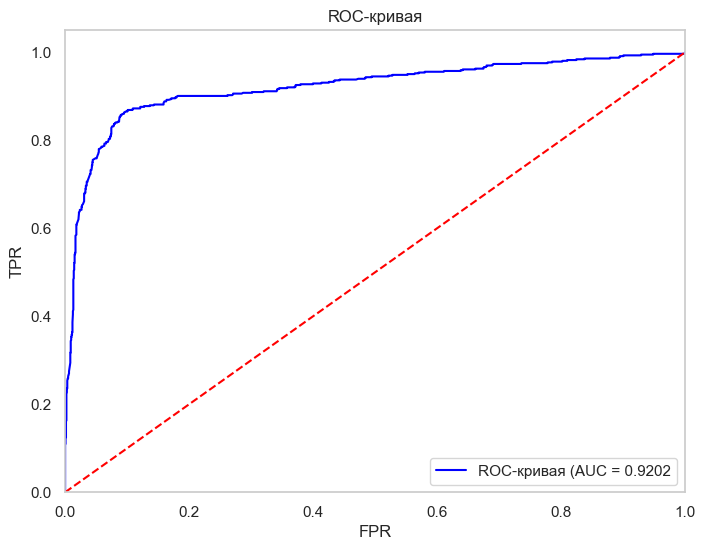

Матрица ошибок на тестовой выборке


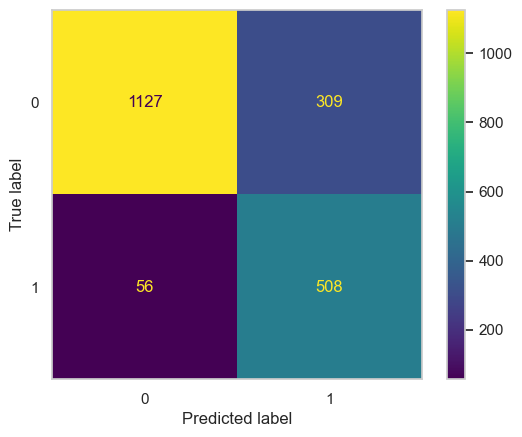

Метрика ROC-AUC на кросс-валидации: 0.9157430087788662
Метрика ROC-AUC на тестовой выборке: 0.9201565864596297
Accuracy: 0.8175
Recall: 0.900709219858156
Precision: 0.6217870257037944


In [211]:
# Предсказания и вероятности
y_test_quit_pred = best_pipe_quit.predict(X_test_quit)
y_test_quit_proba = best_pipe_quit.predict_proba(X_test_quit)[:, 1]

# Построение ROC-кривой и матрицы ошибок
print("График ROC-AUC на тестовой выборке")
plot_roc_curve(y_test_quit, y_test_quit_proba)

print("Матрица ошибок на тестовой выборке")
plot_confusion_matrix(best_pipe_quit, X_test_quit, y_test_quit)

# Метрики
roc_auc_cv_quit = cross_val_score(best_pipe_quit, X_train_quit, y_train_quit, cv=5, scoring="roc_auc").mean()
roc_auc_test_quit = roc_auc_score(y_test_quit, y_test_quit_proba)

print(f'Метрика ROC-AUC на кросс-валидации: {roc_auc_cv_quit}')
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_test_quit}')


# Рассчет метрик
accuracy = accuracy_score(y_test_quit, y_test_quit_pred)
recall = recall_score(y_test_quit, y_test_quit_pred)
precision = precision_score(y_test_quit, y_test_quit_pred)

# Вывод результатов
print(f'Accuracy: {accuracy}')
print(f'Recall: {recall}')
print(f'Precision: {precision}')

Матрица ошибок помогает оценить качество модели классификации, в данном случае — предсказания увольнения сотрудников. Рассмотрим каждую метрику на основе представленной матрицы:

1. **Истинно положительные (TP)**: 508  
   Это количество случаев, когда модель правильно предсказала увольнение сотрудников (предсказано "1" и действительно "1").

2. **Истинно отрицательные (TN)**: 1127  
   Это количество случаев, когда модель правильно предсказала, что сотрудники не будут уволены (предсказано "0" и действительно "0").

3. **Ложно положительные (FP)**: 309  
   Это количество случаев, когда модель ошибочно предсказала увольнение сотрудников (предсказано "1", но действительно "0"). Это может привести к ненужным тревогам или затратам на удержание сотрудников.

4. **Ложно отрицательные (FN)**: 56  
   Это количество случаев, когда модель ошибочно не предсказала увольнение сотрудников (предсказано "0", но действительно "1"). Это может быть критично, так как компания могла бы предпринять меры для удержания этих сотрудников.

Интерпретация метрик качества модели:

1. **ROC-AUC на кросс-валидации**: 0.9157  
   Это значение указывает на то, что модель имеет отличные способности различать классы. ROC-AUC (площадь под кривой) близкая к 1 означает, что модель хорошо различает положительные и отрицательные классы. Значение 0.9157 подтверждает, что модель адекватно справляется с задачей на тренировочной выборке.

2. **ROC-AUC на тестовой выборке**: 0.9202  
   Это значение подтверждает, что модель сохраняет свою эффективность и на тестовой выборке. Оно немного выше, чем на кросс-валидации, что может указывать на хорошую обобщающую способность модели.
   
3. **Accuracy**: 0.8175  
   Это значение означает, что примерно 81.75% всех предсказаний модели верны. Точность хороша, но не всегда отражает качество модели в задачах с несбалансированными классами.

4. **Полнота (Recall)**: 0.9007  
   Это значение указывает на то, что модель правильно идентифицирует 90.07% всех истинных положительных случаев (увольнений). Высокая полнота означает, что модель хорошо справляется с задачей обнаружения увольнений, что важно для проактивного управления персоналом.

5. **Точность (Precision)**: 0.6218  
   Это значение показывает, что из всех предсказанных увольнений только 62.18% действительно являются увольнениями. Умеренная точность может указывать на то, что модель иногда ошибается, предсказывая увольнения, что может привести к ненужным затратам на удержание сотрудников.

Оценим влияние входящих признаков на целевую.

In [212]:
# соберем имена признаков на каждом этапе пайплайна
preprocessor_feature_names = best_pipe_quit.named_steps['preprocessor'].get_feature_names_out()
sampler_feature_names = best_pipe_quit.named_steps['sampler'].get_feature_names_out()
selector_feature_names = best_pipe_quit.named_steps['selector'].get_feature_names_out()
poly_feature_names = best_pipe_quit.named_steps['poly'].get_feature_names_out()

In [213]:
# Создаем DataFrame с именами признаков
feature_names_table = pd.DataFrame({'Feature names': preprocessor_feature_names})
feature_names_table['Sampler names'] = sampler_feature_names
feature_names_table['Selector names'] = feature_names_table['Sampler names'].apply(
    lambda x: x if x in selector_feature_names else None
)

poly_names = []
poly_index = 0

for x in feature_names_table['Selector names'].tolist():
    if x is not None:   
        if poly_index < len(poly_feature_names) and (poly_feature_names[poly_index] == '1'):
            poly_names.append(poly_feature_names[poly_index+1])
            poly_index += 2
        elif poly_index < len(poly_feature_names) and (poly_feature_names[poly_index] != '1'):
            poly_names.append(poly_feature_names[poly_index])
            poly_index += 1  
        else:
            poly_names.append(None)  # Если больше нет значений в poly_feature_names
            poly_index += 1
    else:
        poly_names.append(None)  # Пропускаем пустые строки

# Добавляем Poly names в DataFrame
feature_names_table['Poly names'] = poly_names

# Проверяем, есть ли "1" в списке
if '1' in poly_feature_names:
    # Создаем пустую строку с 1 в колонке Poly names
    empty_row = pd.DataFrame({
        'Feature names': [None],
        'Sampler names': [None],
        'Selector names': [None],
        'Poly names': [1]
    })
    # Добавляем пустую строку к DataFrame
    feature_names_table = pd.concat([feature_names_table, empty_row], ignore_index=True)

# Выводим итоговый DataFrame
display(feature_names_table)

,Feature names,Sampler names,Selector names,Poly names
0,ohe__dept_marketing,x0,None,None
1,ohe__dept_purchasing,x1,None,None
2,ohe__dept_sales,x2,None,None
3,ohe__dept_technology,x3,None,None
4,ohe__last_year_promo_yes,x4,x4,x0
5,ohe__last_year_violations_yes,x5,x5,x1
6,ord__level,x6,x6,x2
7,ord__workload,x7,x7,x3
8,num__employment_years,x8,x8,x4
9,num__supervisor_evaluation,x9,x9,x5


In [214]:
try: 
    # Выведем коэффициенты входящих признаков модели
    sns.set_style('white')

    coefficients = best_model_quit.feature_importances_

    # Предполагается, что coefficients определены ранее
    feature_importance = pd.DataFrame({
        'Feature': best_pipe_quit.named_steps['poly'].get_feature_names_out(),
        'Importance': np.abs(coefficients)
    })

    feature_importance = feature_importance.sort_values('Importance', ascending=True)

    # Создание графика с явным указанием размера
    plt.figure(figsize=(13, 6))
    ax = plt.gca()  # Получаем текущую ось
    bar_plot = feature_importance.plot(x='Feature', y='Importance', kind='barh', ax=ax, legend=False)

    # Добавление числовых значений к каждому столбику
    for index, value in enumerate(feature_importance['Importance']):
        bar_plot.text(value, index, f'{value:.2f}', va='center')

    # Список для хранения категорий
    categories = []

    # Итерация по массиву feature_names
    for feature in feature_importance['Feature'].tolist():
        # Найти соответствующую категорию
        category = feature_names_table.loc[feature_names_table['Poly names'] == feature, 'Feature names']
        if not category.empty:
            categories.append(category.values[0])
        else:
            categories.append('Свободный коэффициент')


    # Установка пользовательских подписей на оси Y
    ax.set_yticklabels(categories)

    plt.xlabel('Importance')
    plt.title('Feature Importance')
    plt.tight_layout()  # Автоматическая подгонка размерности
    plt.show()
except:
    print('Модель не содержит встроенных коэффициентов важности входящих признаков')

Модель не содержит встроенных коэффициентов важности входящих признаков


Посмотрим на важность коэффициентов с помощью метода SHAP.

In [215]:
def process_data(X_train, preprocessor, selector, poly_transformer):
    """
    Обрабатывает входные данные с использованием предобработчика, селектора признаков и полиномиального преобразователя.

    :param X_train: Исходные данные для обработки (обычно DataFrame или массив)
    :param preprocessor: Объект, который применяет предварительную обработку данных (например, нормализация, кодирование)
    :param selector: Объект, который выбирает важные признаки из обработанных данных (например, L1, L2 регуляризация или отброс по порогу)
    :param poly_transformer: Объект, который создает полиномиальные признаки из выбранных данных
    :return: DataFrame с обработанными данными и новыми полиномиальными признаками, с соответствующими именами столбцов
    """
    X_processed = preprocessor.transform(X_train)
    X_processed = selector.transform(X_processed)
    X_processed = poly_transformer.transform(X_processed)
    
    poly_feature_names = poly_transformer.get_feature_names_out()
    
    X_processed = pd.DataFrame(X_processed, columns=poly_feature_names)
    
    return X_processed

In [216]:
X_train_quit_processed = process_data(X_train_quit, best_preprocessor_quit, best_selector_quit, best_poly_quit)
X_test_quit_processed = process_data(X_test_quit, best_preprocessor_quit, best_selector_quit, best_poly_quit)

In [217]:
# Проверка результатов
display(X_train_quit_processed.head())
display(X_test_quit_processed.head())

,x0,x1,x2,x3,x4,x5,x6,x7
0,0.0,0.0,0.0,1.0,0.222222,0.25,0.100000,0.308880
1,0.0,0.0,0.0,1.0,0.222222,0.50,0.114286,0.272072
2,0.0,0.0,0.0,1.0,0.000000,0.75,0.200000,0.642643
3,0.0,0.0,1.0,2.0,0.333333,0.75,0.671429,0.659459
4,0.0,0.0,0.0,1.0,0.111111,0.75,0.157143,0.840295


,x0,x1,x2,x3,x4,x5,x6,x7
0,0.0,0.0,0.0,0.0,0.111111,0.75,0.085714,0.821622
1,0.0,0.0,0.0,0.0,0.333333,0.75,0.057143,0.856216
2,0.0,0.0,1.0,2.0,0.444444,0.75,0.514286,0.806486
3,0.0,0.0,1.0,1.0,0.444444,0.75,0.371429,0.815135
4,0.0,0.0,1.0,2.0,0.555556,0.75,0.428571,0.687568


In [218]:
# Уменьшаем размер выборки с помощью k-means
n_clusters = 10 
kmeans = KMeans(n_clusters=n_clusters, random_state=RANDOM_STATE)
kmeans.fit(X_train_quit_processed)
background_data = kmeans.cluster_centers_

# Создаем объект SHAP Permutation Explainer с уменьшенной выборкой
explainer = shap.PermutationExplainer(best_model_quit.decision_function, background_data)

# Рассчитываем значения SHAP
shap_values = explainer(X_test_quit_processed)

PermutationExplainer explainer: 2001it [18:31,  1.79it/s]                                                              


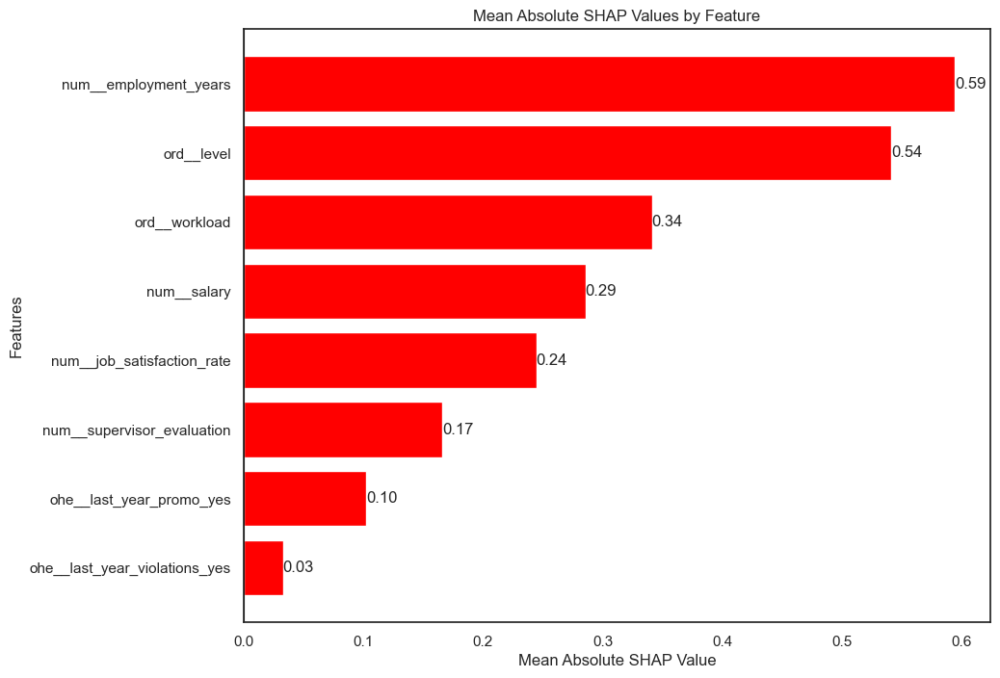

In [219]:
shap_values_array = shap_values.values

# Сортируем абсолютные значения SHAP
mean_shap_values = np.mean(np.abs(shap_values_array), axis=0)
sorted_indices = np.argsort(mean_shap_values)[::-1]

# Список для хранения категорий
categories_1 = []

feature_names = best_pipe_quit.named_steps['poly'].get_feature_names_out()

# Итерация по массиву feature_names
for feature in np.array(feature_names)[sorted_indices]:
    # Найти соответствующую категорию
    category = feature_names_table.loc[feature_names_table['Poly names'] == feature, 'Feature names']
    if not category.empty:
        categories_1.append(category.values[0])
        # Список для хранения категорий
    else:
        categories_1.append('Свободный коэффициент')


# Создаем график с увеличенной высотой
plt.figure(figsize=(10, 8))  # Увеличена высота графика
bars = plt.barh(categories_1, mean_shap_values[sorted_indices], color='red')
plt.ylabel('Features')  # Добавлена подпись к оси Y
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Mean Absolute SHAP Values by Feature')
plt.axvline(0, color='black', lw=0.8)
plt.gca().invert_yaxis()  # Инвертируем ось Y для правильного порядка

# Добавляем подписи значений
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
             f'{bar.get_width():.2f}', 
             va='center')

plt.show()

Больше всего на увольнение сотрудников влияют следующие показатели в порядке убывания:
- Количество отработанных лет (0.60);
- Должность сотрудника (0.54);
- Размер загрузки (0.34);
- Зарплата (0.28)
- Удовлетворенность работой (0.28);

Посмотрим подробней на то, как каждый признак в отдельности влияет на предсказание увольнения сотрудников.

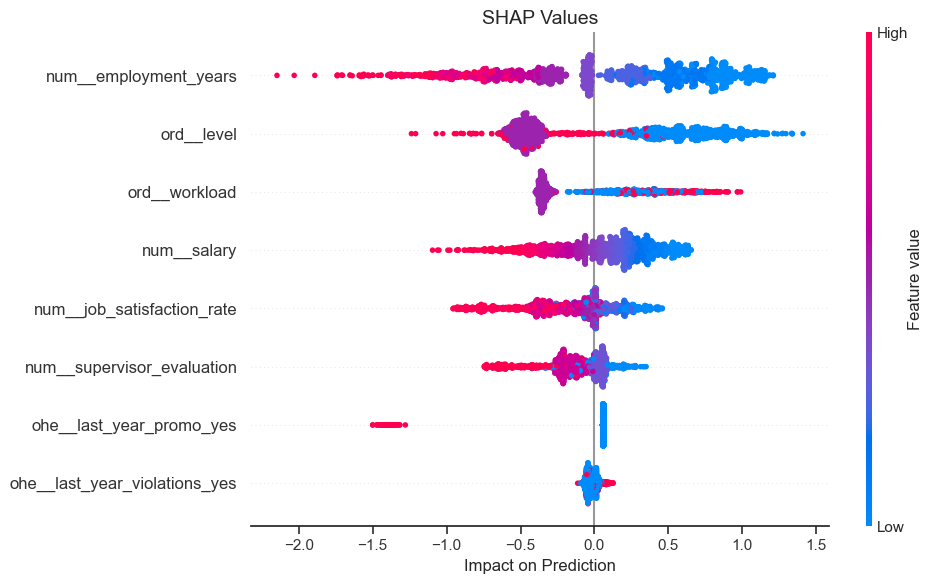

In [235]:

# Создаем фигуру и ось
fig, ax = plt.subplots(figsize=(10, 6))

# Строим beeswarm plot с отключением автоматических меток
try:
    # Пытаемся построить график (ошибка возникнет здесь)
    shap.plots.beeswarm(shap_values, show=False, plot_size=None)
except TypeError:
    pass  # Игнорируем ошибку, если график уже построен

# Получаем текущую ось и перезаписываем метки
ax = plt.gca()
ax.set_yticks(range(len(categories_1)))
ax.set_yticklabels(
    categories_1[::-1],  # Обратный порядок для совпадения с SHAP
    fontsize=12
)

# Дополнительные настройки
ax.set_title('SHAP Values', fontsize=14)
ax.set_xlabel('Impact on Prediction', fontsize=12)
plt.tight_layout()

# Показываем исправленный график
plt.show()

График SHAP (SHapley Additive exPlanations) демонстрирует влияние различных параметров на предсказание увольнения сотрудников. Вот основные моменты анализа:

1. `num_employment_years`:
   - **Влияние**: Чем больше стаж работы, тем меньше вероятность увольнения (положительные SHAP значения).
   - **Интерпретация**: Долгий срок работы может указывать на лояльность сотрудника.

2. `ord_level` и `ord_workload`:
   - **Влияние**: Высокие уровни этих признаков коррелируют с меньшей вероятностью увольнения.
   - **Интерпретация**: Более высокие уровни могут свидетельствовать о большей удовлетворенности и вовлеченности сотрудника.

3. `num_salary`:
   - **Влияние**: Более высокая зарплата ассоциируется с меньшей вероятностью увольнения.
   - **Интерпретация**: Конкурентоспособная зарплата может способствовать удержанию сотрудников.

4. `num_job_satisfaction_rate`:
   - **Влияние**: Высокий уровень удовлетворенности работой значительно снижает вероятность увольнения.
   - **Интерпретация**: Удовлетворение от работы является ключевым фактором удержания.

5. `num_supervisor_evaluation`:
   - **Влияние**: Положительно влияет на удержание, что свидетельствует о важности обратной связи от руководства.
   - **Интерпретация**: Хорошая оценка со стороны руководства может укреплять связь сотрудника с организацией.

6. `ohe_last_year_promo_yes`:
   - **Влияние**: Наличие повышения в прошлом году также связано с меньшей вероятностью увольнения.
   - **Интерпретация**: Возможности карьерного роста способствуют удержанию сотрудников.

7. `ohe_last_year_violations_yes`:
   - **Влияние**: Наличие нарушений в прошлом году значительно увеличивает риск увольнения (отрицательные SHAP значения).
   - **Интерпретация**: Проблемы с дисциплиной могут негативно сказаться на отношении к сотруднику и его удержании.

График показывает, что факторы, связанные с удовлетворенностью работой, карьерным ростом и отношениями с руководством, играют ключевую роль в удержании сотрудников. В то же время, негативные аспекты, такие как дисциплинарные нарушения, значительно увеличивают риск увольнения.

**Permutation importance**

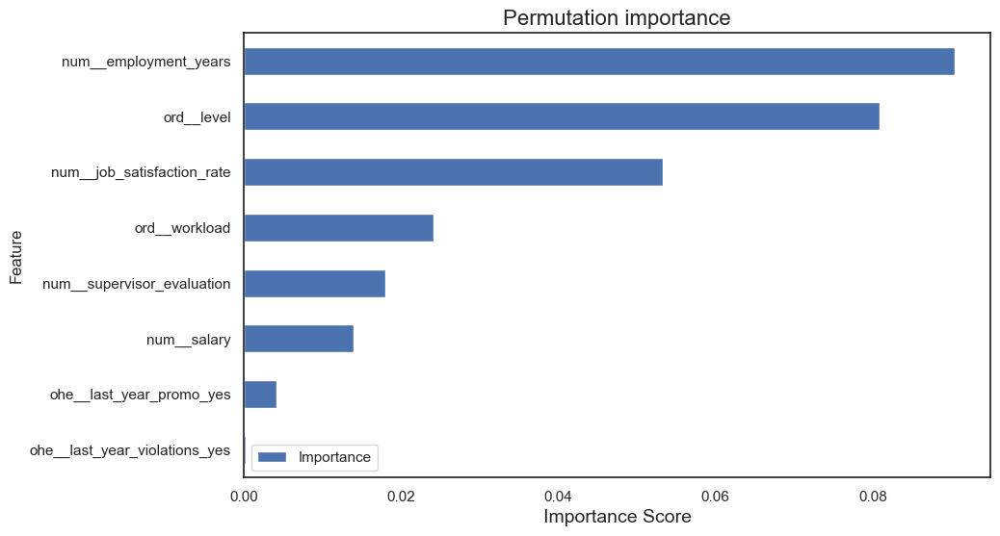

In [236]:
# Оценка важности признаков
result = permutation_importance(best_pipe_quit.named_steps['models'], X_test_quit_processed, y_test_quit, scoring='roc_auc', random_state=RANDOM_STATE)

feature_importance = pd.DataFrame({'Feature': X_test_quit_processed.columns, 'Importance': result['importances_mean']})
feature_importance = feature_importance.sort_values('Importance', ascending=True)

sns.set_style('white')

# Создаем график и сохраняем ax
ax = feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

# Список для хранения категорий
categories_perm = []

# Итерация по массиву feature_names
for feature in feature_importance['Feature'].tolist():
    # Найти соответствующую категорию
    category = feature_names_table.loc[feature_names_table['Poly names'] == feature, 'Feature names']
    if not category.empty:
        categories_perm.append(category.values[0])
    else:
        categories_perm.append('Свободный коэффициент')

# Установка пользовательских подписей на оси Y
ax.set_yticklabels(categories_perm)

# Добавление заголовка
ax.set_title('Permutation importance', fontsize=16)
# Добавление названия оси X
ax.set_xlabel('Importance Score', fontsize=14)

plt.show()

Метод permutation importance показывает, что удовлетворенность от работы является более важным признаком по сравнению с workload и salary. 

Это говорит о том, что `job_satisfaction_rate` сильно влияет на качество модели, и если не учитывать это признак, то качество модели сильно упадет.

Поэтому добавить его во входящие признаки было верным решением.

#### Выводы

**Обучение моделей**

1. **Добавление переменной**: В выборки добавлен признак `job_satisfaction_rate`, что повысило информативность модели.
   
2. **Описание признаков**:
   - **Целевая переменная**: `quit` (увольнение).
   - **Категориальные признаки**: включают департамент, прошлогодние нарушения и продвижения.
   - **Ранговые признаки**: уровень должности и рабочая нагрузка.
   - **Количественные признаки**: годы работы, оценка руководителя, зарплата и уровень удовлетворенности работой.

3. **Выбор метрики**: Использована метрика ROC-AUC для оценки качества моделей.

**Подготовка данных**

- Данные были закодированы и подготовлены для использования в моделях.

**Обновление пайплайна и поиск моделей**

1. **Базовые модели**: Все базовые классификационные модели показали результаты ROC-AUC >= 0.87, кроме дерева решений.
   
2. **Подбор гиперпараметров**: Использованы различные модели (DecisionTreeClassifier, KNeighborsClassifier, LogisticRegression, SVC) с настройкой гиперпараметров и предобработкой данных. Входящие признаки были отобраны методом SelectKBest, была протестирована полиномизация признаков.

3. **Лучшие модели**:
   - Линейная регрессия с полиномизацией показала ROC-AUC 0.916111, но снизила интерпретируемость.
   - SVC (0.915739) оказалась почти такой же эффективной, но более интерпретируемой. Данная модель была выбрана в качестве лучшей.

**Качество модели на тестовой выборке**

- Метрики на тестовой выборке хорошие. Важность признаков проанализирована:
  - **Уровень должности**: 0.48 (наиболее значимый).
  - **Удовлетворенность работой**: 0.29.
  - **Рабочая нагрузка**: 0.11.
  - **Зарплата**: 0.06.
  - **Годы работы**: 0.05.

**Выводы**

1. **Критические факторы увольнения**: Количество отработанных лет и должность являются основными факторами, влияющими на увольнение.
   - SHAP подтвердил влияние ключевых признаков.
   - Метод permutation importance выделил `job_satisfaction_rate` как третий по значимости признак, подчеркивая необходимость его учета.
  
2. **Рекомендации**:
   - Повышение уровня удовлетворенности работой.
   - Обеспечение адекватной рабочей нагрузки для снижения увольнений.

Добавление признака удовлетворенности работой значительно повысило качество модели, что подтверждает важность этого фактора в удержании сотрудников.

## Заключение

Исследование компании «Работа с заботой» направлено на использование методов машинного обучения для оценки уровня удовлетворенности сотрудников и предсказания вероятности их увольнения.

**Цели и задачи:**

Компания «Работа с заботой» проводит исследование для решения двух задач:
1. Построение модели предсказания уровня удовлетворенности сотрудников.
2. Разработка модели предсказания вероятности увольнения сотрудников.

**Задача 1: Предсказание уровня удовлетворённости сотрудника**

1. **Обработка данных**: выявлены и обработаны пропуски и неявные дубликаты. В данных есть большое количество дублирующихся записей с разным `id`.
2. **Анализ признаков**: установлены связи между уровнем удовлетворенности и факторами, такими как время работы, оценки руководителя и зарплата.
3. **Моделирование**: протестированы модели DecisionTreeRegressor и LinearRegression. Лучшие результаты показала модель дерева решений с высокими показателями предсказательной способности.
4. **Влияние факторов**: оценка супервайзера оказалась наиболее значимым фактором удовлетворенности, далее следуют зарплата и стаж работы.

**Выводы**
- **Ключевые факторы**: Обратная связь от руководства, зарплата и стаж работы существенно влияют на удовлетворенность сотрудников.

**Рекомендации**:
- Улучшить систему обратной связи.
- Пересмотреть компенсационные пакеты.
- Создать программы карьерного роста.
- Установить мониторинг соблюдения норм.
- Рассмотреть гибкие условия труда.
- Оценивать и контролировать рабочую нагрузку.

**Задача 2: Предсказание увольнения сотрудника из компании**

1. **Предсказание увольнения**
   - **Обработка данных**: Текстовые данные и дубликаты не потребовали изменений.
   - **Дисбаланс классов**: 28% записей относятся к уволившимся.
   - **Профиль уволившегося сотрудника**:
     - Junior-специалист с низкой зарплатой.
     - Низкая оценка работы, частые нарушения контракта.
   - **Причины увольнения**: Низкая зарплата, отсутствие задач, средняя оценка.

**Уровень удовлетворенности и увольнения**
- **Связь**: Была проверена гипотеза о том, что оставшиеся сотрудники имеют более высокую средню удовлетворенность работой, чем уволившиеся. Опровергнуть гипотезу не удалось с высоким уровенм статистической значимости.
- **Потеря значимости**: После 6 лет работы удовлетворенность теряет влияние.
- 

**Обучение моделей**
- **Добавление переменной**: Признак job_satisfaction_rate повысил качество моделей.
- **Метрика**: ROC-AUC, результаты >= 0.91.
- **Лучшая модель**: SVC, ROC-AUC 0.9157.

**Качество модели**
- **Критические факторы**: Количество отработанных лет, должность и удовлетворенность от работы.

**Рекомендации**:
- **Увеличение загрузки**: Предоставление большего количества задач.
- **Оплата труда**: Введение системы бонусов для младших сотрудников.
- **Обратная связь**: Регулярные встречи руководителей с сотрудниками для улучшения обратной связи.
- **Гибкость правил**: Упрощение правил для новых сотрудников.

Эти рекомендации помогут повысить уровень удовлетворенности сотрудников и снизить вероятность их увольнения, что в свою очередь будет способствовать улучшению общей атмосферы и продуктивности в компании.